In [1]:
import os
import time
import numpy as np
import h5py
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter

import seaborn as sns

from scipy.stats import spearmanr, pearsonr, ranksums

import gc

#PWM sequence logo and score visualization code
import matplotlib

import matplotlib.cm as cm
import matplotlib.colors as colors
import colorsys

import matplotlib as mpl
from matplotlib.text import TextPath
from matplotlib.patches import PathPatch, Rectangle
from matplotlib.font_manager import FontProperties
from matplotlib import gridspec
from matplotlib.ticker import FormatStrFormatter

#Helper function to draw a letter at a given position
def dna_letter_at(letter, x, y, yscale=1, ax=None, color=None, alpha=1.0):

    #Define letter heights and colors
    fp = FontProperties(family="DejaVu Sans", weight="bold")
    globscale = 1.35
    LETTERS = {	"T" : TextPath((-0.305, 0), "T", size=1, prop=fp),
                "G" : TextPath((-0.384, 0), "G", size=1, prop=fp),
                "A" : TextPath((-0.35, 0), "A", size=1, prop=fp),
                "C" : TextPath((-0.366, 0), "C", size=1, prop=fp),
                "UP" : TextPath((-0.488, 0), '$\\Uparrow$', size=1, prop=fp),
                "DN" : TextPath((-0.488, 0), '$\\Downarrow$', size=1, prop=fp),
                "(" : TextPath((-0.25, 0), "(", size=1, prop=fp),
                "." : TextPath((-0.125, 0), "-", size=1, prop=fp),
                ")" : TextPath((-0.1, 0), ")", size=1, prop=fp)}
    COLOR_SCHEME = {'G': 'orange',#'orange', 
                    'A': 'green',#'red', 
                    'C': 'blue',#'blue', 
                    'T': 'red',#'darkgreen',
                    'UP': 'green', 
                    'DN': 'red',
                    '(': 'black',
                    '.': 'black', 
                    ')': 'black'}


    text = LETTERS[letter]

    #Choose color
    chosen_color = COLOR_SCHEME[letter]
    if color is not None :
        chosen_color = color

    #Draw letter onto axis
    t = mpl.transforms.Affine2D().scale(1*globscale, yscale*globscale) + \
        mpl.transforms.Affine2D().translate(x,y) + ax.transData
    p = PathPatch(text, lw=0, fc=chosen_color, alpha=alpha, transform=t)
    if ax != None:
        ax.add_artist(p)
    
    return p

#Function to plot a sequence logo of a PWM
def plot_pwm(pwm, figsize=(16, 2), plot_y_ticks=True, y_min=None, y_max=None, save_figs=False, fig_name="default") :
    
    fig = plt.figure(figsize=figsize)

    ax = plt.gca()
    
    height_base = 0.
    logo_height = 1.0
    
    #Conservation = Max_Bits - Entropy
    conservation = 2. - np.sum(-pwm * np.log2(pwm + 1e-6), axis=1)
    
    #Loop over sequence positions
    for j in range(0, pwm.shape[0]) :
        sort_index = np.argsort(pwm[j, :])

        #Loop over nucleotide identities
        for ii in range(0, 4) :
            i = sort_index[ii]

            #Calculate prob * conservation
            nt_prob = pwm[j, i] * conservation[j]

            #Decode letter from nucleotide identity
            nt = ''
            if i == 0 :
                nt = 'A'
            elif i == 1 :
                nt = 'C'
            elif i == 2 :
                nt = 'G'
            elif i == 3 :
                nt = 'T'

            #Draw letter at position (height proportional to conservation)
            color = None
            if ii == 0 :
                dna_letter_at(nt, j + 0.5, height_base, nt_prob * logo_height, ax, color=color)
            else :
                prev_prob = np.sum(pwm[j, sort_index[:ii]]) * logo_height  * conservation[j]
                dna_letter_at(nt, j + 0.5, height_base + prev_prob, nt_prob * logo_height, ax, color=color)
    
    plt.sca(ax)
    plt.xticks([], [])
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    
    plt.xlim((0, pwm.shape[0]))
    
    #plt.axis('off')
    
    #Remove x-axis ticks
    if plot_y_ticks :
        plt.yticks(fontsize=12)
    else :
        plt.yticks([], [])
    
    #Set axis limits
    if y_min is not None and y_max is not None :
        plt.ylim(y_min, y_max)
    elif y_min is not None :
        plt.ylim(y_min)
    else :
        plt.ylim(
            min(0., np.min(np.sum(pwm, axis=-1))) - 0.01 * np.max(np.abs(np.sum(pwm, axis=-1))),
            max(0., np.max(np.sum(pwm, axis=-1))) + 0.01 * np.max(np.abs(np.sum(pwm, axis=-1)))
        )
    
    plt.axhline(y=0., color='black', linestyle='-', linewidth=1)

    #for axis in fig.axes :
    #    axis.get_xaxis().set_visible(False)
    #    axis.get_yaxis().set_visible(False)

    plt.tight_layout()

    if save_figs :
        plt.savefig(fig_name + ".png", transparent=True, dpi=300)
        plt.savefig(fig_name + ".eps")

    plt.show()

#Function to interpolate color
def lighten_color(color, amount=0.5):
    try:
        c = colors.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*colors.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

#Function to plot pwms and gradient saliency distributions for a collection of modisco metaclusters
def plot_modisco_interpretation(tissue_i, rasterize_dpi=None, y_min_fixed=None, y_max_fixed=None, tissue_colors=['red', 'darkorange', 'darkblue'], qtls=[0.50, 0.80, 0.95], shades=[1.0, 0.8, 0.6], markers=['o', 's', 'D'], fill_between=True, y_qtl=0.02, n_cols=5, col_width=1.5, n_motifs_per_tissue=10, plot_corrs=False, plot_all_corrs=False, save_figs=False, save_prefix='default_') :

    print("[Salient Motifs for Tissue = '" + tissue_names[tissue_i] + "']")
    print("")

    print("-- Motif PWMs --")
    
    #Loop over PWMs
    for pwm_i in range(len(pwms[tissue_i])) :
        print(pwm_configs[tissue_i][pwm_i][0])
        
        #Plot PWM sequence logo
        plot_pwm(pwms[tissue_i][pwm_i], figsize=(0.2 * pwms[tissue_i][pwm_i].shape[0], 1), y_min=0., y_max=2., plot_y_ticks=False, save_figs=save_figs, fig_name=save_prefix + tissue_names[tissue_i] + "_" + pwm_configs[tissue_i][pwm_i][0].replace("/", "_") + "_pwm")

    #Plot tissue-specific score distributions
    n_cols = min(n_cols, len(pwm_scores[tissue_i]))

    #Get global y-axis limits
    y_min = np.min([np.min(np.quantile(pwm_scores[tissue_i][pwm_i], q=y_qtl, axis=0)) for pwm_i in range(len(pwm_scores[tissue_i]))])
    y_max = np.max([np.max(np.quantile(pwm_scores[tissue_i][pwm_i], q=1. - y_qtl, axis=0)) for pwm_i in range(len(pwm_scores[tissue_i]))])

    n_rows = len(pwm_scores[tissue_i]) // n_cols + (1 if len(pwm_scores[tissue_i]) % n_cols > 0 else 0)

    print("-- Motif Score Distributions --")
    
    #Loop over motif rows
    for row_ix in range(n_rows) :

        #Plot score distribution for a batch of motifs
        f, ax = None, None
        if rasterize_dpi is None :
            f, ax = plt.subplots(1, n_cols, figsize=(col_width * n_cols, 4))
        else :
            f, ax = plt.subplots(1, n_cols, figsize=(col_width * n_cols, 4), dpi=rasterize_dpi)

        col_start = row_ix * n_cols
        
        #Structures to store pairwise gradient correlations
        r_mat = np.zeros((n_cols, len(tissue_names), len(tissue_names)))
        r_main = np.zeros((n_cols, len(tissue_names)))

        #Loop over motifs
        for pwm_i in range(col_start, col_start+n_cols) :
            
            print("Motif = '" + pwm_configs[tissue_i][pwm_i][0] + "'")
            
            col_i = pwm_i % n_cols
            
            main_tissue_ix = (pwm_i % (len(tissue_names) * n_motifs_per_tissue)) // n_motifs_per_tissue
            
            plt.sca(ax[col_i])
            
            if pwm_i >= len(pwm_scores[tissue_i]) :
                plt.axis('off')
                
                continue

            pwm_score = pwm_scores[tissue_i][pwm_i]

            n = pwm_score.shape[0]
            
            print(" - n = " + str(n))
            
            #Calculate two-sided wilcoxon p-values for main tissue vs other tissues
            if n > 10 :
                #Loop over (other) tissues
                for score_ix in range(pwm_score.shape[1]) :
                    if score_ix != main_tissue_ix :
                        s_val, p_val = ranksums(pwm_score[:, main_tissue_ix], pwm_score[:, score_ix], alternative='two-sided')
                        print(" - Wilcoxon p ('" + tissue_names[main_tissue_ix] + "' vs '" + tissue_names[score_ix] + "') = " + str('{:.2e}'.format(p_val)) + " (s = " + str(round(s_val, 2)) + ")")

            #Calculate pairwise gradient correlations
            
            #Loop over tissue pairs
            if n > 10 :
                for tissue_1_ix in range(pwm_score.shape[1]) :
                    for tissue_2_ix in range(tissue_1_ix + 1, pwm_score.shape[1]) :
                        r_mat[col_i, tissue_1_ix, tissue_2_ix] = spearmanr(pwm_score[:, tissue_1_ix], pwm_score[:, tissue_2_ix])[0]
                        r_mat[col_i, tissue_2_ix, tissue_1_ix] = r_mat[col_i, tissue_1_ix, tissue_2_ix]

            #Loop over tissues
            if n > 10 :
                for score_ix in range(pwm_score.shape[1]) :
                    r_main[col_i, score_ix] = r_mat[col_i, main_tissue_ix, score_ix]

            #Draw distribution plots
            if rasterize_dpi is None :
                sns.stripplot(data=pwm_score.T.tolist(), palette='dark:black', s=2, alpha=0.1, jitter=0.2)
            else :
                sns.stripplot(data=pwm_score.T.tolist(), palette='dark:black', s=2, alpha=0.1, jitter=0.2, rasterized=True)

            #Loop over and annotate score distributions per tissue
            for score_ix in range(pwm_score.shape[1]) :

                min_qtl_val = y_max

                #Loop over qtl limits
                for qtl_ix, qtl in enumerate(qtls) :

                    qtl_val = np.quantile(pwm_score[:, score_ix], q=qtl)
                    plt.plot([score_ix - 0.5, score_ix + 0.5], [qtl_val, qtl_val], color=lighten_color(tissue_colors[score_ix], shades[qtl_ix]), linewidth=1, linestyle='-', zorder=-1000)

                    #Draw markers
                    if pwm_i < n_cols - 1 or score_ix > 0 :
                        plt.scatter([score_ix - 0.5], [qtl_val], color=lighten_color(tissue_colors[score_ix], shades[qtl_ix]), s=30, edgecolor='black', linewidth=0.75, marker=markers[qtl_ix])
                    else :
                        plt.scatter([score_ix - 0.5], [qtl_val], color=lighten_color(tissue_colors[score_ix], shades[qtl_ix]), s=30, edgecolor='black', linewidth=0.75, marker=markers[qtl_ix], label=str(int(100. * qtl)) + 'th p.')

                    #Draw shaded area
                    if fill_between and qtl_ix > 0 :
                        plt.fill_between(
                            [score_ix - 0.5, score_ix + 0.5],
                            [prev_qtl_val, prev_qtl_val],
                            [qtl_val, qtl_val],
                            color=lighten_color(tissue_colors[score_ix], shades[qtl_ix]),
                            alpha=0.25
                        )

                    #Cache previous qtl value
                    prev_qtl_val = qtl_val

                    #Find smallest plotted qtl value
                    min_qtl_val = min(min_qtl_val, qtl_val)

                #Truncate at 0
                min_qtl_val = max(0., min_qtl_val)

                #Draw shaded area
                if fill_between and min_qtl_val > 0 :
                    plt.fill_between(
                        [score_ix - 0.5, score_ix + 0.5],
                        [0, 0],
                        [min_qtl_val, min_qtl_val],
                        color=lighten_color(tissue_colors[score_ix], max(shades[0] - 0.2, 0.2)),
                        alpha=0.25
                    )

            plt.axhline(y=0., linewidth=1, linestyle='--', color='black', zorder=-1000)

            #Define y-axis limits
            if y_min_fixed is None and y_max_fixed is None :
                plt.ylim(y_min, y_max)
            else :
                plt.ylim(y_min_fixed, y_max_fixed)

            #Set axis labels
            if col_i > 0 :
                plt.yticks([], [])
            else :
                plt.yticks(fontsize=8)
                plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

                plt.ylabel('Gradient Saliency (log2)', fontsize=8)

            plt.xticks(np.arange(pwm_score.shape[1]), tissue_names, fontsize=8, rotation=60)
            plt.xlim(-0.5, pwm_score.shape[1] - 0.5)

            #Set legend
            if col_i == n_cols - 1 :
                plt.legend(fontsize=8, loc='upper right')

            plt.title(pwm_configs[tissue_i][pwm_i][0] + "\n(n = " + str(n) + ")", fontsize=8)

        plt.tight_layout()

        #Save figure
        if save_figs :
            fig_name = save_prefix + tissue_names[tissue_i] + "_row_" + str(row_ix) + "_scores" + ("_rasterized" if rasterize_dpi is not None else "")

            if rasterize_dpi is None :
                plt.savefig(fig_name + ".png", transparent=True, dpi=600)
                plt.savefig(fig_name + ".eps")
            else :
                plt.savefig(fig_name + ".pdf")

        plt.show()
        
        if plot_all_corrs :
            #Visualize pairwise gradient correlations
            f, ax = plt.subplots(1, n_cols, figsize=(col_width * n_cols, col_width))

            col_start = row_ix * n_cols

            #Loop over motifs
            for pwm_i in range(col_start, col_start+n_cols) :

                col_i = pwm_i % n_cols
            
                main_tissue_ix = (pwm_i % (len(tissue_names) * n_motifs_per_tissue)) // n_motifs_per_tissue

                plt.sca(ax[col_i])

                if pwm_i >= len(pwm_scores[tissue_i]) :
                    plt.axis('off')

                    continue

                #Plot and annotate heatmap with spearman correlations
                plt.imshow(r_mat[col_i], cmap='bwr', vmin=-1.0, vmax=1.0, aspect='equal')

                for y in range(r_mat.shape[1]):
                    for x in range(r_mat.shape[2]):
                        if r_mat[col_i, y, x] != 0. and not np.isnan(r_mat[col_i, y, x]) :
                            plt.text(x, y, '%.2f' % r_mat[col_i, y, x], fontsize=8, horizontalalignment='center', verticalalignment='center')

                plt.xticks(np.arange(pwm_score.shape[1]), tissue_names, fontsize=8, rotation=30)
                plt.yticks(np.arange(pwm_score.shape[1]), tissue_names, fontsize=8, rotation=60)

                plt.title(pwm_configs[tissue_i][pwm_i][0], fontsize=8)

            plt.tight_layout()

            if save_figs :
                fig_name = save_prefix + tissue_names[tissue_i] + "_row_" + str(row_ix) + "_score_corrs"

                plt.savefig(fig_name + ".png", transparent=True, dpi=300)
                plt.savefig(fig_name + ".eps")

            plt.show()
        
        if plot_corrs :
            #Visualize pairwise gradient correlations (main tissue only)
            f, ax = plt.subplots(1, n_cols, figsize=(col_width * n_cols, col_width))

            col_start = row_ix * n_cols

            #Loop over motifs
            for pwm_i in range(col_start, col_start+n_cols) :

                col_i = pwm_i % n_cols

                main_tissue_ix = (pwm_i % (len(tissue_names) * n_motifs_per_tissue)) // n_motifs_per_tissue

                plt.sca(ax[col_i])

                if pwm_i >= len(pwm_scores[tissue_i]) :
                    plt.axis('off')

                    continue

                #Plot and annotate heatmap with spearman correlations
                plt.imshow(r_main[col_i, None, :], cmap='bwr', vmin=-1.0, vmax=1.0, aspect='equal')

                for x in range(r_main.shape[1]):
                    if r_main[col_i, x] != 0. and not np.isnan(r_main[col_i, x]) :
                        plt.text(x, 0., '%.2f' % r_main[col_i, x], fontsize=8, horizontalalignment='center', verticalalignment='center')

                plt.xticks(np.arange(pwm_score.shape[1]), tissue_names, fontsize=8, rotation=30)
                plt.yticks([0.], [tissue_names[main_tissue_ix]], fontsize=8, rotation=60)

                plt.title(pwm_configs[tissue_i][pwm_i][0], fontsize=8)

            plt.tight_layout()

            if save_figs :
                fig_name = save_prefix + tissue_names[tissue_i] + "_row_" + str(row_ix) + "_score_corrs_main"

                plt.savefig(fig_name + ".png", transparent=True, dpi=300)
                plt.savefig(fig_name + ".eps")

            plt.show()


In [2]:
#Load tissue-specific gene scores

tissues = [
    'blood',
    'liver',
    'brain_cortex',
    'muscle',
]

score_files = [
    'scores_v2/gtex_blood_log2fc_undo_clip_scores_mean.h5',
    'scores_v2/gtex_liver_log2fc_undo_clip_scores_mean.h5',
    'scores_v2/gtex_brain_log2fc_undo_clip_scores_mean.h5',
    'scores_v2/gtex_muscle_log2fc_undo_clip_scores_mean.h5',
]

gene_file = "/home/jlinder/seqnn/data/diff_expr/gtex_diff_expr_log2fc_5k.csv"

center_bp = 131072

tissue_dfs = []
tissue_seqs = []
tissue_scores = []

tissue_genes = []
tissue_chroms = []
tissue_strands = []
tissue_starts = []
tissue_ends = []

#Loop over tissue-specific genes and load scores
for tissue_i, tissue in enumerate(tissues) :
    
    print("Loading scores for tissue = '" + tissue + "'")
    
    #Load gene dataframe and select tissue
    gene_df = pd.read_csv(gene_file, sep='\t')
    gene_df = gene_df.query("tissue == '" + str(tissue) + "'").copy().reset_index(drop=True)
    gene_df = gene_df.drop(columns=['Unnamed: 0'])

    print("len(gene_df) = " + str(len(gene_df)))

    #Get list of gene for tissue
    tissue_genes_curr = gene_df['gene_base'].values.tolist()

    print("len(tissue_genes_curr) = " + str(len(tissue_genes_curr)))
    
    #Load contribution scores per tissue
    all_hyp_scores = []
    all_scores = []
    
    genes = None
    chrs = None
    strands = None
    starts = None
    ends = None
    
    #Load gradient h5 score files (for all output tissue tracks)
    for score_file_i, score_file in enumerate(score_files) :
        print("Loading score file = '" + score_file + "'")
        
        #Read h5 file
        with h5py.File(score_file, 'r') as scores_h5 :
            
            seq_len = scores_h5['grads'].shape[1]
            
            #Calculate relative positions to crop within
            pos_start = seq_len//2 - center_bp//2
            pos_end = pos_start + center_bp
            
            #Get hypothetical scores
            hyp_scores = scores_h5['grads'][:, pos_start:pos_end, :]
            seqs_1hot = scores_h5['seqs'][:, pos_start:pos_end]
            
            seq_genes = [gene.decode('UTF-8') for gene in scores_h5['gene']]
            
            #Get auxiliary information
            seq_strands = [strand.decode() for strand in scores_h5['strand']]
            seq_chrs = [chrom.decode() for chrom in scores_h5['chr']]

            seq_starts = np.array(scores_h5['start'][()] + pos_start, dtype='int32').tolist()
            seq_ends = np.array(scores_h5['end'][()] - (seq_len - pos_end), dtype='int32').tolist()

            #Filter out tissue-specific genes
            gene_dict = {gene.split(".")[0] : gene_i for gene_i, gene in enumerate(seq_genes)}

            #Get index of rows to keep
            keep_index = []
            for tissue_gene in tissue_genes_curr :
                keep_index.append(gene_dict[tissue_gene])

            #Filter/sub-select data
            hyp_scores = hyp_scores[keep_index, ...]
            seqs_1hot = seqs_1hot[keep_index, ...]
            
            #This information is identical for all output tissue tracks
            if score_file_i == 0 :
                genes = [seq_genes[k_ix] for k_ix in keep_index]
                chrs = [seq_chrs[k_ix] for k_ix in keep_index]
                strands = [seq_strands[k_ix] for k_ix in keep_index]
                starts = [seq_starts[k_ix] for k_ix in keep_index]
                ends = [seq_ends[k_ix] for k_ix in keep_index]
            
            #Aggregate over replicate tissue tracks
            hyp_scores = hyp_scores.mean(axis=-1, dtype='float32')
            
            #Get input-gated scores
            scores = np.multiply(hyp_scores, seqs_1hot)
            
            #Accumulate score tensor
            ##all_hyp_scores.append(hyp_scores[None, ...])
            all_scores.append(scores[None, ...])
            
            #Collect garbage
            gc.collect()
    
    #Construct tissue-specific score tensors
    ##hyp_scores = np.concatenate(all_hyp_scores, axis=0)
    scores = np.concatenate(all_scores, axis=0)
    
    #Accumulate data per tissue
    tissue_dfs.append(gene_df)
    tissue_seqs.append(seqs_1hot)
    tissue_scores.append(scores)
    
    tissue_genes.append(genes)
    tissue_chroms.append(chrs)
    tissue_strands.append(strands)
    tissue_starts.append(starts)
    tissue_ends.append(ends)
    
    #Collect garbage
    gc.collect()


Loading scores for tissue = 'blood'
len(gene_df) = 1000
len(tissue_genes_curr) = 1000
Loading score file = 'scores_v2/gtex_blood_log2fc_undo_clip_scores_mean.h5'
Loading score file = 'scores_v2/gtex_liver_log2fc_undo_clip_scores_mean.h5'
Loading score file = 'scores_v2/gtex_brain_log2fc_undo_clip_scores_mean.h5'
Loading score file = 'scores_v2/gtex_muscle_log2fc_undo_clip_scores_mean.h5'
Loading scores for tissue = 'liver'
len(gene_df) = 1000
len(tissue_genes_curr) = 1000
Loading score file = 'scores_v2/gtex_blood_log2fc_undo_clip_scores_mean.h5'
Loading score file = 'scores_v2/gtex_liver_log2fc_undo_clip_scores_mean.h5'
Loading score file = 'scores_v2/gtex_brain_log2fc_undo_clip_scores_mean.h5'
Loading score file = 'scores_v2/gtex_muscle_log2fc_undo_clip_scores_mean.h5'
Loading scores for tissue = 'brain_cortex'
len(gene_df) = 1000
len(tissue_genes_curr) = 1000
Loading score file = 'scores_v2/gtex_blood_log2fc_undo_clip_scores_mean.h5'
Loading score file = 'scores_v2/gtex_liver_log2fc

In [4]:
#Load modisco result files

ic_t = 0.1
gc_content = 0.41

padding_bp = 0

e_thresh = 0.1

allow_dups = False

enforce_sign_consistency = True

tissue_names = [
    'blood',
    'liver',
    'brain',
    'muscle',
]

modisco_files = [
    'gtex_log2fc_blood_40k_diff_4_folds/tfm.h5',
    'gtex_log2fc_liver_40k_diff_4_folds/tfm.h5',
    'gtex_log2fc_brain_40k_diff_4_folds/tfm.h5',
    'gtex_log2fc_muscle_40k_diff_4_folds/tfm.h5',
]

modisco_signs = [
    1,
    1,
    -1,
    1,
]

tsv_files = [
    'gtex_log2fc_blood_40k_diff_4_folds/tomtom_gtex_log2fc_blood_40k_diff_4_folds.tsv',
    'gtex_log2fc_liver_40k_diff_4_folds/tomtom_gtex_log2fc_liver_40k_diff_4_folds.tsv',
    'gtex_log2fc_brain_40k_diff_4_folds/tomtom_gtex_log2fc_brain_40k_diff_4_folds.tsv',
    'gtex_log2fc_muscle_40k_diff_4_folds/tomtom_gtex_log2fc_muscle_40k_diff_4_folds.tsv',
]

#Match motif display names to HOCOMOCO names
modisco_motifs = [
    [
        #Blood motifs
        ['SPI1/B', ['SPI1', 'SPIB']],
        ['CEBPA/B', ['CEBPA', 'CEBPB']],
        ['NFE2/JUN/D', ['NFE2', 'JUND', 'JUN']],
        ['GATA1/2/4', ['GATA1', 'GATA2', 'GATA4']],
        ['SOX2/3', ['SOX2', 'SOX3']],
        ['IRF1/2', ['IRF1', 'IRF2']],
        ['RUNX3', ['RUNX3']],
        ['IRF8', ['IRF8']],
        ['(Empty)', ['EMPTYEMPTYEMPTY']],
        ['(Empty)', ['EMPTYEMPTYEMPTY']],
    ],
    [
        #Liver motifs
        ['HNF4G', ['HNF4G']],
        ['FOXA1/C1/A3/J3', ['FOXA1', 'FOXC1', 'FOXA3', 'FOXJ3']],
        ['SOX4/5', ['SOX4', 'SOX5']],
        ['HNF6', ['HNF6']],
        ['HNF1A', ['HNF1A']],
        ['NFIA/C', ['NFIA', 'NFIC']],
        ['(Empty)', ['EMPTYEMPTYEMPTY']],
        ['(Empty)', ['EMPTYEMPTYEMPTY']],
        ['(Empty)', ['EMPTYEMPTYEMPTY']],
        ['(Empty)', ['EMPTYEMPTYEMPTY']],
    ],
    [
        #Brain motifs
        ['ZEB1', ['ZEB1']],
        ['NDF2', ['NDF2', 'NEUROD2']], #NEUROD2
        ['SOX9', ['SOX9']],
        ['MYCN', ['MYCN']],
        ['MEF2D', ['MEF2D']],
        ['REST', ['REST']],
        ['NFYA/B', ['NFYA', 'NFYB']],
        ['RFX5', ['RFX5']],
        ['SP2', ['SP2']],
        ['CTCF', ['CTCF']],
    ],
    [
        #Muscle motifs
        ['MYOG/D1', ['MYOG', 'MYOD1']],
        ['TEAD1/4', ['TEAD1', 'TEAD4']],
        ['SIX1/2', ['SIX1', 'SIX2']],
        ['GCR', ['GCR', 'NR3C1']], #NR3C1
        ['ATF1/2', ['ATF1', 'ATF2']],
        ['ERR1/2/3', ['ERR1', 'ERR2', 'ERR3', 'ESRRA']], #ESRRA
        ['NF2L2', ['NF2L2', 'NFE2L2']],
        ['(Empty)', ['EMPTYEMPTYEMPTY']],
        ['(Empty)', ['EMPTYEMPTYEMPTY']],
        ['(Empty)', ['EMPTYEMPTYEMPTY']],
    ],
]

#Parse .tsv files and map motifs to modisco clusters
pwm_configs = []

#Loop over tissues and load .tsv files
for tissue_i, tissue in enumerate(tissue_names) :
    
    print("Loading tomtom .tsv for tissue = '" + tissue + "'")
    
    tsv_df = pd.read_csv(tsv_files[tissue_i], sep='\t')
    
    #Filter on maximum allowed E-value
    tsv_df = tsv_df.loc[tsv_df['E-value'] <= e_thresh].copy().reset_index(drop=True)
    
    tsv_df['metacluster'] = tsv_df['Query_ID'].apply(lambda x: x.split("etacluster_")[1].split("_pattern")[0]).astype(int)
    tsv_df['pattern'] = tsv_df['Query_ID'].apply(lambda x: x.split("pattern_")[1]).astype(int)
    
    #Get positive and negative motif hits
    tsv_df_pos = tsv_df.loc[tsv_df['Query_ID'].str.contains(('metacluster_0' if modisco_signs[tissue_i] == 1 else 'metacluster_1'))].copy().reset_index(drop=True)
    tsv_df_neg = tsv_df.loc[tsv_df['Query_ID'].str.contains(('metacluster_1' if modisco_signs[tissue_i] == 1 else 'metacluster_0'))].copy().reset_index(drop=True)
    
    #Uniquely assign metaclusters to motif matches
    if not allow_dups :
        
        #Get flat list of motifs to search for
        modisco_motifs_flat = []
        modisco_prios_flat = []
        for tissue_j, _ in enumerate(tissue_names) :
            for [motif_name, motifs] in modisco_motifs[tissue_j] :
                for motif in motifs :
                    modisco_motifs_flat.append(motif)
                    modisco_prios_flat.append(1 if tissue_i == tissue_j else 2)
        
        #Filter positive cluster-motif rows
        keep_index = []
        prios = []
        for row_i, [_, row] in enumerate(tsv_df_pos.iterrows()) :
            
            found_hit = False
            found_prio = -1
            for motif, prio in zip(modisco_motifs_flat, modisco_prios_flat) :
                if motif in row['Target_ID'] :
                    found_hit = True
                    found_prio = prio
                    break
            
            if found_hit :
                keep_index.append(row_i)
                prios.append(found_prio)
        
        tsv_df_pos = tsv_df_pos.iloc[keep_index].copy().reset_index(drop=True)
        tsv_df_pos['prio'] = prios
        
        tsv_df_pos = tsv_df_pos.sort_values(by=[
            'metacluster',
            'pattern',
            'prio',
            'p-value',
        ], ascending=[
            True,
            True,
            True,
            True,
        ]).drop_duplicates(subset=['Query_ID'], keep='first').copy().reset_index(drop=True)
        
        #Filter negative cluster-motif rows
        keep_index = []
        prios = []
        for row_i, [_, row] in enumerate(tsv_df_neg.iterrows()) :
            
            found_hit = False
            found_prio = -1
            for motif, prio in zip(modisco_motifs_flat, modisco_prios_flat) :
                if motif in row['Target_ID'] :
                    found_hit = True
                    found_prio = prio
                    break
            
            if found_hit :
                keep_index.append(row_i)
                prios.append(found_prio)
        
        tsv_df_neg = tsv_df_neg.iloc[keep_index].copy().reset_index(drop=True)
        tsv_df_neg['prio'] = prios
        
        tsv_df_neg = tsv_df_neg.sort_values(by=[
            'metacluster',
            'pattern',
            'prio',
            'p-value',
        ], ascending=[
            True,
            True,
            True,
            True,
        ]).drop_duplicates(subset=['Query_ID'], keep='first').copy().reset_index(drop=True)
    
    used_dict = {}
    
    #Build pwm config
    
    tissue_config_pos = []
    tissue_config_neg = []
    
    #Loop over tissues
    for tissue_j, _ in enumerate(tissue_names) :
        
        #Loop over motif configurations related to tissue
        for [motif_name, motifs] in modisco_motifs[tissue_j] :

            pos_config = [motif_name + '_pos', [], [], []]
            pos_dict = {}

            neg_config = [motif_name + '_neg', [], [], []]
            neg_dict = {}

            #Loop over motif IDs belonging to the family of motifs
            for motif in motifs :

                #Get subset of positive hits
                pos_matches = tsv_df_pos.loc[tsv_df_pos['Target_ID'].str.contains(motif)]['Query_ID'].values.tolist()

                for pos_match in pos_matches :
                    if pos_match not in pos_dict and (allow_dups or pos_match not in used_dict) :
                        pos_config[1].append(pos_match)
                        pos_config[2].append(None)
                        pos_config[3].append(False)
                        pos_dict[pos_match] = True
                        used_dict[pos_match] = True

                #Get subset of negative hits
                neg_matches = tsv_df_neg.loc[tsv_df_neg['Target_ID'].str.contains(motif)]['Query_ID'].values.tolist()

                for neg_match in neg_matches :
                    if neg_match not in neg_dict and (allow_dups or neg_match not in used_dict) :
                        neg_config[1].append(neg_match)
                        neg_config[2].append(None)
                        neg_config[3].append(False)
                        neg_dict[neg_match] = True
                        used_dict[neg_match] = True

            tissue_config_pos.append(pos_config)
            tissue_config_neg.append(neg_config)
    
    pwm_configs.append(tissue_config_pos + tissue_config_neg)
    
    #Print pwm config
    for config in pwm_configs[-1] :
        print(str(config))
    
    print('')


#Verify that each metacluster is used only once
metaclusters = []

#Loop over tissues
for tissue_i, tissue_pwm_configs in enumerate(pwm_configs) :
    
    #Loop over pwm configs within tissue
    for pwm_i, pwm_config in enumerate(tissue_pwm_configs) :
        metaclusters.extend([
            'tissue_'  + str(tissue_i) + '_' + pwm_config[1][j]
            for j in range(len(pwm_config[1]))
        ])

print("len(metaclusters) = " + str(len(metaclusters)))
print("len(metaclusters) = " + str(len(set(metaclusters))) + " (unique)")
print("")

#Function to clip PWMs by IC
def ic_clip(pwm, threshold, background=[0.25]*4):
    
    pc = 0.001
    odds_ratio = ((pwm+pc)/(1+4*pc)) / (background[None,:])
    ic = (np.log((pwm+pc)/(1+4*pc)) / np.log(2))*pwm
    ic -= (np.log(background)*background/np.log(2))[None,:]
    ic_total = np.sum(ic,axis=1)[:,None]

    #No bp pass threshold
    if ~np.any(ic_total.flatten()>threshold):
        return None, 0, pwm.shape[0]
    else:
        left = np.where(ic_total>threshold)[0][0]
        right = np.where(ic_total>threshold)[0][-1]
        return pwm[left:(right+1)], left, right+1

pwms = []
pwm_scores = []
seqlet_dfs = []

#Loop over tissue-specific genes and load modisco results
for tissue_i, tissue in enumerate(tissue_names) :
    
    print("Loading modisco results for tissue = '" + tissue + "'")
    
    curr_pwms = []
    curr_scores = []
    curr_seqlet_dfs = []
    
    #Load h5 file
    with h5py.File(modisco_files[tissue_i], 'r') as tfm_h5 :
        
        #Loop over PWM/cluster configurations
        for pwm_i, [_, clusters, subclusters, rcs] in enumerate(pwm_configs[tissue_i]) :
            
            if not isinstance(clusters, list) :
                clusters = [clusters]
                subclusters = [subclusters]
                rcs = [rcs]
            
            #Empty cluster
            if len(clusters) == 0 :
                curr_pwms.append(np.ones((5, 4)) * 0.25)
                curr_scores.append(np.zeros((1, tissue_scores[tissue_i].shape[0])))
                curr_seqlet_dfs.append(pd.DataFrame({
                    'gene' : ['NO_GENE'],
                    'chrom' : ['chr1'],
                    'strand' : ['.'],
                    'start' : [-2],
                    'end' : [-1],
                    'seq' : ['N'],
                }))
                
                continue
            
            sub_scores = []
            sub_seqlet_dfs = []
            
            actual_subpwm_i = 0
            
            #Loop over modisco metacluster patterns belonging to the PWM config
            for subpwm_i, [cluster, subcluster, rc] in enumerate(zip(clusters, subclusters, rcs)) :
                
                metacluster_ix = int(cluster.split("etacluster_")[1].split("_pattern")[0])
                pattern_ix = int(cluster.split("pattern_")[1])
                
                #Get intended sign (check to see if metacluster is flipped)
                intended_sign = 0
                if (metacluster_ix == 0 and modisco_signs[tissue_i] == 1) or (metacluster_ix == 1 and modisco_signs[tissue_i] == -1) :
                    intended_sign = 1
                else :
                    intended_sign = -1

                #Get PWM
                pwm_unclipped = tfm_h5["metacluster_idx_to_submetacluster_results"]['metacluster_' + str(metacluster_ix)]['seqlets_to_patterns_result']['patterns']['pattern_' + str(pattern_ix)]['sequence']['fwd'][()]
                
                #Get PWM from subcluster indices, if defined
                if subcluster is not None :
                    pwm_unclipped = np.zeros(pwm_unclipped.shape)

                    total_n_seqlets = 0
                    
                    #Loop over subclusters
                    for subclust_i, subclust in enumerate(subcluster) :
                        n_seqlets = tfm_h5["metacluster_idx_to_submetacluster_results"]['metacluster_' + str(metacluster_ix)]['seqlets_to_patterns_result']['patterns']['pattern_' + str(pattern_ix)]['subcluster_to_subpattern'][subclust]['seqlets_and_alnmts']['seqlets'][()].shape[0]
                        pwm_unclipped += n_seqlets * tfm_h5["metacluster_idx_to_submetacluster_results"]['metacluster_' + str(metacluster_ix)]['seqlets_to_patterns_result']['patterns']['pattern_' + str(pattern_ix)]['subcluster_to_subpattern'][subclust]['sequence']['fwd'][()]
                        total_n_seqlets += n_seqlets

                    pwm_unclipped /= total_n_seqlets

                #Calculate AT/GC background frequencies
                at_pct = (1-gc_content)/2
                gc_pct = gc_content/2
                background = np.array([at_pct, gc_pct, gc_pct, at_pct])

                #Clip by IC
                pwm, pwm_start, pwm_end = ic_clip(pwm_unclipped, ic_t, background)

                pwm_start = max(pwm_start-padding_bp, 0)
                pwm_end = min(pwm_end+padding_bp, pwm_unclipped.shape[0])

                #Accumulate tissue-specific contribution scores for motif hits
                
                #Extract seqlet strings
                seqlet_strs = tfm_h5["metacluster_idx_to_submetacluster_results"]['metacluster_' + str(metacluster_ix)]['seqlets_to_patterns_result']['patterns']['pattern_' + str(pattern_ix)]['seqlets_and_alnmts']['seqlets'][()]
                seqlet_strs = [seqlet_str.decode() for seqlet_str in seqlet_strs]
                
                #Optionally extract seqlet strings from subclusters
                if subcluster is not None :
                    seqlet_strs = []
                    
                    #Loop over subclusters
                    for subclust_i, subclust in enumerate(subcluster) :
                        subclust_seqlet_strs = tfm_h5["metacluster_idx_to_submetacluster_results"]['metacluster_' + str(metacluster_ix)]['seqlets_to_patterns_result']['patterns']['pattern_' + str(pattern_ix)]['subcluster_to_subpattern'][subclust]['seqlets_and_alnmts']['seqlets'][()]
                        subclust_seqlet_strs = [seqlet_str.decode() for seqlet_str in subclust_seqlet_strs]

                        seqlet_strs.extend(subclust_seqlet_strs)

                #Loop over tissue-specific scores and accumulate pwm importance
                imps = np.zeros((len(seqlet_strs), tissue_scores[tissue_i].shape[0]))

                #Also aggregate seqlet metadata
                seqlet_genes = []
                seqlet_chroms = []
                seqlet_strands = []
                seqlet_starts = []
                seqlet_ends = []

                seqlet_seqs = []

                #Loop over seqlets
                for seqlet_i, seqlet_str in enumerate(seqlet_strs) :

                    example_str, start_str, end_str, rc_str = seqlet_str.split(",")

                    #Extract seqlet info
                    example_ix = int(example_str.split(":")[1])
                    start = int(start_str.split(":")[1])
                    end = int(end_str.split(":")[1])
                    rc = bool(rc_str.split(":")[1])

                    #Get contribution scores overlapping seqlet coordinates
                    imps[seqlet_i, :] = np.sum(tissue_scores[tissue_i][:, example_ix, start+pwm_start:start+pwm_end, :], axis=(1, 2)) / float(pwm_end - pwm_start)

                    seqlet_genes.append(tissue_genes[tissue_i][example_ix])
                    seqlet_chroms.append(tissue_chroms[tissue_i][example_ix])
                    seqlet_strands.append(tissue_strands[tissue_i][example_ix])
                    seqlet_starts.append(tissue_starts[tissue_i][example_ix]+start+pwm_start)
                    seqlet_ends.append(tissue_starts[tissue_i][example_ix]+start+pwm_end)

                    seqlet_seq = ""
                    
                    #Loop over positions and decode argmax seqlet
                    for pos_j in range(pwm_start, pwm_end) :
                        argmax_nt = np.argmax(np.sum(np.abs(tissue_scores[tissue_i][:, example_ix, start+pos_j, :]), axis=0))
                        if argmax_nt == 0 :
                            seqlet_seq += 'A'
                        elif argmax_nt == 1 :
                            seqlet_seq += 'C'
                        elif argmax_nt == 2 :
                            seqlet_seq += 'G'
                        elif argmax_nt == 3 :
                            seqlet_seq += 'T'

                    seqlet_seqs.append(seqlet_seq)
                
                #Skip cluster if the median sign of the contribution scores disagree with the expected metacluster sign
                if enforce_sign_consistency and np.sign(np.median(imps[:, tissue_i])) != intended_sign :
                    print(" - Skipping '" + cluster + "' due to sign inconsistency.")
                    continue

                #Create seqlet dataframe
                seqlet_df = pd.DataFrame({
                    'gene' : seqlet_genes,
                    'chrom' : seqlet_chroms,
                    'strand' : seqlet_strands,
                    'start' : seqlet_starts,
                    'end' : seqlet_ends,
                    'seq' : seqlet_seqs,
                })
                
                #Append tissue-specific scores
                for ii in range(imps.shape[1]) :
                    seqlet_df['imp_' + str(ii)] = imps[:, ii]
                
                if actual_subpwm_i == 0 :
                    if not rc :
                        curr_pwms.append(pwm)
                    else :
                        curr_pwms.append(pwm[::-1, ::-1])
                
                sub_scores.append(imps)
                sub_seqlet_dfs.append(seqlet_df)
                
                actual_subpwm_i += 1
            
            #Append and accumulate scores and seqlet dataframes
            if len(sub_scores) > 0 :
                curr_scores.append(np.concatenate(sub_scores, axis=0))
                curr_seqlet_dfs.append(pd.concat(sub_seqlet_dfs).copy().reset_index(drop=True))
            else :
                
                #Empty motif cluster
                curr_pwms.append(np.ones((5, 4)) * 0.25)
                curr_scores.append(np.zeros((1, tissue_scores[tissue_i].shape[0])))
                curr_seqlet_dfs.append(pd.DataFrame({
                    'gene' : ['NO_GENE'],
                    'chrom' : ['chr1'],
                    'strand' : ['.'],
                    'start' : [-2],
                    'end' : [-1],
                    'seq' : ['N'],
                }))
    
    #Store PWMs and scores
    pwms.append(curr_pwms)
    pwm_scores.append(curr_scores)
    seqlet_dfs.append(curr_seqlet_dfs)


Loading tomtom .tsv for tissue = 'blood'
['SPI1/B_pos', ['metacluster_0_pattern_1', 'metacluster_0_pattern_29', 'metacluster_0_pattern_42'], [None, None, None], [False, False, False]]
['CEBPA/B_pos', ['metacluster_0_pattern_2', 'metacluster_0_pattern_47'], [None, None], [False, False]]
['NFE2/JUN/D_pos', ['metacluster_0_pattern_3'], [None], [False]]
['GATA1/2/4_pos', ['metacluster_0_pattern_8'], [None], [False]]
['SOX2/3_pos', ['metacluster_0_pattern_14'], [None], [False]]
['IRF1/2_pos', ['metacluster_0_pattern_22'], [None], [False]]
['RUNX3_pos', ['metacluster_0_pattern_13'], [None], [False]]
['IRF8_pos', ['metacluster_0_pattern_25', 'metacluster_0_pattern_37'], [None, None], [False, False]]
['(Empty)_pos', [], [], []]
['(Empty)_pos', [], [], []]
['HNF4G_pos', ['metacluster_0_pattern_18'], [None], [False]]
['FOXA1/C1/A3/J3_pos', [], [], []]
['SOX4/5_pos', [], [], []]
['HNF6_pos', [], [], []]
['HNF1A_pos', ['metacluster_0_pattern_35'], [None], [False]]
['NFIA/C_pos', ['metacluster_0_pa

['SPI1/B_pos', ['metacluster_1_pattern_19'], [None], [False]]
['CEBPA/B_pos', ['metacluster_1_pattern_8'], [None], [False]]
['NFE2/JUN/D_pos', ['metacluster_1_pattern_1'], [None], [False]]
['GATA1/2/4_pos', ['metacluster_1_pattern_16'], [None], [False]]
['SOX2/3_pos', ['metacluster_1_pattern_22', 'metacluster_1_pattern_56'], [None, None], [False, False]]
['IRF1/2_pos', ['metacluster_1_pattern_37'], [None], [False]]
['RUNX3_pos', ['metacluster_1_pattern_41'], [None], [False]]
['IRF8_pos', [], [], []]
['(Empty)_pos', [], [], []]
['(Empty)_pos', [], [], []]
['HNF4G_pos', ['metacluster_1_pattern_27'], [None], [False]]
['FOXA1/C1/A3/J3_pos', ['metacluster_1_pattern_18'], [None], [False]]
['SOX4/5_pos', [], [], []]
['HNF6_pos', [], [], []]
['HNF1A_pos', ['metacluster_1_pattern_47'], [None], [False]]
['NFIA/C_pos', ['metacluster_1_pattern_20'], [None], [False]]
['(Empty)_pos', [], [], []]
['(Empty)_pos', [], [], []]
['(Empty)_pos', [], [], []]
['(Empty)_pos', [], [], []]
['ZEB1_pos', ['metacl

 - Skipping 'metacluster_1_pattern_16' due to sign inconsistency.
 - Skipping 'metacluster_1_pattern_29' due to sign inconsistency.
 - Skipping 'metacluster_1_pattern_53' due to sign inconsistency.
 - Skipping 'metacluster_1_pattern_55' due to sign inconsistency.
Loading modisco results for tissue = 'liver'
 - Skipping 'metacluster_0_pattern_56' due to sign inconsistency.
 - Skipping 'metacluster_1_pattern_61' due to sign inconsistency.
 - Skipping 'metacluster_1_pattern_53' due to sign inconsistency.
Loading modisco results for tissue = 'brain'
 - Skipping 'metacluster_0_pattern_49' due to sign inconsistency.
 - Skipping 'metacluster_0_pattern_29' due to sign inconsistency.
Loading modisco results for tissue = 'muscle'


In [5]:
#Get all motif names in .tsv files matching each set of clusters (below a strict E-value thresh)

#Expand with HOCOMOCO v11 motif (sub-)families

#Load HOCOMOCO v11 id to gene symbol mapping
hocomoco_df = pd.read_csv('HOCOMOCOv11_full_annotation_HUMAN_mono.tsv', sep='\t')[['Model', 'Transcription factor', 'TF subfamily']].rename(columns={'Model' : 'hocomoco_id', 'Transcription factor' : 'gene_id', 'TF subfamily' : 'tf_subfamily'})
hocomoco_df = hocomoco_df.drop_duplicates(subset=['hocomoco_id'], keep='first').copy().reset_index(drop=True)

#Get global (sub-)family-to-TFs mapping
fam_df = hocomoco_df.drop_duplicates(subset=['gene_id'], keep='first').copy().reset_index(drop=True)

gene_to_family_dict = {}
family_to_genes_dict = {}

#Loop over subfamilies
for _, row in fam_df.iterrows() :
    
    gene_to_family_dict[row['gene_id']] = row['tf_subfamily']
    
    #Group and accumulate families of gene ids
    if row['tf_subfamily'] not in family_to_genes_dict :
        family_to_genes_dict[row['tf_subfamily']] = []
    
    family_to_genes_dict[row['tf_subfamily']].append(row['gene_id'])

#E-thresh
e_thresh = 1e-4

n_motifs_per_tissue = 10

#Loop over tissues and load .tsv files
for tissue_i, tissue in enumerate(tissue_names) :
    
    print("Loading tomtom .tsv for tissue = '" + tissue + "'")
    
    tsv_df = pd.read_csv(tsv_files[tissue_i], sep='\t')
    
    #Filter on maximum allowed E-value
    tsv_df = tsv_df.loc[tsv_df['E-value'] <= e_thresh].copy().reset_index(drop=True)
    
    tsv_df['metacluster'] = tsv_df['Query_ID'].apply(lambda x: x.split("etacluster_")[1].split("_pattern")[0]).astype(int)
    tsv_df['pattern'] = tsv_df['Query_ID'].apply(lambda x: x.split("pattern_")[1]).astype(int)
    
    tsv_df = tsv_df.join(hocomoco_df.set_index('hocomoco_id'), on='Target_ID', how='inner').copy().reset_index(drop=True)
    
    cluster_to_gene_dict = {}
    
    #Loop over rows in tsv file
    for _, row in tsv_df.iterrows() :
        
        #Group and accumulate genes for motif clusters
        if row['Query_ID'] not in cluster_to_gene_dict :
            cluster_to_gene_dict[row['Query_ID']] = []
        
        cluster_to_gene_dict[row['Query_ID']].append(row['gene_id'])
    
    #Loop over modisco motif result lists for the given tissue
    for motif_i in range(len(modisco_motifs[tissue_i])) :
        modisco_motifs[tissue_i][motif_i].append([])
        
        #Accumulate allowed TFs from HOCOMOCO sub-families
        orig_genes = modisco_motifs[tissue_i][motif_i][1]
        family_motifs = []
        for orig_gene in orig_genes :
            if orig_gene in gene_to_family_dict :
                family_motifs.extend(family_to_genes_dict[gene_to_family_dict[orig_gene]])
        
        family_motifs = set(family_motifs)
        
        #Add motifs from positive clusters
        for cluster_i in range(len(pwm_configs[tissue_i][tissue_i * n_motifs_per_tissue + motif_i][1])) :
            if pwm_configs[tissue_i][tissue_i * n_motifs_per_tissue + motif_i][1][cluster_i] in cluster_to_gene_dict :
                
                for cluster_gene in cluster_to_gene_dict[pwm_configs[tissue_i][tissue_i * n_motifs_per_tissue + motif_i][1][cluster_i]] :
                    if cluster_gene in family_motifs :
                        modisco_motifs[tissue_i][motif_i][2].append(cluster_gene)
        
        #Add motifs from negative clusters
        for cluster_i in range(len(pwm_configs[tissue_i][len(tissue_names) * n_motifs_per_tissue + tissue_i * n_motifs_per_tissue + motif_i][1])) :
            if pwm_configs[tissue_i][len(tissue_names) * n_motifs_per_tissue + tissue_i * n_motifs_per_tissue + motif_i][1][cluster_i] in cluster_to_gene_dict :
                
                for cluster_gene in cluster_to_gene_dict[pwm_configs[tissue_i][len(tissue_names) * n_motifs_per_tissue + tissue_i * n_motifs_per_tissue + motif_i][1][cluster_i]] :
                    if cluster_gene in family_motifs :
                        modisco_motifs[tissue_i][motif_i][2].append(cluster_gene)
        
        modisco_motifs[tissue_i][motif_i][2] = sorted(list(set(modisco_motifs[tissue_i][motif_i][1] + modisco_motifs[tissue_i][motif_i][2])))


Loading tomtom .tsv for tissue = 'blood'
Loading tomtom .tsv for tissue = 'liver'
Loading tomtom .tsv for tissue = 'brain'
Loading tomtom .tsv for tissue = 'muscle'


In [6]:
#Blood motifs

modisco_motifs[0]


[['SPI1/B', ['SPI1', 'SPIB'], ['SPI1', 'SPIB']],
 ['CEBPA/B', ['CEBPA', 'CEBPB'], ['CEBPA', 'CEBPB', 'CEBPD']],
 ['NFE2/JUN/D', ['NFE2', 'JUND', 'JUN'], ['JUN', 'JUND', 'NFE2', 'NFE2L2']],
 ['GATA1/2/4',
  ['GATA1', 'GATA2', 'GATA4'],
  ['GATA1', 'GATA2', 'GATA4', 'GATA6']],
 ['SOX2/3', ['SOX2', 'SOX3'], ['SOX2', 'SOX3']],
 ['IRF1/2', ['IRF1', 'IRF2'], ['IRF1', 'IRF2']],
 ['RUNX3', ['RUNX3'], ['RUNX3']],
 ['IRF8', ['IRF8'], ['IRF8']],
 ['(Empty)', ['EMPTYEMPTYEMPTY'], ['EMPTYEMPTYEMPTY']],
 ['(Empty)', ['EMPTYEMPTYEMPTY'], ['EMPTYEMPTYEMPTY']]]

In [7]:
#Liver motifs

modisco_motifs[1]


[['HNF4G', ['HNF4G'], ['HNF4A', 'HNF4G']],
 ['FOXA1/C1/A3/J3',
  ['FOXA1', 'FOXC1', 'FOXA3', 'FOXJ3'],
  ['FOXA1', 'FOXA3', 'FOXC1', 'FOXJ3']],
 ['SOX4/5', ['SOX4', 'SOX5'], ['SOX4', 'SOX5']],
 ['HNF6', ['HNF6'], ['HNF6']],
 ['HNF1A', ['HNF1A'], ['HNF1A', 'HNF1B']],
 ['NFIA/C', ['NFIA', 'NFIC'], ['NFIA', 'NFIC']],
 ['(Empty)', ['EMPTYEMPTYEMPTY'], ['EMPTYEMPTYEMPTY']],
 ['(Empty)', ['EMPTYEMPTYEMPTY'], ['EMPTYEMPTYEMPTY']],
 ['(Empty)', ['EMPTYEMPTYEMPTY'], ['EMPTYEMPTYEMPTY']],
 ['(Empty)', ['EMPTYEMPTYEMPTY'], ['EMPTYEMPTYEMPTY']]]

In [8]:
#Brain motifs

modisco_motifs[2]


[['ZEB1', ['ZEB1'], ['ZEB1']],
 ['NDF2',
  ['NDF2', 'NEUROD2'],
  ['ATOH1', 'NDF2', 'NEUROD1', 'NEUROD2', 'OLIG2']],
 ['SOX9', ['SOX9'], ['SOX10', 'SOX9']],
 ['MYCN', ['MYCN'], ['MYCN']],
 ['MEF2D', ['MEF2D'], ['MEF2A', 'MEF2B', 'MEF2C', 'MEF2D']],
 ['REST', ['REST'], ['REST']],
 ['NFYA/B', ['NFYA', 'NFYB'], ['NFYA', 'NFYB']],
 ['RFX5', ['RFX5'], ['RFX5']],
 ['SP2', ['SP2'], ['SP1', 'SP2', 'SP3', 'SP4']],
 ['CTCF', ['CTCF'], ['CTCF', 'CTCFL']]]

In [9]:
#Muscle motifs

modisco_motifs[3]


[['MYOG/D1', ['MYOG', 'MYOD1'], ['MYOD1', 'MYOG']],
 ['TEAD1/4', ['TEAD1', 'TEAD4'], ['TEAD1', 'TEAD4']],
 ['SIX1/2', ['SIX1', 'SIX2'], ['SIX1', 'SIX2']],
 ['GCR', ['GCR', 'NR3C1'], ['GCR', 'NR3C1', 'PGR']],
 ['ATF1/2', ['ATF1', 'ATF2'], ['ATF1', 'ATF2', 'CREB1']],
 ['ERR1/2/3',
  ['ERR1', 'ERR2', 'ERR3', 'ESRRA'],
  ['ERR1', 'ERR2', 'ERR3', 'ESRRA']],
 ['NF2L2', ['NF2L2', 'NFE2L2'], ['BACH2', 'NF2L2', 'NFE2', 'NFE2L2']],
 ['(Empty)', ['EMPTYEMPTYEMPTY'], ['EMPTYEMPTYEMPTY']],
 ['(Empty)', ['EMPTYEMPTYEMPTY'], ['EMPTYEMPTYEMPTY']],
 ['(Empty)', ['EMPTYEMPTYEMPTY'], ['EMPTYEMPTYEMPTY']]]

In [10]:
#Load GTEX v8 TPM matrix

#Define tissue column-to-file mapping
tissue_to_file_dict = {
    'Adipose - Subcutaneous' : 'adipose_subcutaneous',
    'Adipose - Visceral (Omentum)' : 'adipose_visceral',
    'Adrenal Gland' : 'adrenal_gland',
    'Artery - Aorta' : 'artery_aorta',
    'Artery - Coronary' : 'artery_coronary',
    'Artery - Tibial' : 'artery_tibial',
    'Whole Blood' : 'blood',
    'Brain - Amygdala' : 'brain_amygdala',
    'Brain - Anterior cingulate cortex (BA24)' : 'brain_anterior_cingulate_cortex',
    'Brain - Caudate (basal ganglia)' : 'brain_caudate',
    'Brain - Cerebellar Hemisphere' : 'brain_cerebellar_hemisphere',
    'Brain - Cerebellum' : 'brain_cerebellum',
    'Brain - Cortex' : 'brain_cortex',
    'Brain - Frontal Cortex (BA9)' : 'brain_frontal_cortex',
    'Brain - Hippocampus' : 'brain_hippocampus',
    'Brain - Hypothalamus' : 'brain_hypothalamus',
    'Brain - Nucleus accumbens (basal ganglia)' : 'brain_nucleus_accumbens',
    'Brain - Putamen (basal ganglia)' : 'brain_putamen',
    'Brain - Spinal cord (cervical c-1)' : 'brain_spinal_cord',
    'Brain - Substantia nigra' : 'brain_substantia_nigra',
    'Breast - Mammary Tissue' : 'breast',
    'Colon - Sigmoid' : 'colon_sigmoid',
    'Colon - Transverse' : 'colon_transverse',
    'Esophagus - Gastroesophageal Junction' : 'esophagus_gej',
    'Esophagus - Mucosa' : 'esophagus_mucosa',
    'Esophagus - Muscularis' : 'esophagus_muscularis',
    'Cells - Cultured fibroblasts' : 'fibroblast',
    'Heart - Atrial Appendage' : 'heart_atrial_appendage',
    'Heart - Left Ventricle' : 'heart_left_ventricle',
    'Kidney - Cortex' : 'kidney_cortex',
    'Cells - EBV-transformed lymphocytes' : 'LCL',
    'Liver' : 'liver',
    'Lung' : 'lung',
    'Minor Salivary Gland' : 'minor_salivary_gland',
    'Muscle - Skeletal' : 'muscle',
    'Nerve - Tibial' : 'nerve_tibial',
    'Ovary' : 'ovary',
    'Pancreas' : 'pancreas',
    'Pituitary' : 'pituitary',
    'Prostate' : 'prostate',
    'Skin - Not Sun Exposed (Suprapubic)' : 'skin_not_sun_exposed',
    'Skin - Sun Exposed (Lower leg)' : 'skin_sun_exposed',
    'Small Intestine - Terminal Ileum' : 'small_intestine',
    'Spleen' : 'spleen',
    'Stomach' : 'stomach',
    'Testis' : 'testis',
    'Thyroid' : 'thyroid',
    'Uterus' : 'uterus',
    'Vagina' : 'vagina',
}

#Get inverse dictionary lookup
file_to_tissue_dict = {val : key for key, val in tissue_to_file_dict.items()}

#Load TPM matrix
tpm_df = pd.read_csv("/home/jlinder/seqnn/data/diff_expr/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_median_tpm.gct.gz", sep='\t', compression='gzip', skiprows=2)

pseudo_tpm = 2**-6

#Clean dataframe
tpm_df['gene_id'] = tpm_df['Name']
tpm_df['gene_symbol'] = tpm_df['Description']
tpm_df['gene_base'] = tpm_df['gene_id'].apply(lambda x: x.split(".")[0])

tpm_df = tpm_df.drop_duplicates(subset=['gene_base'], keep='first').copy().reset_index(drop=True)

#Loop over all tissue entries in TPM matrix, truncate outliers and append log2-normalized metric
tissue_cols = []
tissue_cols_log2 = []

for tissue_file in tissues :
    
    #Get long name
    tissue = file_to_tissue_dict[tissue_file]
    
    #Rename tissue column
    tpm_df[tissue_to_file_dict[tissue]] = tpm_df[tissue]
    
    #Add pseudo TPM
    tpm_df[tissue_to_file_dict[tissue]] += pseudo_tpm
    
    #Log2
    tpm_df[tissue_to_file_dict[tissue] + '_log2'] = 0.
    tpm_df.loc[tpm_df[tissue_to_file_dict[tissue]] > 0., tissue_to_file_dict[tissue] + '_log2'] = np.log2(tpm_df.loc[tpm_df[tissue_to_file_dict[tissue]] > 0., tissue_to_file_dict[tissue]])
    
    tissue_cols.append(tissue_to_file_dict[tissue])
    tissue_cols_log2.append(tissue_to_file_dict[tissue] + '_log2')

tpm_df = tpm_df[['gene_id', 'gene_base', 'gene_symbol'] + tissue_cols + tissue_cols_log2]

#Get flat list of relevant motif gene names
flat_modisco_motifs = []
for tissue_j, _ in enumerate(tissue_names) :
    for [motif_name, _, motifs] in modisco_motifs[tissue_j] :
        for motif in motifs :
            flat_modisco_motifs.append(motif)

flat_modisco_motifs = list(set(flat_modisco_motifs))

print("len(flat_modisco_motifs) = " + str(len(flat_modisco_motifs)))

#Make copy of unfiltered tpm dataframe
tpm_df_all = tpm_df.copy().reset_index(drop=True)

#Build dictionary of gene -> row index
tpm_dict_all = {
     row['gene_base'] : row_ix for row_ix, [_, row] in enumerate(tpm_df_all.iterrows())
}

print("len(tpm_df_all) = " + str(len(tpm_df_all)))

#Filter on relevant motifs
tpm_df = tpm_df.loc[tpm_df['gene_symbol'].isin(flat_modisco_motifs)].copy().reset_index(drop=True)

#Build dictionary of gene -> row index
tpm_dict = {
     row['gene_symbol'] : row_ix for row_ix, [_, row] in enumerate(tpm_df.iterrows())
}

print("len(tpm_df) = " + str(len(tpm_df)))

#Build motif gene expression vector matched to the modisco pwms

pwm_tpms = [[]]

#Loop over tissues and append tpm values
for tissue_i, tissue in enumerate(tissue_names) :
    
    print("tissue = '" + tissue + "'")
    
    #Loop over motif groups for tissue
    for [motif_name, _, motifs] in modisco_motifs[tissue_i] :

        #Loop over motif gene names
        
        expr_vecs = []
        for motif in motifs :
            if motif in tpm_dict :
                expr_vec = np.zeros(len(tissues), dtype='float32')
                for tissue_j, expr_tissue in enumerate(tissues) :
                    expr_vec[tissue_j] = tpm_df.iloc[tpm_dict[motif]][expr_tissue]
                    
                expr_vecs.append(expr_vec[None, :])
        
        if len(expr_vecs) > 0 :
            pwm_tpms[0].append(np.mean(np.concatenate(expr_vecs, axis=0), axis=0))
        else :
            pwm_tpms[0].append(np.nan * np.ones(len(tissues), dtype='float32'))


len(flat_modisco_motifs) = 74
len(tpm_df_all) = 56156
len(tpm_df) = 65
tissue = 'blood'
tissue = 'liver'
tissue = 'brain'
tissue = 'muscle'


In [12]:
#Compute positive/negative-pooled score distributions

n_tissues = len(tissue_names)
n_motifs = 10

pwm_configs_pooled = []
pwms_pooled = []
pwm_scores_pooled = []
seqlet_dfs_pooled = []

#Loop over tissues
for tissue_i in range(n_tissues) :
    print("tissue = '" + tissue_names[tissue_i] + "'")
    
    pwm_config_pooled = []
    pwm_pooled = []
    pwm_score_pooled = []
    seqlet_df_pooled = []
    
    #Loop over motifs
    for pwm_i in range(n_tissues * n_motifs) :
        pwm_j = pwm_i + n_tissues * n_motifs
        
        print("Merging '" + pwm_configs[tissue_i][pwm_i][0] + "' and '" + pwm_configs[tissue_i][pwm_j][0] + "'.")
        
        #Merge configs
        pwm_config_pooled.append([
            pwm_configs[tissue_i][pwm_i][0][:-4] + '_pooled',
            pwm_configs[tissue_i][pwm_i][1] + pwm_configs[tissue_i][pwm_j][1],
            pwm_configs[tissue_i][pwm_i][2] + pwm_configs[tissue_i][pwm_j][2],
            pwm_configs[tissue_i][pwm_i][3] + pwm_configs[tissue_i][pwm_j][3],
        ])
        
        #Merge scores and seqlets
        pwm_pooled.append(pwms[tissue_i][pwm_i])
        pwm_score_pooled.append(np.concatenate([pwm_scores[tissue_i][pwm_i], pwm_scores[tissue_i][pwm_j]], axis=0))
        seqlet_df_pooled.append(pd.concat([seqlet_dfs[tissue_i][pwm_i], seqlet_dfs[tissue_i][pwm_j]]).copy().reset_index(drop=True))
    
    #Append merged results
    pwm_configs_pooled.append(pwm_config_pooled)
    pwms_pooled.append(pwm_pooled)
    pwm_scores_pooled.append(pwm_score_pooled)
    seqlet_dfs_pooled.append(seqlet_df_pooled)
    
    print("")

#Let the new results be the merged variables
pwm_configs = pwm_configs_pooled
pwms = pwms_pooled
pwm_scores = pwm_scores_pooled
seqlet_dfs = seqlet_dfs_pooled


tissue = 'blood'
Merging 'SPI1/B_pos' and 'SPI1/B_neg'.
Merging 'CEBPA/B_pos' and 'CEBPA/B_neg'.
Merging 'NFE2/JUN/D_pos' and 'NFE2/JUN/D_neg'.
Merging 'GATA1/2/4_pos' and 'GATA1/2/4_neg'.
Merging 'SOX2/3_pos' and 'SOX2/3_neg'.
Merging 'IRF1/2_pos' and 'IRF1/2_neg'.
Merging 'RUNX3_pos' and 'RUNX3_neg'.
Merging 'IRF8_pos' and 'IRF8_neg'.
Merging '(Empty)_pos' and '(Empty)_neg'.
Merging '(Empty)_pos' and '(Empty)_neg'.
Merging 'HNF4G_pos' and 'HNF4G_neg'.
Merging 'FOXA1/C1/A3/J3_pos' and 'FOXA1/C1/A3/J3_neg'.
Merging 'SOX4/5_pos' and 'SOX4/5_neg'.
Merging 'HNF6_pos' and 'HNF6_neg'.
Merging 'HNF1A_pos' and 'HNF1A_neg'.
Merging 'NFIA/C_pos' and 'NFIA/C_neg'.
Merging '(Empty)_pos' and '(Empty)_neg'.
Merging '(Empty)_pos' and '(Empty)_neg'.
Merging '(Empty)_pos' and '(Empty)_neg'.
Merging '(Empty)_pos' and '(Empty)_neg'.
Merging 'ZEB1_pos' and 'ZEB1_neg'.
Merging 'NDF2_pos' and 'NDF2_neg'.
Merging 'SOX9_pos' and 'SOX9_neg'.
Merging 'MYCN_pos' and 'MYCN_neg'.
Merging 'MEF2D_pos' and 'MEF2D_ne

[Salient Motifs for Tissue = 'blood']

-- Motif PWMs --
SPI1/B_pooled


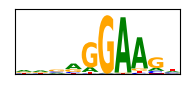

CEBPA/B_pooled


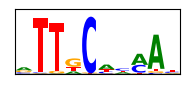

NFE2/JUN/D_pooled


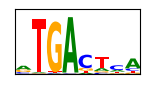

GATA1/2/4_pooled


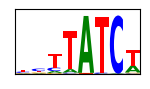

SOX2/3_pooled


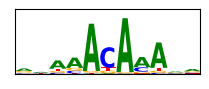

IRF1/2_pooled


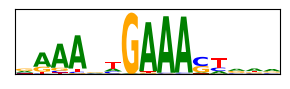

RUNX3_pooled


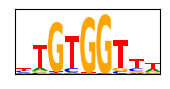

IRF8_pooled


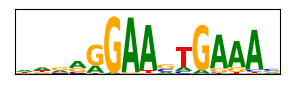

(Empty)_pooled


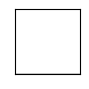

(Empty)_pooled


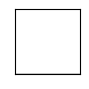

HNF4G_pooled


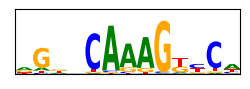

FOXA1/C1/A3/J3_pooled


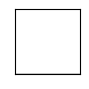

SOX4/5_pooled


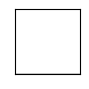

HNF6_pooled


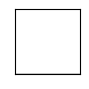

HNF1A_pooled


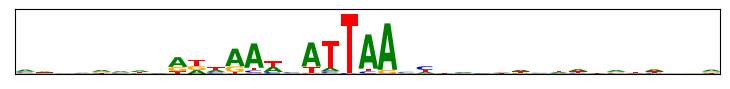

NFIA/C_pooled


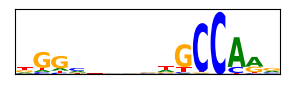

(Empty)_pooled


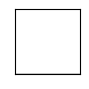

(Empty)_pooled


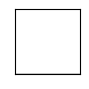

(Empty)_pooled


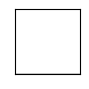

(Empty)_pooled


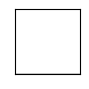

ZEB1_pooled


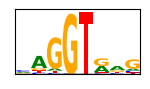

NDF2_pooled


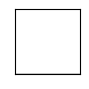

SOX9_pooled


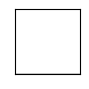

MYCN_pooled


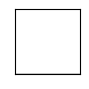

MEF2D_pooled


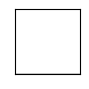

REST_pooled


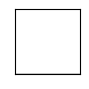

NFYA/B_pooled


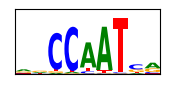

RFX5_pooled


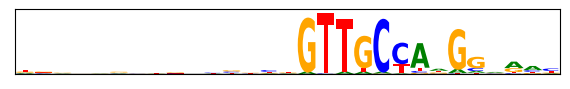

SP2_pooled


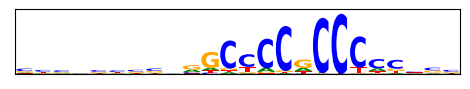

CTCF_pooled


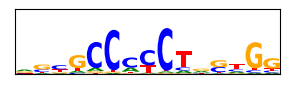

MYOG/D1_pooled


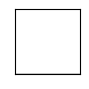

TEAD1/4_pooled


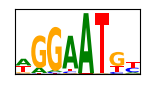

SIX1/2_pooled


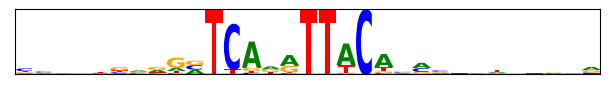

GCR_pooled


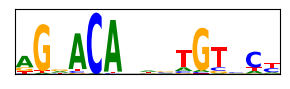

ATF1/2_pooled


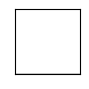

ERR1/2/3_pooled


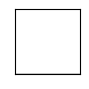

NF2L2_pooled


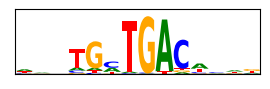

(Empty)_pooled


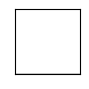

(Empty)_pooled


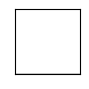

(Empty)_pooled


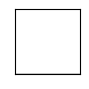

-- Motif Score Distributions --
Motif = 'SPI1/B_pooled'
 - n = 7916
 - Wilcoxon p ('blood' vs 'liver') = 5.22e-58 (s = 16.06)
 - Wilcoxon p ('blood' vs 'brain') = 1.62e-96 (s = 20.85)
 - Wilcoxon p ('blood' vs 'muscle') = 1.89e-88 (s = 19.94)
Motif = 'CEBPA/B_pooled'
 - n = 5785
 - Wilcoxon p ('blood' vs 'liver') = 1.13e-51 (s = 15.12)
 - Wilcoxon p ('blood' vs 'brain') = 1.10e-150 (s = 26.15)
 - Wilcoxon p ('blood' vs 'muscle') = 1.52e-147 (s = 25.87)
Motif = 'NFE2/JUN/D_pooled'
 - n = 6209
 - Wilcoxon p ('blood' vs 'liver') = 5.69e-14 (s = 7.52)
 - Wilcoxon p ('blood' vs 'brain') = 1.83e-24 (s = 10.21)
 - Wilcoxon p ('blood' vs 'muscle') = 3.12e-16 (s = 8.17)
Motif = 'GATA1/2/4_pooled'
 - n = 2024
 - Wilcoxon p ('blood' vs 'liver') = 1.49e-01 (s = -1.44)
 - Wilcoxon p ('blood' vs 'brain') = 2.80e-04 (s = 3.63)
 - Wilcoxon p ('blood' vs 'muscle') = 2.31e-01 (s = 1.2)
Motif = 'SOX2/3_pooled'
 - n = 1087
 - Wilcoxon p ('blood' vs 'liver') = 6.11e-01 (s = 0.51)
 - Wilcoxon p ('blood' vs 

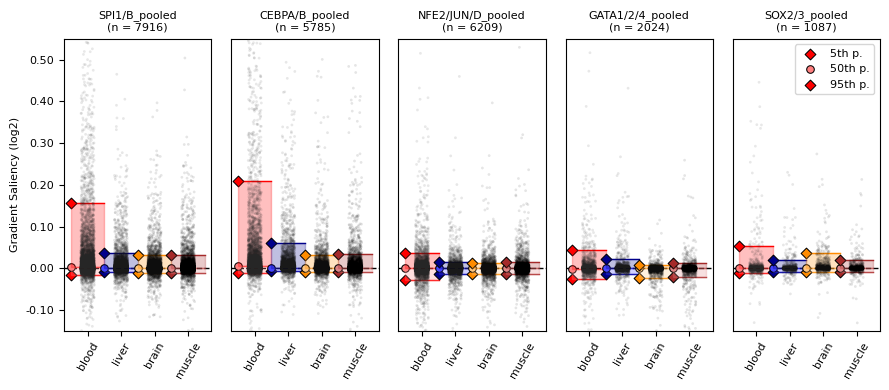

Motif = 'IRF1/2_pooled'
 - n = 505
 - Wilcoxon p ('blood' vs 'liver') = 4.82e-03 (s = 2.82)
 - Wilcoxon p ('blood' vs 'brain') = 8.97e-09 (s = 5.75)
 - Wilcoxon p ('blood' vs 'muscle') = 1.51e-04 (s = 3.79)
Motif = 'RUNX3_pooled'
 - n = 847
 - Wilcoxon p ('blood' vs 'liver') = 2.39e-01 (s = 1.18)
 - Wilcoxon p ('blood' vs 'brain') = 3.51e-01 (s = 0.93)
 - Wilcoxon p ('blood' vs 'muscle') = 2.39e-01 (s = 1.18)
Motif = 'IRF8_pooled'
 - n = 533
 - Wilcoxon p ('blood' vs 'liver') = 2.27e-02 (s = 2.28)
 - Wilcoxon p ('blood' vs 'brain') = 1.07e-03 (s = 3.27)
 - Wilcoxon p ('blood' vs 'muscle') = 1.78e-02 (s = 2.37)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


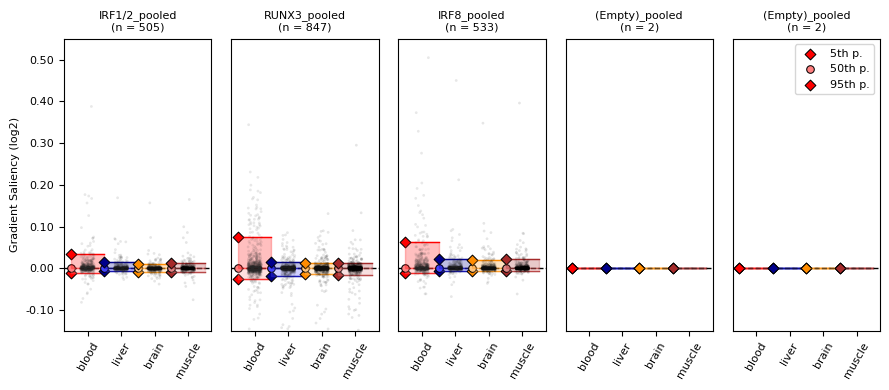

Motif = 'HNF4G_pooled'
 - n = 1956
 - Wilcoxon p ('liver' vs 'blood') = 9.57e-147 (s = 25.8)
 - Wilcoxon p ('liver' vs 'brain') = 1.99e-24 (s = 10.2)
 - Wilcoxon p ('liver' vs 'muscle') = 1.09e-11 (s = 6.79)
Motif = 'FOXA1/C1/A3/J3_pooled'
 - n = 1092
 - Wilcoxon p ('liver' vs 'blood') = 1.29e-103 (s = 21.62)
 - Wilcoxon p ('liver' vs 'brain') = 7.28e-02 (s = 1.79)
 - Wilcoxon p ('liver' vs 'muscle') = 9.61e-02 (s = -1.66)
Motif = 'SOX4/5_pooled'
 - n = 2
Motif = 'HNF6_pooled'
 - n = 2
Motif = 'HNF1A_pooled'
 - n = 385
 - Wilcoxon p ('liver' vs 'blood') = 1.30e-49 (s = 14.81)
 - Wilcoxon p ('liver' vs 'brain') = 8.39e-20 (s = 9.11)
 - Wilcoxon p ('liver' vs 'muscle') = 1.23e-17 (s = 8.55)


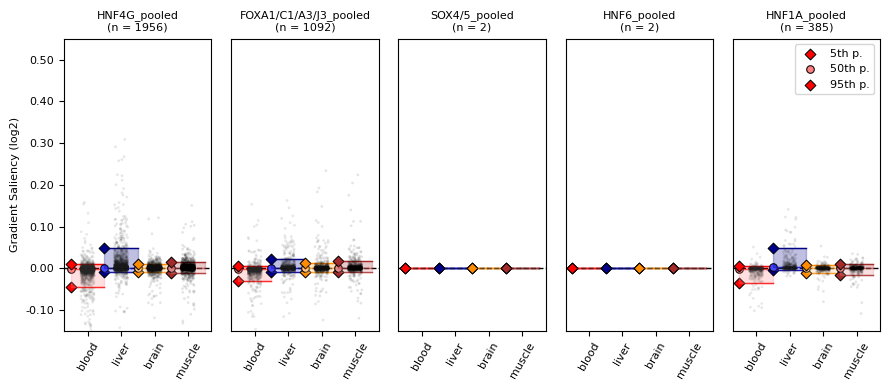

Motif = 'NFIA/C_pooled'
 - n = 1132
 - Wilcoxon p ('liver' vs 'blood') = 3.92e-30 (s = 11.41)
 - Wilcoxon p ('liver' vs 'brain') = 4.35e-02 (s = -2.02)
 - Wilcoxon p ('liver' vs 'muscle') = 1.69e-06 (s = -4.79)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


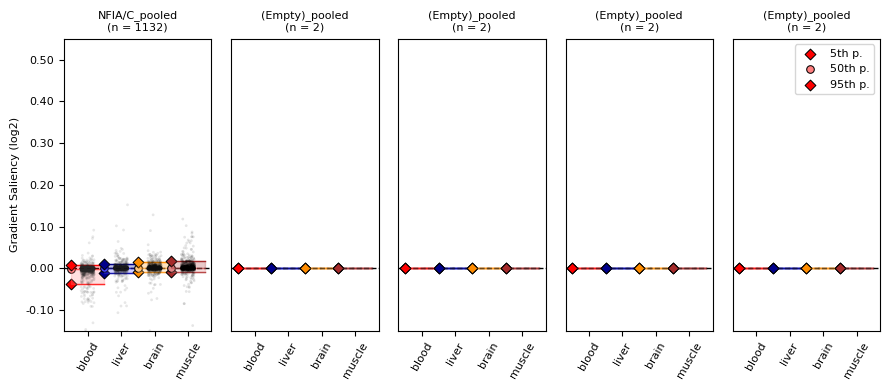

Motif = 'ZEB1_pooled'
 - n = 8849
 - Wilcoxon p ('brain' vs 'blood') = 8.31e-04 (s = -3.34)
 - Wilcoxon p ('brain' vs 'liver') = 1.57e-03 (s = -3.16)
 - Wilcoxon p ('brain' vs 'muscle') = 3.36e-01 (s = 0.96)
Motif = 'NDF2_pooled'
 - n = 692
 - Wilcoxon p ('brain' vs 'blood') = 3.69e-121 (s = 23.41)
 - Wilcoxon p ('brain' vs 'liver') = 6.14e-14 (s = 7.51)
 - Wilcoxon p ('brain' vs 'muscle') = 5.67e-10 (s = -6.2)
Motif = 'SOX9_pooled'
 - n = 2
Motif = 'MYCN_pooled'
 - n = 2
Motif = 'MEF2D_pooled'
 - n = 304
 - Wilcoxon p ('brain' vs 'blood') = 3.00e-35 (s = 12.39)
 - Wilcoxon p ('brain' vs 'liver') = 6.62e-06 (s = 4.51)
 - Wilcoxon p ('brain' vs 'muscle') = 6.56e-11 (s = -6.53)


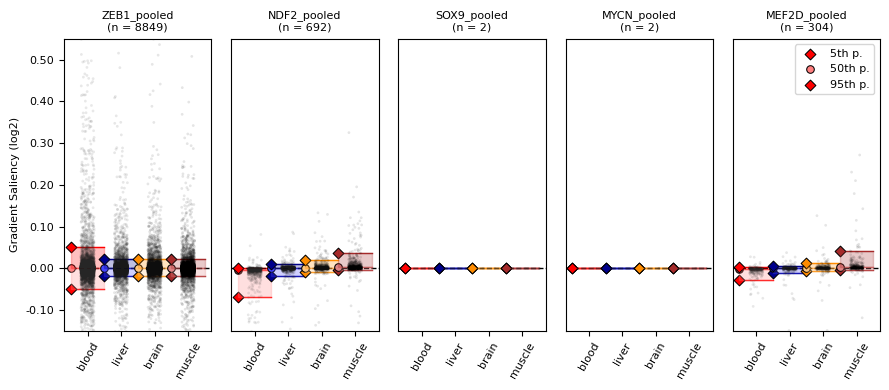

Motif = 'REST_pooled'
 - n = 2
Motif = 'NFYA/B_pooled'
 - n = 275
 - Wilcoxon p ('brain' vs 'blood') = 3.88e-37 (s = -12.73)
 - Wilcoxon p ('brain' vs 'liver') = 3.36e-01 (s = -0.96)
 - Wilcoxon p ('brain' vs 'muscle') = 5.11e-01 (s = 0.66)
Motif = 'RFX5_pooled'
 - n = 257
 - Wilcoxon p ('brain' vs 'blood') = 1.06e-11 (s = 6.8)
 - Wilcoxon p ('brain' vs 'liver') = 1.48e-10 (s = 6.41)
 - Wilcoxon p ('brain' vs 'muscle') = 3.69e-10 (s = 6.27)
Motif = 'SP2_pooled'
 - n = 275
 - Wilcoxon p ('brain' vs 'blood') = 3.35e-01 (s = 0.96)
 - Wilcoxon p ('brain' vs 'liver') = 9.80e-01 (s = 0.02)
 - Wilcoxon p ('brain' vs 'muscle') = 3.49e-01 (s = 0.94)
Motif = 'CTCF_pooled'
 - n = 2460
 - Wilcoxon p ('brain' vs 'blood') = 1.18e-02 (s = -2.52)
 - Wilcoxon p ('brain' vs 'liver') = 1.33e-01 (s = 1.5)
 - Wilcoxon p ('brain' vs 'muscle') = 7.49e-01 (s = 0.32)


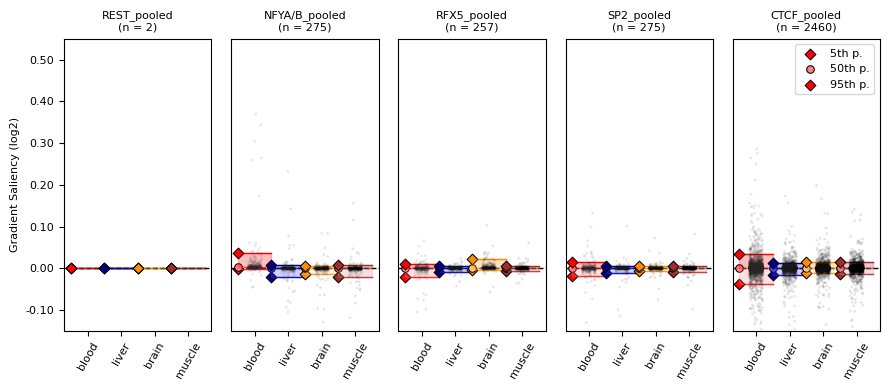

Motif = 'MYOG/D1_pooled'
 - n = 2
Motif = 'TEAD1/4_pooled'
 - n = 1411
 - Wilcoxon p ('muscle' vs 'blood') = 4.03e-62 (s = 16.63)
 - Wilcoxon p ('muscle' vs 'liver') = 5.84e-07 (s = 5.0)
 - Wilcoxon p ('muscle' vs 'brain') = 7.32e-15 (s = 7.78)
Motif = 'SIX1/2_pooled'
 - n = 95
 - Wilcoxon p ('muscle' vs 'blood') = 1.40e-07 (s = 5.27)
 - Wilcoxon p ('muscle' vs 'liver') = 4.51e-03 (s = 2.84)
 - Wilcoxon p ('muscle' vs 'brain') = 2.03e-03 (s = 3.09)
Motif = 'GCR_pooled'
 - n = 398
 - Wilcoxon p ('muscle' vs 'blood') = 2.28e-44 (s = 13.97)
 - Wilcoxon p ('muscle' vs 'liver') = 7.27e-05 (s = 3.97)
 - Wilcoxon p ('muscle' vs 'brain') = 3.25e-07 (s = 5.11)
Motif = 'ATF1/2_pooled'
 - n = 759
 - Wilcoxon p ('muscle' vs 'blood') = 7.70e-121 (s = 23.37)
 - Wilcoxon p ('muscle' vs 'liver') = 1.99e-14 (s = 7.65)
 - Wilcoxon p ('muscle' vs 'brain') = 1.14e-08 (s = 5.71)


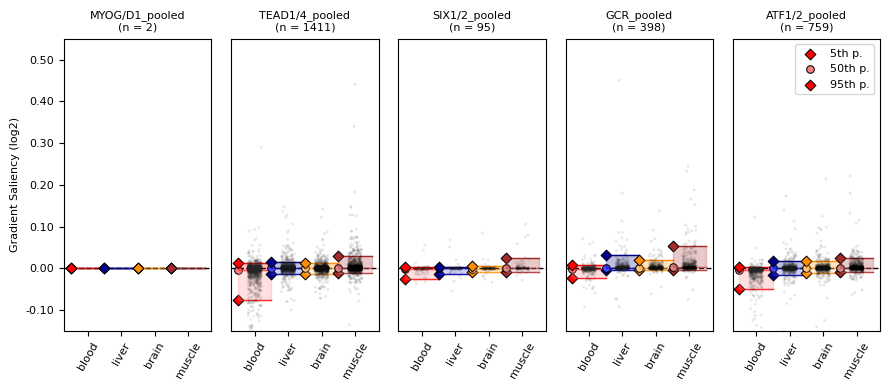

Motif = 'ERR1/2/3_pooled'
 - n = 2
Motif = 'NF2L2_pooled'
 - n = 431
 - Wilcoxon p ('muscle' vs 'blood') = 2.32e-01 (s = -1.2)
 - Wilcoxon p ('muscle' vs 'liver') = 4.56e-02 (s = -2.0)
 - Wilcoxon p ('muscle' vs 'brain') = 9.79e-01 (s = 0.03)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


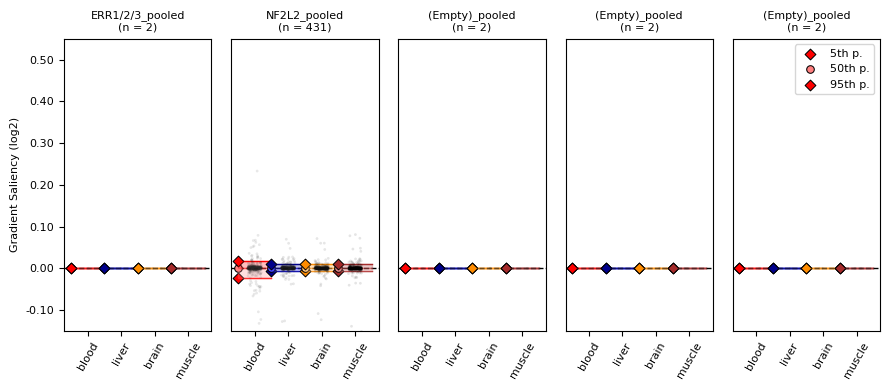

In [15]:
#Interpret blood-specific genes

plot_modisco_interpretation(
    tissue_i=0,
    tissue_colors=['red', 'darkblue', 'darkorange', 'brown'],
    save_figs=False,
    save_prefix='attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_pos_neg_pooled_',
    
    y_min_fixed=-0.15, y_max_fixed=0.55,
    
    col_width=1.8,
    
    qtls=[0.05, 0.50, 0.95],
    shades=[1.0, 0.5, 1.0],
    markers=['D', 'o', 'D'],
)


[Salient Motifs for Tissue = 'liver']

-- Motif PWMs --
SPI1/B_pooled


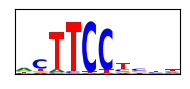

CEBPA/B_pooled


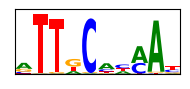

NFE2/JUN/D_pooled


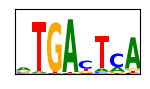

GATA1/2/4_pooled


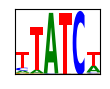

SOX2/3_pooled


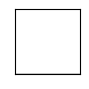

IRF1/2_pooled


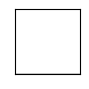

RUNX3_pooled


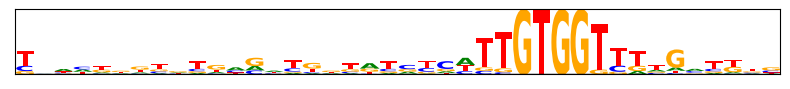

IRF8_pooled


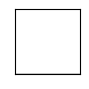

(Empty)_pooled


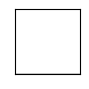

(Empty)_pooled


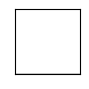

HNF4G_pooled


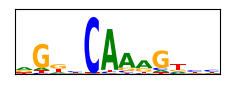

FOXA1/C1/A3/J3_pooled


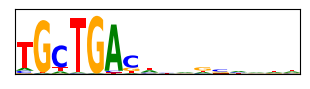

SOX4/5_pooled


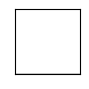

HNF6_pooled


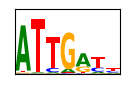

HNF1A_pooled


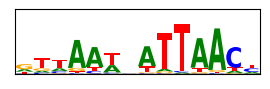

NFIA/C_pooled


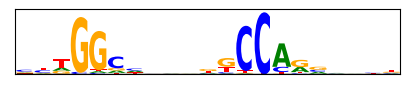

(Empty)_pooled


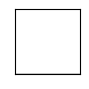

(Empty)_pooled


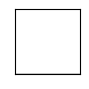

(Empty)_pooled


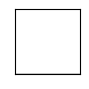

(Empty)_pooled


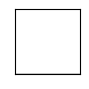

ZEB1_pooled


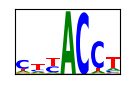

NDF2_pooled


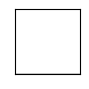

SOX9_pooled


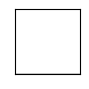

MYCN_pooled


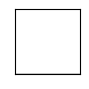

MEF2D_pooled


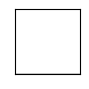

REST_pooled


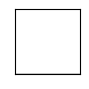

NFYA/B_pooled


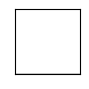

RFX5_pooled


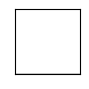

SP2_pooled


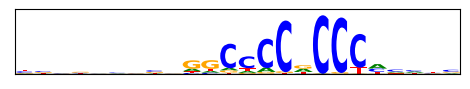

CTCF_pooled


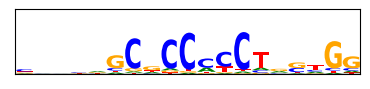

MYOG/D1_pooled


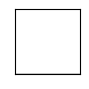

TEAD1/4_pooled


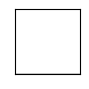

SIX1/2_pooled


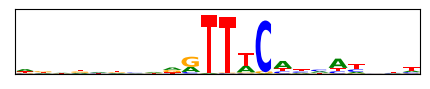

GCR_pooled


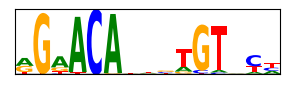

ATF1/2_pooled


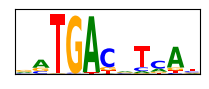

ERR1/2/3_pooled


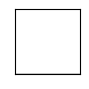

NF2L2_pooled


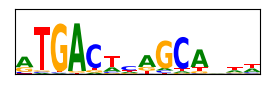

(Empty)_pooled


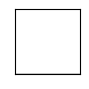

(Empty)_pooled


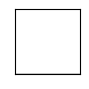

(Empty)_pooled


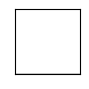

-- Motif Score Distributions --
Motif = 'SPI1/B_pooled'
 - n = 4153
 - Wilcoxon p ('blood' vs 'liver') = 0.00e+00 (s = 43.42)
 - Wilcoxon p ('blood' vs 'brain') = 2.52e-49 (s = 14.76)
 - Wilcoxon p ('blood' vs 'muscle') = 9.08e-53 (s = 15.29)
Motif = 'CEBPA/B_pooled'
 - n = 4347
 - Wilcoxon p ('blood' vs 'liver') = 1.68e-18 (s = -8.78)
 - Wilcoxon p ('blood' vs 'brain') = 5.32e-35 (s = 12.34)
 - Wilcoxon p ('blood' vs 'muscle') = 3.01e-04 (s = 3.61)
Motif = 'NFE2/JUN/D_pooled'
 - n = 4477
 - Wilcoxon p ('blood' vs 'liver') = 1.29e-233 (s = 32.64)
 - Wilcoxon p ('blood' vs 'brain') = 4.07e-34 (s = 12.18)
 - Wilcoxon p ('blood' vs 'muscle') = 9.94e-47 (s = 14.35)
Motif = 'GATA1/2/4_pooled'
 - n = 2457
 - Wilcoxon p ('blood' vs 'liver') = 3.30e-50 (s = 14.9)
 - Wilcoxon p ('blood' vs 'brain') = 8.52e-10 (s = 6.14)
 - Wilcoxon p ('blood' vs 'muscle') = 5.06e-06 (s = 4.56)
Motif = 'SOX2/3_pooled'
 - n = 2


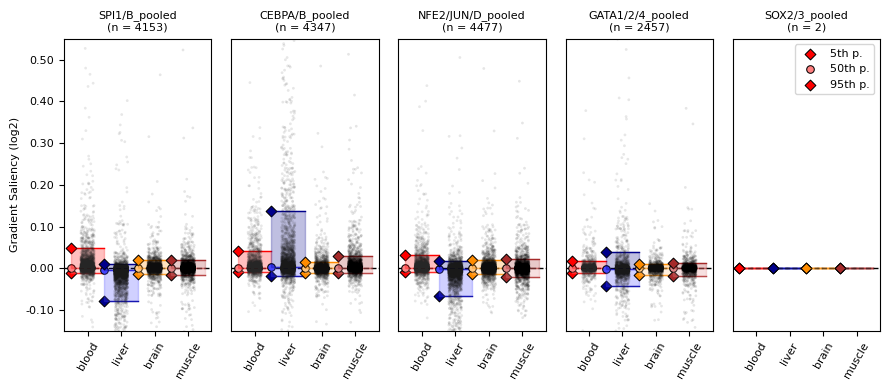

Motif = 'IRF1/2_pooled'
 - n = 479
 - Wilcoxon p ('blood' vs 'liver') = 1.61e-101 (s = 21.39)
 - Wilcoxon p ('blood' vs 'brain') = 1.84e-21 (s = 9.51)
 - Wilcoxon p ('blood' vs 'muscle') = 6.82e-15 (s = 7.79)
Motif = 'RUNX3_pooled'
 - n = 563
 - Wilcoxon p ('blood' vs 'liver') = 2.09e-115 (s = 22.83)
 - Wilcoxon p ('blood' vs 'brain') = 2.51e-19 (s = 8.99)
 - Wilcoxon p ('blood' vs 'muscle') = 4.93e-19 (s = 8.91)
Motif = 'IRF8_pooled'
 - n = 190
 - Wilcoxon p ('blood' vs 'liver') = 8.30e-39 (s = 13.03)
 - Wilcoxon p ('blood' vs 'brain') = 1.52e-19 (s = 9.04)
 - Wilcoxon p ('blood' vs 'muscle') = 2.82e-14 (s = 7.61)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


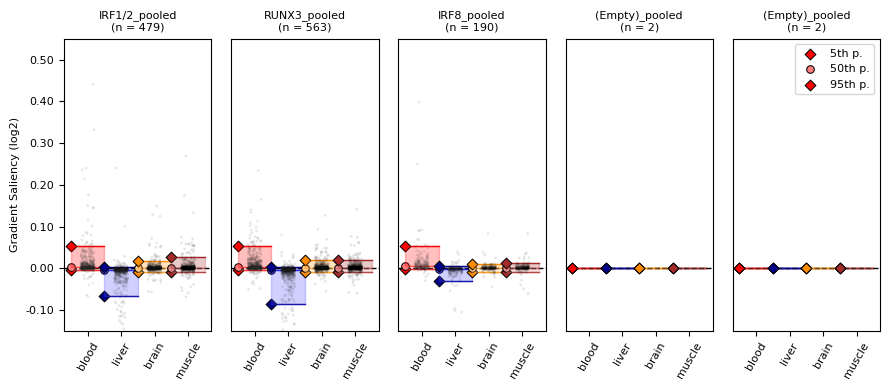

Motif = 'HNF4G_pooled'
 - n = 5292
 - Wilcoxon p ('liver' vs 'blood') = 8.07e-152 (s = 26.25)
 - Wilcoxon p ('liver' vs 'brain') = 4.26e-182 (s = 28.78)
 - Wilcoxon p ('liver' vs 'muscle') = 4.02e-167 (s = 27.55)
Motif = 'FOXA1/C1/A3/J3_pooled'
 - n = 3580
 - Wilcoxon p ('liver' vs 'blood') = 2.61e-158 (s = 26.81)
 - Wilcoxon p ('liver' vs 'brain') = 2.02e-170 (s = 27.83)
 - Wilcoxon p ('liver' vs 'muscle') = 2.52e-151 (s = 26.2)
Motif = 'SOX4/5_pooled'
 - n = 461
 - Wilcoxon p ('liver' vs 'blood') = 1.09e-46 (s = -14.35)
 - Wilcoxon p ('liver' vs 'brain') = 2.65e-90 (s = -20.15)
 - Wilcoxon p ('liver' vs 'muscle') = 8.25e-62 (s = -16.59)
Motif = 'HNF6_pooled'
 - n = 761
 - Wilcoxon p ('liver' vs 'blood') = 8.67e-96 (s = 20.77)
 - Wilcoxon p ('liver' vs 'brain') = 3.01e-107 (s = 22.0)
 - Wilcoxon p ('liver' vs 'muscle') = 5.18e-95 (s = 20.68)
Motif = 'HNF1A_pooled'
 - n = 1066
 - Wilcoxon p ('liver' vs 'blood') = 2.37e-19 (s = 8.99)
 - Wilcoxon p ('liver' vs 'brain') = 7.50e-27 (s = 10

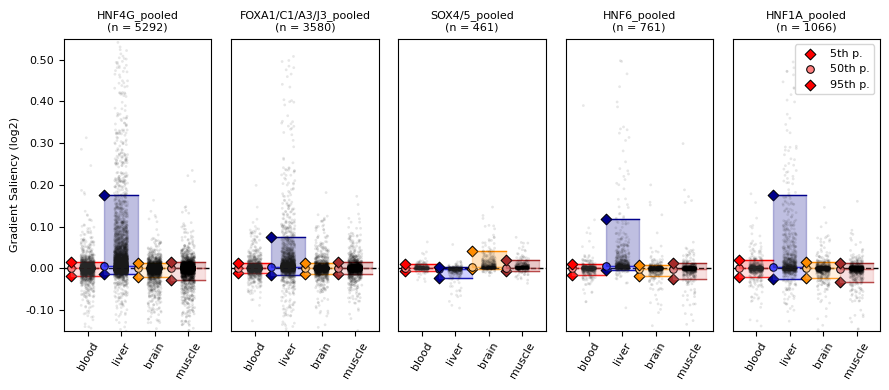

Motif = 'NFIA/C_pooled'
 - n = 837
 - Wilcoxon p ('liver' vs 'blood') = 2.56e-99 (s = -21.15)
 - Wilcoxon p ('liver' vs 'brain') = 2.61e-116 (s = -22.93)
 - Wilcoxon p ('liver' vs 'muscle') = 8.84e-110 (s = -22.26)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


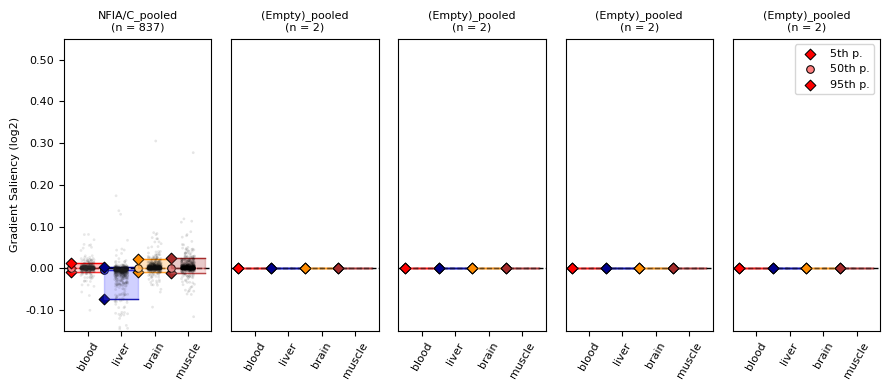

Motif = 'ZEB1_pooled'
 - n = 4812
 - Wilcoxon p ('brain' vs 'blood') = 4.74e-04 (s = -3.49)
 - Wilcoxon p ('brain' vs 'liver') = 9.64e-217 (s = -31.42)
 - Wilcoxon p ('brain' vs 'muscle') = 2.07e-01 (s = -1.26)
Motif = 'NDF2_pooled'
 - n = 2
Motif = 'SOX9_pooled'
 - n = 2
Motif = 'MYCN_pooled'
 - n = 2
Motif = 'MEF2D_pooled'
 - n = 422
 - Wilcoxon p ('brain' vs 'blood') = 4.38e-06 (s = 4.59)
 - Wilcoxon p ('brain' vs 'liver') = 6.13e-76 (s = 18.44)
 - Wilcoxon p ('brain' vs 'muscle') = 2.55e-15 (s = -7.91)


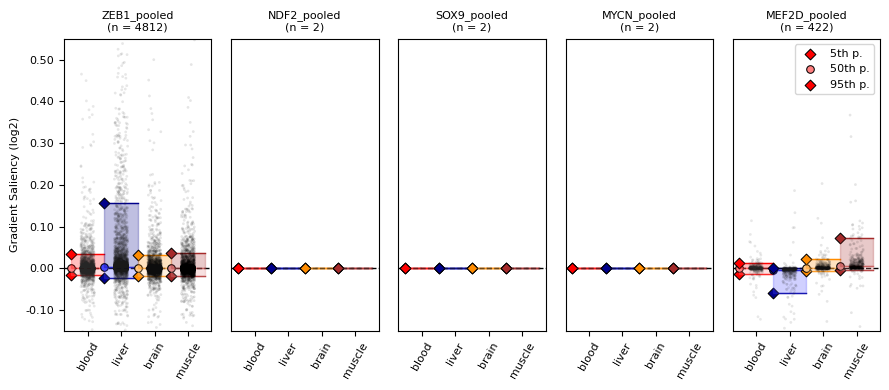

Motif = 'REST_pooled'
 - n = 34
 - Wilcoxon p ('brain' vs 'blood') = 8.83e-03 (s = 2.62)
 - Wilcoxon p ('brain' vs 'liver') = 1.78e-06 (s = 4.78)
 - Wilcoxon p ('brain' vs 'muscle') = 6.84e-03 (s = 2.7)
Motif = 'NFYA/B_pooled'
 - n = 128
 - Wilcoxon p ('brain' vs 'blood') = 3.66e-01 (s = 0.9)
 - Wilcoxon p ('brain' vs 'liver') = 2.59e-21 (s = 9.48)
 - Wilcoxon p ('brain' vs 'muscle') = 2.39e-01 (s = 1.18)
Motif = 'RFX5_pooled'
 - n = 261
 - Wilcoxon p ('brain' vs 'blood') = 1.81e-19 (s = 9.02)
 - Wilcoxon p ('brain' vs 'liver') = 1.92e-55 (s = 15.68)
 - Wilcoxon p ('brain' vs 'muscle') = 6.70e-17 (s = 8.35)
Motif = 'SP2_pooled'
 - n = 510
 - Wilcoxon p ('brain' vs 'blood') = 8.82e-01 (s = -0.15)
 - Wilcoxon p ('brain' vs 'liver') = 4.10e-24 (s = 10.13)
 - Wilcoxon p ('brain' vs 'muscle') = 3.81e-01 (s = 0.88)
Motif = 'CTCF_pooled'
 - n = 2248
 - Wilcoxon p ('brain' vs 'blood') = 5.98e-01 (s = 0.53)
 - Wilcoxon p ('brain' vs 'liver') = 3.18e-15 (s = 7.88)
 - Wilcoxon p ('brain' vs 'musc

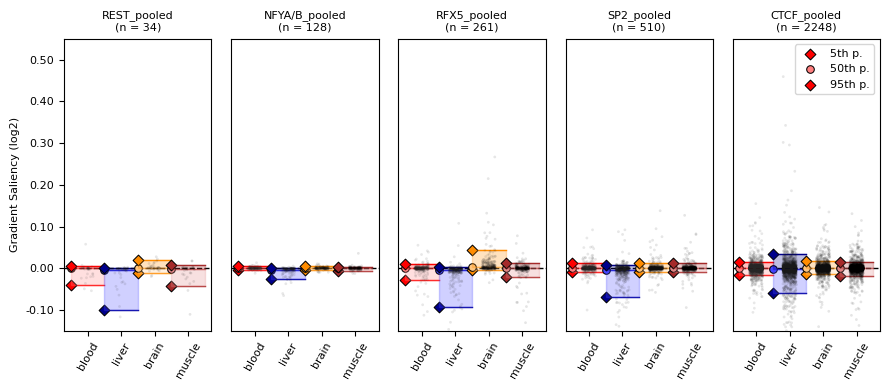

Motif = 'MYOG/D1_pooled'
 - n = 1107
 - Wilcoxon p ('muscle' vs 'blood') = 1.04e-07 (s = 5.32)
 - Wilcoxon p ('muscle' vs 'liver') = 3.45e-194 (s = 29.73)
 - Wilcoxon p ('muscle' vs 'brain') = 1.27e-02 (s = 2.49)
Motif = 'TEAD1/4_pooled'
 - n = 786
 - Wilcoxon p ('muscle' vs 'blood') = 3.57e-05 (s = 4.13)
 - Wilcoxon p ('muscle' vs 'liver') = 3.63e-126 (s = 23.89)
 - Wilcoxon p ('muscle' vs 'brain') = 2.06e-08 (s = 5.61)
Motif = 'SIX1/2_pooled'
 - n = 237
 - Wilcoxon p ('muscle' vs 'blood') = 9.02e-03 (s = 2.61)
 - Wilcoxon p ('muscle' vs 'liver') = 7.70e-01 (s = -0.29)
 - Wilcoxon p ('muscle' vs 'brain') = 1.14e-03 (s = 3.25)
Motif = 'GCR_pooled'
 - n = 205
 - Wilcoxon p ('muscle' vs 'blood') = 9.28e-09 (s = 5.74)
 - Wilcoxon p ('muscle' vs 'liver') = 3.00e-09 (s = 5.93)
 - Wilcoxon p ('muscle' vs 'brain') = 6.85e-04 (s = 3.4)
Motif = 'ATF1/2_pooled'
 - n = 1235
 - Wilcoxon p ('muscle' vs 'blood') = 1.54e-01 (s = 1.43)
 - Wilcoxon p ('muscle' vs 'liver') = 8.47e-48 (s = 14.52)
 - Wilc

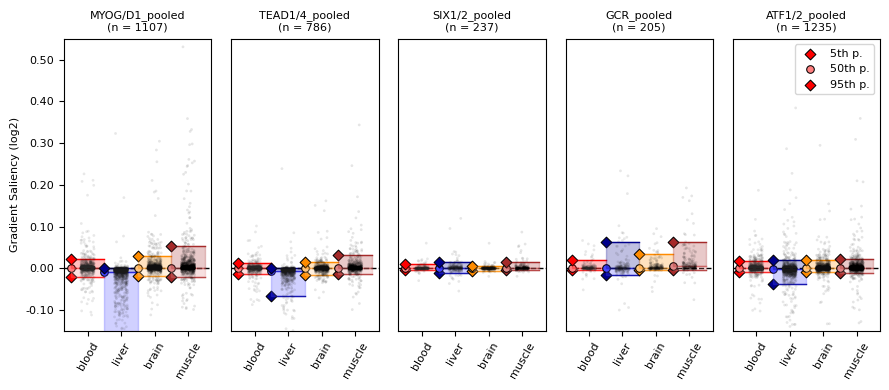

Motif = 'ERR1/2/3_pooled'
 - n = 2
Motif = 'NF2L2_pooled'
 - n = 231
 - Wilcoxon p ('muscle' vs 'blood') = 2.79e-02 (s = -2.2)
 - Wilcoxon p ('muscle' vs 'liver') = 5.29e-30 (s = -11.38)
 - Wilcoxon p ('muscle' vs 'brain') = 3.40e-01 (s = 0.95)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


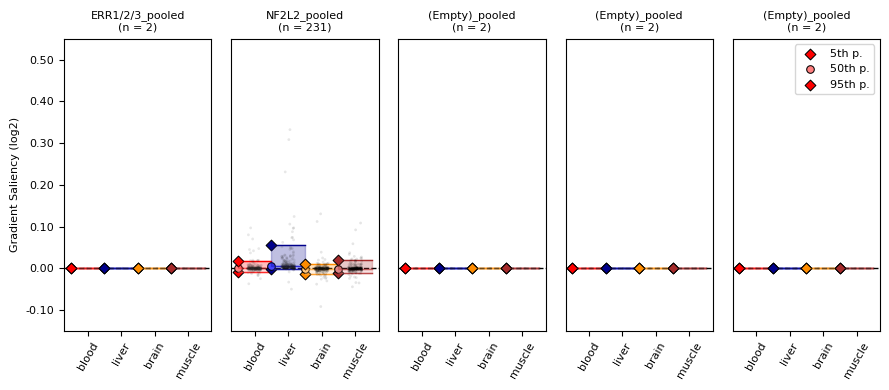

In [16]:
#Interpret liver-specific genes

plot_modisco_interpretation(
    tissue_i=1,
    tissue_colors=['red', 'darkblue', 'darkorange', 'brown'],
    save_figs=False,
    save_prefix='attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_pos_neg_pooled_',
    
    y_min_fixed=-0.15, y_max_fixed=0.55,
    
    col_width=1.8,
    
    qtls=[0.05, 0.50, 0.95],
    shades=[1.0, 0.5, 1.0],
    markers=['D', 'o', 'D'],
)


[Salient Motifs for Tissue = 'brain']

-- Motif PWMs --
SPI1/B_pooled


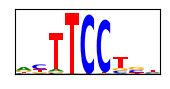

CEBPA/B_pooled


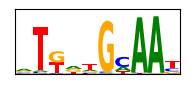

NFE2/JUN/D_pooled


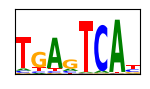

GATA1/2/4_pooled


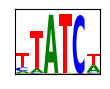

SOX2/3_pooled


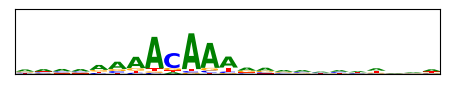

IRF1/2_pooled


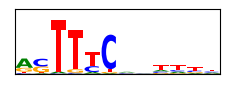

RUNX3_pooled


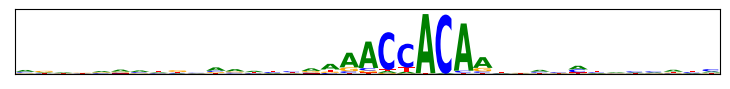

IRF8_pooled


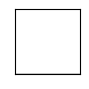

(Empty)_pooled


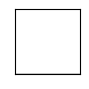

(Empty)_pooled


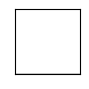

HNF4G_pooled


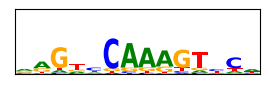

FOXA1/C1/A3/J3_pooled


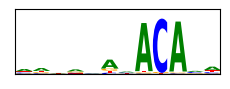

SOX4/5_pooled


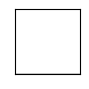

HNF6_pooled


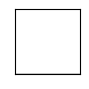

HNF1A_pooled


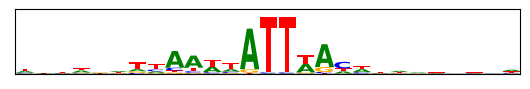

NFIA/C_pooled


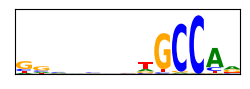

(Empty)_pooled


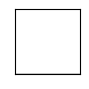

(Empty)_pooled


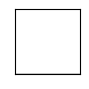

(Empty)_pooled


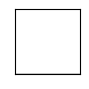

(Empty)_pooled


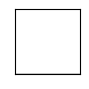

ZEB1_pooled


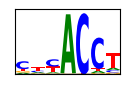

NDF2_pooled


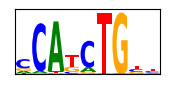

SOX9_pooled


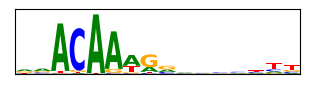

MYCN_pooled


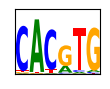

MEF2D_pooled


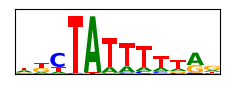

REST_pooled


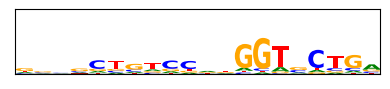

NFYA/B_pooled


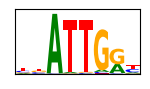

RFX5_pooled


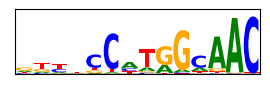

SP2_pooled


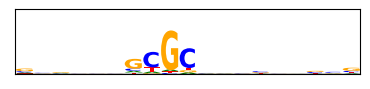

CTCF_pooled


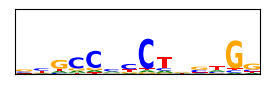

MYOG/D1_pooled


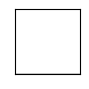

TEAD1/4_pooled


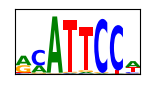

SIX1/2_pooled


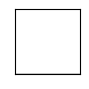

GCR_pooled


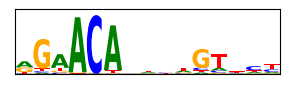

ATF1/2_pooled


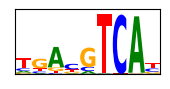

ERR1/2/3_pooled


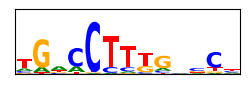

NF2L2_pooled


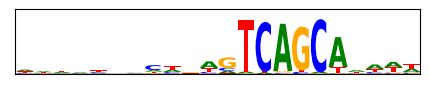

(Empty)_pooled


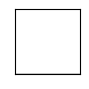

(Empty)_pooled


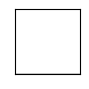

(Empty)_pooled


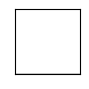

-- Motif Score Distributions --
Motif = 'SPI1/B_pooled'
 - n = 3939
 - Wilcoxon p ('blood' vs 'liver') = 2.37e-25 (s = 10.4)
 - Wilcoxon p ('blood' vs 'brain') = 5.83e-234 (s = 32.66)
 - Wilcoxon p ('blood' vs 'muscle') = 7.60e-45 (s = 14.05)
Motif = 'CEBPA/B_pooled'
 - n = 3203
 - Wilcoxon p ('blood' vs 'liver') = 5.65e-04 (s = -3.45)
 - Wilcoxon p ('blood' vs 'brain') = 6.16e-110 (s = 22.28)
 - Wilcoxon p ('blood' vs 'muscle') = 7.77e-09 (s = 5.77)
Motif = 'NFE2/JUN/D_pooled'
 - n = 5600
 - Wilcoxon p ('blood' vs 'liver') = 1.18e-12 (s = 7.11)
 - Wilcoxon p ('blood' vs 'brain') = 1.75e-37 (s = 12.79)
 - Wilcoxon p ('blood' vs 'muscle') = 2.84e-13 (s = 7.3)
Motif = 'GATA1/2/4_pooled'
 - n = 2495
 - Wilcoxon p ('blood' vs 'liver') = 1.20e-07 (s = -5.29)
 - Wilcoxon p ('blood' vs 'brain') = 9.59e-90 (s = 20.09)
 - Wilcoxon p ('blood' vs 'muscle') = 7.17e-05 (s = 3.97)
Motif = 'SOX2/3_pooled'
 - n = 595
 - Wilcoxon p ('blood' vs 'liver') = 2.19e-01 (s = 1.23)
 - Wilcoxon p ('blood' vs 'b

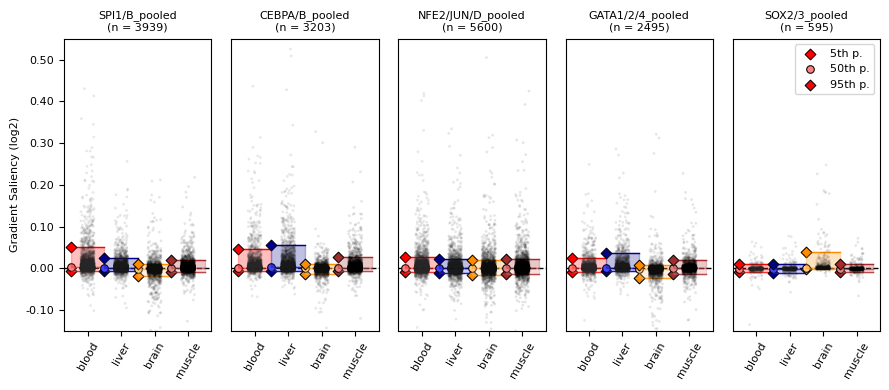

Motif = 'IRF1/2_pooled'
 - n = 714
 - Wilcoxon p ('blood' vs 'liver') = 1.05e-07 (s = 5.32)
 - Wilcoxon p ('blood' vs 'brain') = 5.64e-39 (s = 13.06)
 - Wilcoxon p ('blood' vs 'muscle') = 2.97e-07 (s = 5.13)
Motif = 'RUNX3_pooled'
 - n = 506
 - Wilcoxon p ('blood' vs 'liver') = 6.27e-05 (s = 4.0)
 - Wilcoxon p ('blood' vs 'brain') = 2.55e-14 (s = 7.62)
 - Wilcoxon p ('blood' vs 'muscle') = 3.59e-03 (s = 2.91)
Motif = 'IRF8_pooled'
 - n = 173
 - Wilcoxon p ('blood' vs 'liver') = 4.39e-13 (s = 7.24)
 - Wilcoxon p ('blood' vs 'brain') = 1.41e-26 (s = 10.67)
 - Wilcoxon p ('blood' vs 'muscle') = 2.49e-11 (s = 6.67)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


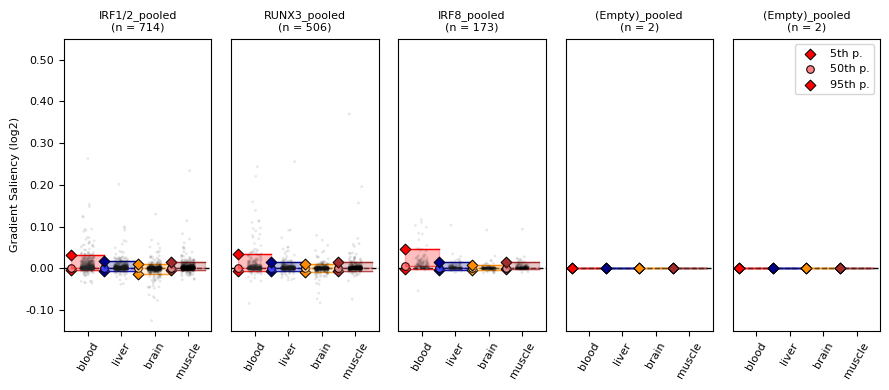

Motif = 'HNF4G_pooled'
 - n = 1906
 - Wilcoxon p ('liver' vs 'blood') = 5.29e-48 (s = 14.56)
 - Wilcoxon p ('liver' vs 'brain') = 1.01e-131 (s = 24.42)
 - Wilcoxon p ('liver' vs 'muscle') = 7.93e-40 (s = 13.21)
Motif = 'FOXA1/C1/A3/J3_pooled'
 - n = 2747
 - Wilcoxon p ('liver' vs 'blood') = 6.91e-12 (s = 6.86)
 - Wilcoxon p ('liver' vs 'brain') = 8.24e-99 (s = 21.1)
 - Wilcoxon p ('liver' vs 'muscle') = 1.33e-04 (s = 3.82)
Motif = 'SOX4/5_pooled'
 - n = 2
Motif = 'HNF6_pooled'
 - n = 686
 - Wilcoxon p ('liver' vs 'blood') = 1.42e-04 (s = 3.81)
 - Wilcoxon p ('liver' vs 'brain') = 3.01e-92 (s = 20.37)
 - Wilcoxon p ('liver' vs 'muscle') = 1.81e-02 (s = 2.36)
Motif = 'HNF1A_pooled'
 - n = 306
 - Wilcoxon p ('liver' vs 'blood') = 2.11e-05 (s = 4.25)
 - Wilcoxon p ('liver' vs 'brain') = 5.83e-12 (s = 6.88)
 - Wilcoxon p ('liver' vs 'muscle') = 5.66e-08 (s = 5.43)


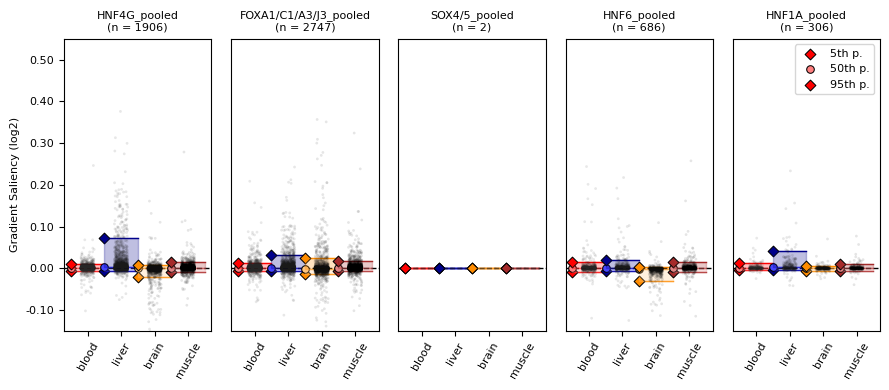

Motif = 'NFIA/C_pooled'
 - n = 1258
 - Wilcoxon p ('liver' vs 'blood') = 5.80e-04 (s = 3.44)
 - Wilcoxon p ('liver' vs 'brain') = 2.90e-01 (s = -1.06)
 - Wilcoxon p ('liver' vs 'muscle') = 1.35e-03 (s = -3.2)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


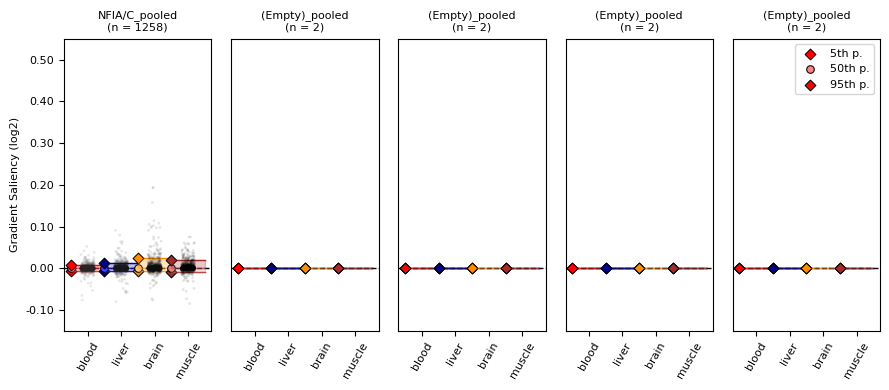

Motif = 'ZEB1_pooled'
 - n = 9122
 - Wilcoxon p ('brain' vs 'blood') = 7.34e-24 (s = -10.07)
 - Wilcoxon p ('brain' vs 'liver') = 1.73e-31 (s = -11.67)
 - Wilcoxon p ('brain' vs 'muscle') = 1.40e-10 (s = -6.42)
Motif = 'NDF2_pooled'
 - n = 823
 - Wilcoxon p ('brain' vs 'blood') = 1.55e-73 (s = 18.14)
 - Wilcoxon p ('brain' vs 'liver') = 2.07e-97 (s = 20.95)
 - Wilcoxon p ('brain' vs 'muscle') = 5.94e-64 (s = 16.88)
Motif = 'SOX9_pooled'
 - n = 1094
 - Wilcoxon p ('brain' vs 'blood') = 3.63e-61 (s = 16.5)
 - Wilcoxon p ('brain' vs 'liver') = 4.43e-50 (s = 14.88)
 - Wilcoxon p ('brain' vs 'muscle') = 1.28e-35 (s = 12.46)
Motif = 'MYCN_pooled'
 - n = 279
 - Wilcoxon p ('brain' vs 'blood') = 1.42e-18 (s = 8.8)
 - Wilcoxon p ('brain' vs 'liver') = 3.09e-22 (s = 9.7)
 - Wilcoxon p ('brain' vs 'muscle') = 2.37e-20 (s = 9.24)
Motif = 'MEF2D_pooled'
 - n = 425
 - Wilcoxon p ('brain' vs 'blood') = 3.75e-22 (s = 9.68)
 - Wilcoxon p ('brain' vs 'liver') = 2.41e-37 (s = 12.77)
 - Wilcoxon p ('brain

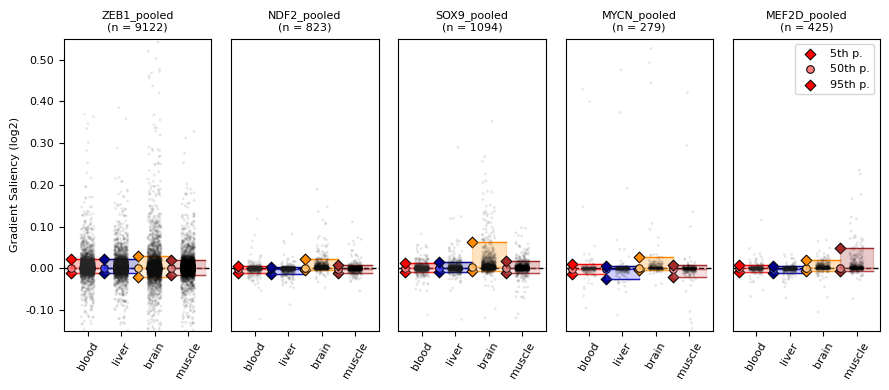

Motif = 'REST_pooled'
 - n = 670
 - Wilcoxon p ('brain' vs 'blood') = 2.55e-72 (s = 17.99)
 - Wilcoxon p ('brain' vs 'liver') = 2.65e-72 (s = 17.98)
 - Wilcoxon p ('brain' vs 'muscle') = 5.60e-74 (s = 18.2)
Motif = 'NFYA/B_pooled'
 - n = 379
 - Wilcoxon p ('brain' vs 'blood') = 2.78e-32 (s = 11.83)
 - Wilcoxon p ('brain' vs 'liver') = 4.42e-38 (s = 12.9)
 - Wilcoxon p ('brain' vs 'muscle') = 3.74e-31 (s = 11.61)
Motif = 'RFX5_pooled'
 - n = 936
 - Wilcoxon p ('brain' vs 'blood') = 1.64e-120 (s = 23.34)
 - Wilcoxon p ('brain' vs 'liver') = 6.64e-144 (s = 25.54)
 - Wilcoxon p ('brain' vs 'muscle') = 1.97e-152 (s = 26.3)
Motif = 'SP2_pooled'
 - n = 960
 - Wilcoxon p ('brain' vs 'blood') = 1.95e-36 (s = 12.61)
 - Wilcoxon p ('brain' vs 'liver') = 2.63e-47 (s = 14.45)
 - Wilcoxon p ('brain' vs 'muscle') = 5.61e-45 (s = 14.07)
Motif = 'CTCF_pooled'
 - n = 3637
 - Wilcoxon p ('brain' vs 'blood') = 1.36e-09 (s = 6.06)
 - Wilcoxon p ('brain' vs 'liver') = 7.58e-07 (s = 4.95)
 - Wilcoxon p ('bra

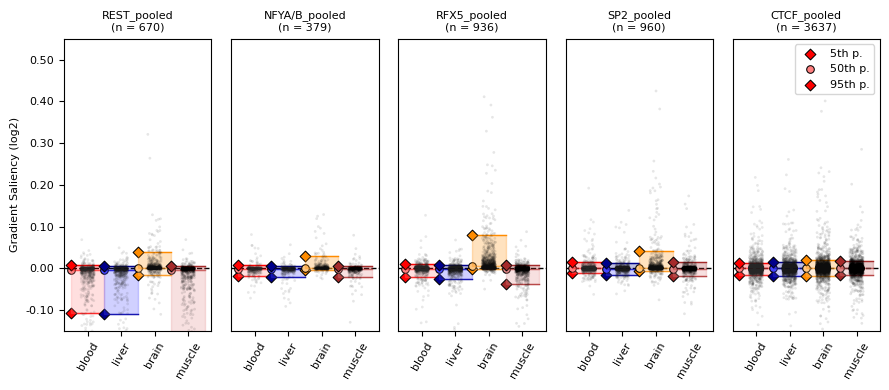

Motif = 'MYOG/D1_pooled'
 - n = 2
Motif = 'TEAD1/4_pooled'
 - n = 2027
 - Wilcoxon p ('muscle' vs 'blood') = 6.44e-17 (s = 8.36)
 - Wilcoxon p ('muscle' vs 'liver') = 1.56e-04 (s = 3.78)
 - Wilcoxon p ('muscle' vs 'brain') = 2.59e-177 (s = 28.39)
Motif = 'SIX1/2_pooled'
 - n = 145
 - Wilcoxon p ('muscle' vs 'blood') = 6.81e-11 (s = 6.52)
 - Wilcoxon p ('muscle' vs 'liver') = 1.42e-11 (s = 6.76)
 - Wilcoxon p ('muscle' vs 'brain') = 3.88e-32 (s = 11.8)
Motif = 'GCR_pooled'
 - n = 164
 - Wilcoxon p ('muscle' vs 'blood') = 3.20e-01 (s = 1.0)
 - Wilcoxon p ('muscle' vs 'liver') = 2.10e-01 (s = 1.25)
 - Wilcoxon p ('muscle' vs 'brain') = 2.45e-12 (s = -7.01)
Motif = 'ATF1/2_pooled'
 - n = 1064
 - Wilcoxon p ('muscle' vs 'blood') = 8.37e-02 (s = 1.73)
 - Wilcoxon p ('muscle' vs 'liver') = 5.71e-03 (s = 2.76)
 - Wilcoxon p ('muscle' vs 'brain') = 3.02e-04 (s = 3.61)


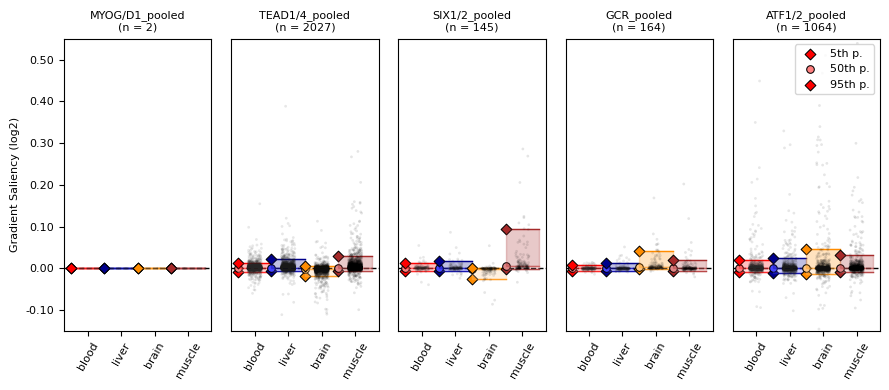

Motif = 'ERR1/2/3_pooled'
 - n = 614
 - Wilcoxon p ('muscle' vs 'blood') = 1.95e-05 (s = 4.27)
 - Wilcoxon p ('muscle' vs 'liver') = 6.76e-02 (s = -1.83)
 - Wilcoxon p ('muscle' vs 'brain') = 6.72e-42 (s = 13.56)
Motif = 'NF2L2_pooled'
 - n = 65
 - Wilcoxon p ('muscle' vs 'blood') = 4.73e-01 (s = -0.72)
 - Wilcoxon p ('muscle' vs 'liver') = 3.66e-01 (s = -0.9)
 - Wilcoxon p ('muscle' vs 'brain') = 3.10e-07 (s = -5.12)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


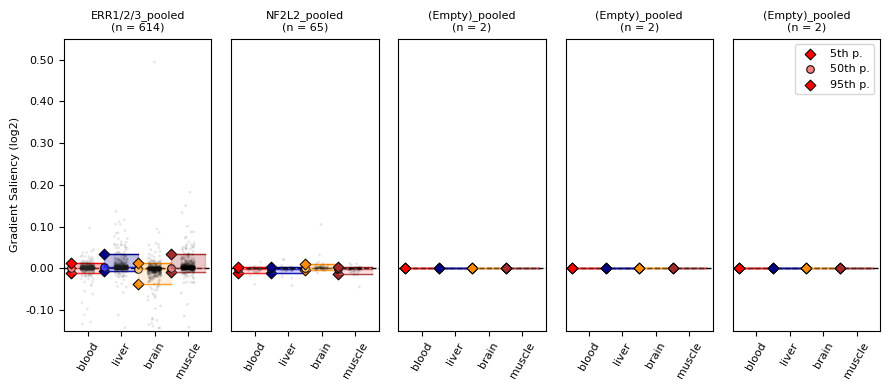

In [17]:
#Interpret brain-specific genes

plot_modisco_interpretation(
    tissue_i=2,
    tissue_colors=['red', 'darkblue', 'darkorange', 'brown'],
    save_figs=False,
    save_prefix='attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_pos_neg_pooled_',
    
    y_min_fixed=-0.15, y_max_fixed=0.55,
    
    col_width=1.8,
    
    qtls=[0.05, 0.50, 0.95],
    shades=[1.0, 0.5, 1.0],
    markers=['D', 'o', 'D'],
)


[Salient Motifs for Tissue = 'muscle']

-- Motif PWMs --
SPI1/B_pooled


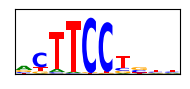

CEBPA/B_pooled


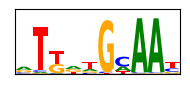

NFE2/JUN/D_pooled


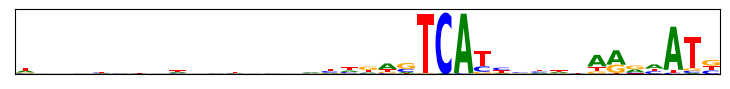

GATA1/2/4_pooled


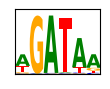

SOX2/3_pooled


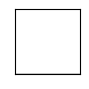

IRF1/2_pooled


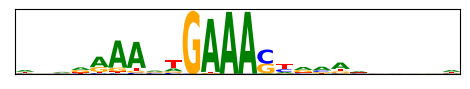

RUNX3_pooled


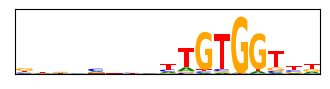

IRF8_pooled


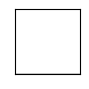

(Empty)_pooled


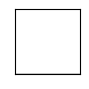

(Empty)_pooled


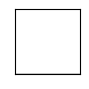

HNF4G_pooled


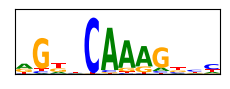

FOXA1/C1/A3/J3_pooled


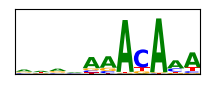

SOX4/5_pooled


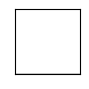

HNF6_pooled


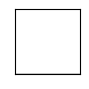

HNF1A_pooled


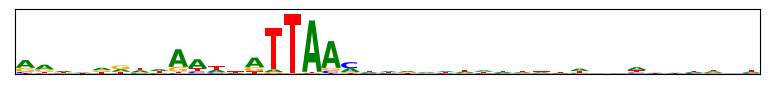

NFIA/C_pooled


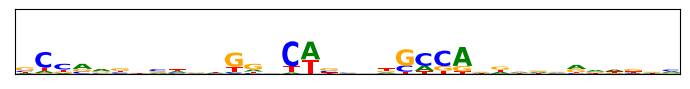

(Empty)_pooled


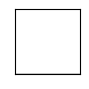

(Empty)_pooled


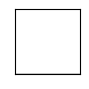

(Empty)_pooled


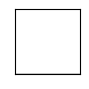

(Empty)_pooled


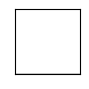

ZEB1_pooled


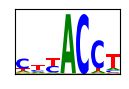

NDF2_pooled


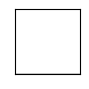

SOX9_pooled


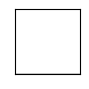

MYCN_pooled


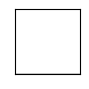

MEF2D_pooled


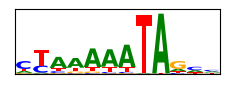

REST_pooled


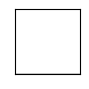

NFYA/B_pooled


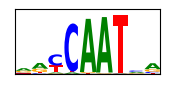

RFX5_pooled


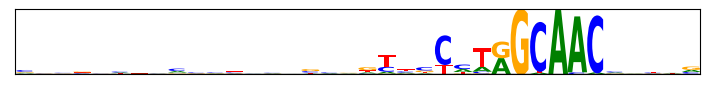

SP2_pooled


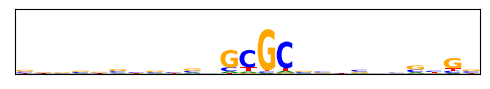

CTCF_pooled


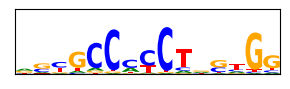

MYOG/D1_pooled


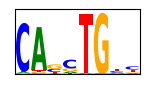

TEAD1/4_pooled


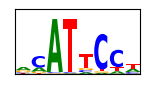

SIX1/2_pooled


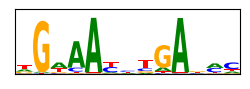

GCR_pooled


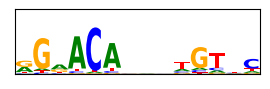

ATF1/2_pooled


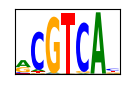

ERR1/2/3_pooled


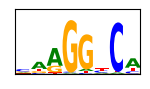

NF2L2_pooled


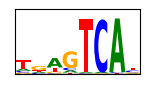

(Empty)_pooled


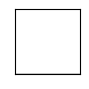

(Empty)_pooled


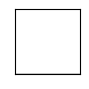

(Empty)_pooled


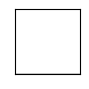

-- Motif Score Distributions --
Motif = 'SPI1/B_pooled'
 - n = 3883
 - Wilcoxon p ('blood' vs 'liver') = 3.10e-22 (s = 9.7)
 - Wilcoxon p ('blood' vs 'brain') = 1.77e-40 (s = 13.32)
 - Wilcoxon p ('blood' vs 'muscle') = 1.95e-187 (s = 29.2)
Motif = 'CEBPA/B_pooled'
 - n = 3224
 - Wilcoxon p ('blood' vs 'liver') = 4.88e-01 (s = -0.69)
 - Wilcoxon p ('blood' vs 'brain') = 6.39e-39 (s = 13.05)
 - Wilcoxon p ('blood' vs 'muscle') = 2.04e-120 (s = 23.33)
Motif = 'NFE2/JUN/D_pooled'
 - n = 67
 - Wilcoxon p ('blood' vs 'liver') = 7.66e-02 (s = 1.77)
 - Wilcoxon p ('blood' vs 'brain') = 1.32e-02 (s = 2.48)
 - Wilcoxon p ('blood' vs 'muscle') = 3.04e-10 (s = -6.3)
Motif = 'GATA1/2/4_pooled'
 - n = 3196
 - Wilcoxon p ('blood' vs 'liver') = 1.93e-01 (s = -1.3)
 - Wilcoxon p ('blood' vs 'brain') = 1.64e-15 (s = 7.97)
 - Wilcoxon p ('blood' vs 'muscle') = 4.46e-186 (s = 29.09)
Motif = 'SOX2/3_pooled'
 - n = 2


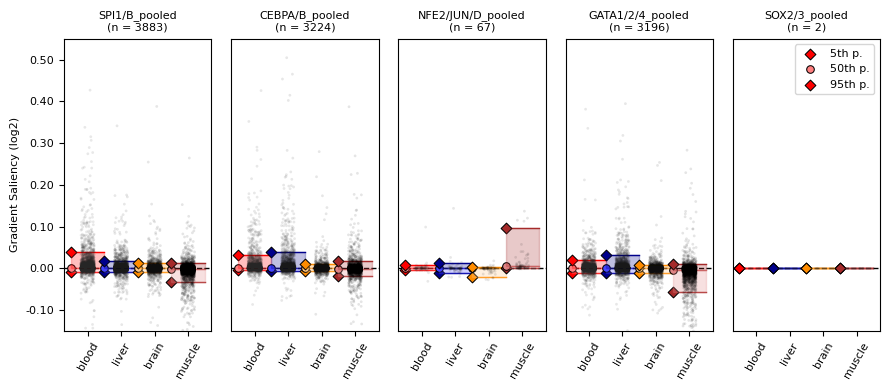

Motif = 'IRF1/2_pooled'
 - n = 458
 - Wilcoxon p ('blood' vs 'liver') = 3.31e-05 (s = 4.15)
 - Wilcoxon p ('blood' vs 'brain') = 6.30e-12 (s = 6.87)
 - Wilcoxon p ('blood' vs 'muscle') = 5.55e-23 (s = 9.87)
Motif = 'RUNX3_pooled'
 - n = 392
 - Wilcoxon p ('blood' vs 'liver') = 1.04e-03 (s = 3.28)
 - Wilcoxon p ('blood' vs 'brain') = 2.48e-04 (s = 3.66)
 - Wilcoxon p ('blood' vs 'muscle') = 4.92e-05 (s = 4.06)
Motif = 'IRF8_pooled'
 - n = 146
 - Wilcoxon p ('blood' vs 'liver') = 2.28e-07 (s = 5.18)
 - Wilcoxon p ('blood' vs 'brain') = 1.42e-08 (s = 5.67)
 - Wilcoxon p ('blood' vs 'muscle') = 6.18e-24 (s = 10.09)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


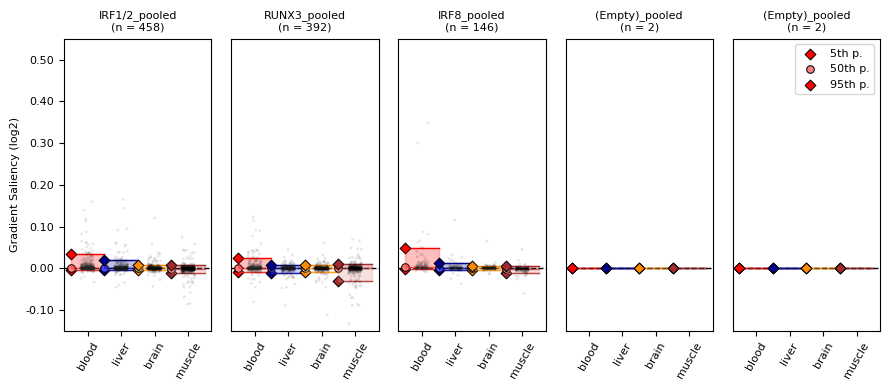

Motif = 'HNF4G_pooled'
 - n = 1766
 - Wilcoxon p ('liver' vs 'blood') = 7.79e-37 (s = 12.68)
 - Wilcoxon p ('liver' vs 'brain') = 7.58e-50 (s = 14.84)
 - Wilcoxon p ('liver' vs 'muscle') = 1.79e-81 (s = 19.12)
Motif = 'FOXA1/C1/A3/J3_pooled'
 - n = 1550
 - Wilcoxon p ('liver' vs 'blood') = 4.20e-02 (s = 2.03)
 - Wilcoxon p ('liver' vs 'brain') = 1.40e-03 (s = 3.19)
 - Wilcoxon p ('liver' vs 'muscle') = 1.30e-04 (s = -3.83)
Motif = 'SOX4/5_pooled'
 - n = 2
Motif = 'HNF6_pooled'
 - n = 1121
 - Wilcoxon p ('liver' vs 'blood') = 6.54e-01 (s = -0.45)
 - Wilcoxon p ('liver' vs 'brain') = 8.07e-03 (s = -2.65)
 - Wilcoxon p ('liver' vs 'muscle') = 4.10e-104 (s = 21.67)
Motif = 'HNF1A_pooled'
 - n = 355
 - Wilcoxon p ('liver' vs 'blood') = 7.76e-17 (s = 8.33)
 - Wilcoxon p ('liver' vs 'brain') = 4.90e-22 (s = 9.65)
 - Wilcoxon p ('liver' vs 'muscle') = 1.99e-39 (s = 13.14)


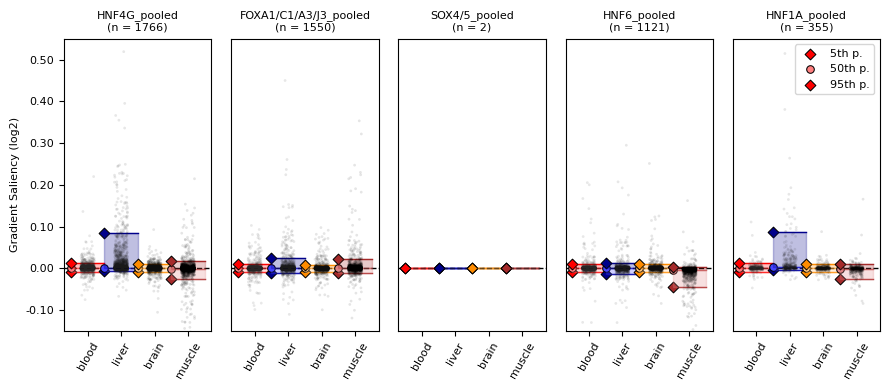

Motif = 'NFIA/C_pooled'
 - n = 1326
 - Wilcoxon p ('liver' vs 'blood') = 2.83e-01 (s = 1.07)
 - Wilcoxon p ('liver' vs 'brain') = 3.10e-01 (s = 1.02)
 - Wilcoxon p ('liver' vs 'muscle') = 3.11e-26 (s = 10.6)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


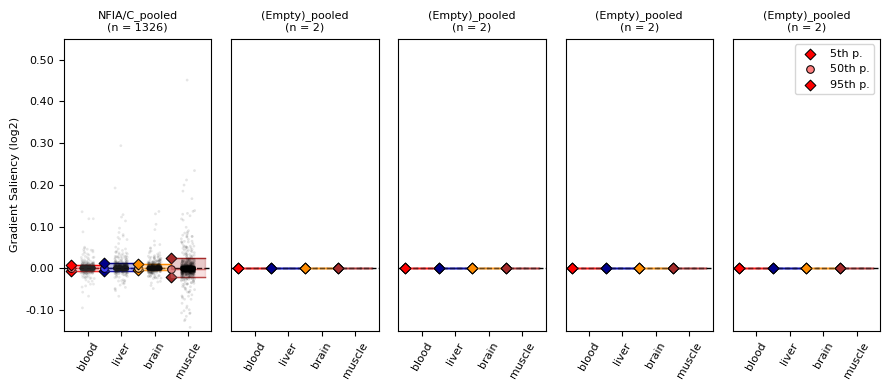

Motif = 'ZEB1_pooled'
 - n = 9717
 - Wilcoxon p ('brain' vs 'blood') = 2.70e-02 (s = -2.21)
 - Wilcoxon p ('brain' vs 'liver') = 2.78e-03 (s = -2.99)
 - Wilcoxon p ('brain' vs 'muscle') = 4.86e-06 (s = -4.57)
Motif = 'NDF2_pooled'
 - n = 2
Motif = 'SOX9_pooled'
 - n = 501
 - Wilcoxon p ('brain' vs 'blood') = 1.13e-13 (s = 7.42)
 - Wilcoxon p ('brain' vs 'liver') = 7.48e-10 (s = 6.16)
 - Wilcoxon p ('brain' vs 'muscle') = 2.48e-81 (s = 19.1)
Motif = 'MYCN_pooled'
 - n = 2
Motif = 'MEF2D_pooled'
 - n = 1718
 - Wilcoxon p ('brain' vs 'blood') = 8.19e-05 (s = -3.94)
 - Wilcoxon p ('brain' vs 'liver') = 2.14e-01 (s = 1.24)
 - Wilcoxon p ('brain' vs 'muscle') = 1.06e-180 (s = -28.66)


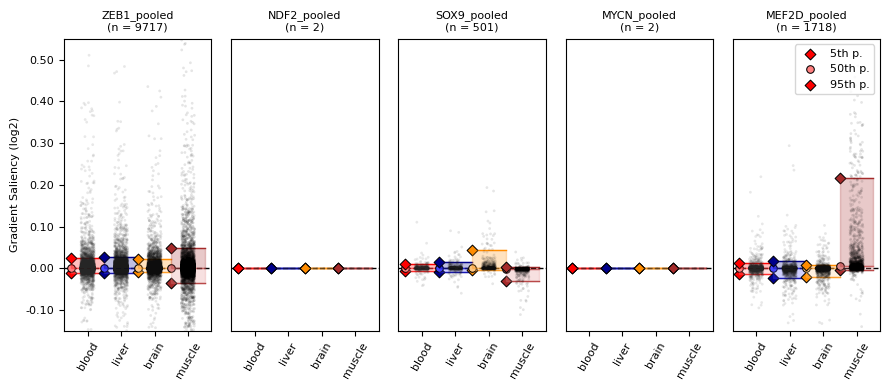

Motif = 'REST_pooled'
 - n = 134
 - Wilcoxon p ('brain' vs 'blood') = 2.99e-05 (s = 4.17)
 - Wilcoxon p ('brain' vs 'liver') = 9.03e-03 (s = 2.61)
 - Wilcoxon p ('brain' vs 'muscle') = 4.51e-24 (s = 10.12)
Motif = 'NFYA/B_pooled'
 - n = 327
 - Wilcoxon p ('brain' vs 'blood') = 2.47e-01 (s = 1.16)
 - Wilcoxon p ('brain' vs 'liver') = 8.14e-01 (s = 0.24)
 - Wilcoxon p ('brain' vs 'muscle') = 1.34e-38 (s = -12.99)
Motif = 'RFX5_pooled'
 - n = 312
 - Wilcoxon p ('brain' vs 'blood') = 1.77e-20 (s = 9.28)
 - Wilcoxon p ('brain' vs 'liver') = 1.97e-19 (s = 9.01)
 - Wilcoxon p ('brain' vs 'muscle') = 2.69e-44 (s = 13.96)
Motif = 'SP2_pooled'
 - n = 593
 - Wilcoxon p ('brain' vs 'blood') = 6.37e-03 (s = -2.73)
 - Wilcoxon p ('brain' vs 'liver') = 6.78e-01 (s = -0.41)
 - Wilcoxon p ('brain' vs 'muscle') = 1.82e-01 (s = -1.33)
Motif = 'CTCF_pooled'
 - n = 2896
 - Wilcoxon p ('brain' vs 'blood') = 2.15e-02 (s = 2.3)
 - Wilcoxon p ('brain' vs 'liver') = 9.27e-01 (s = 0.09)
 - Wilcoxon p ('brain' vs

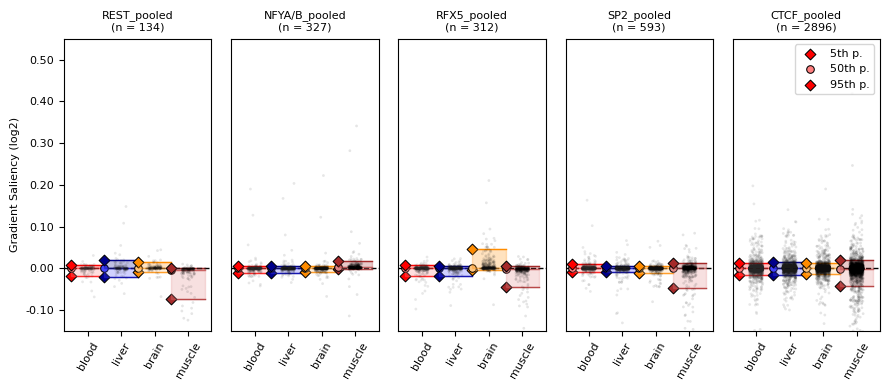

Motif = 'MYOG/D1_pooled'
 - n = 2729
 - Wilcoxon p ('muscle' vs 'blood') = 9.56e-120 (s = 23.27)
 - Wilcoxon p ('muscle' vs 'liver') = 1.71e-188 (s = 29.28)
 - Wilcoxon p ('muscle' vs 'brain') = 5.64e-160 (s = 26.95)
Motif = 'TEAD1/4_pooled'
 - n = 2195
 - Wilcoxon p ('muscle' vs 'blood') = 2.14e-04 (s = 3.7)
 - Wilcoxon p ('muscle' vs 'liver') = 1.94e-01 (s = 1.3)
 - Wilcoxon p ('muscle' vs 'brain') = 7.06e-09 (s = 5.79)
Motif = 'SIX1/2_pooled'
 - n = 1162
 - Wilcoxon p ('muscle' vs 'blood') = 5.93e-53 (s = 15.32)
 - Wilcoxon p ('muscle' vs 'liver') = 4.46e-67 (s = 17.3)
 - Wilcoxon p ('muscle' vs 'brain') = 8.08e-94 (s = 20.55)
Motif = 'GCR_pooled'
 - n = 738
 - Wilcoxon p ('muscle' vs 'blood') = 6.38e-72 (s = 17.93)
 - Wilcoxon p ('muscle' vs 'liver') = 1.57e-44 (s = 14.0)
 - Wilcoxon p ('muscle' vs 'brain') = 1.66e-67 (s = 17.36)
Motif = 'ATF1/2_pooled'
 - n = 1378
 - Wilcoxon p ('muscle' vs 'blood') = 4.28e-07 (s = 5.06)
 - Wilcoxon p ('muscle' vs 'liver') = 3.16e-12 (s = 6.97)
 -

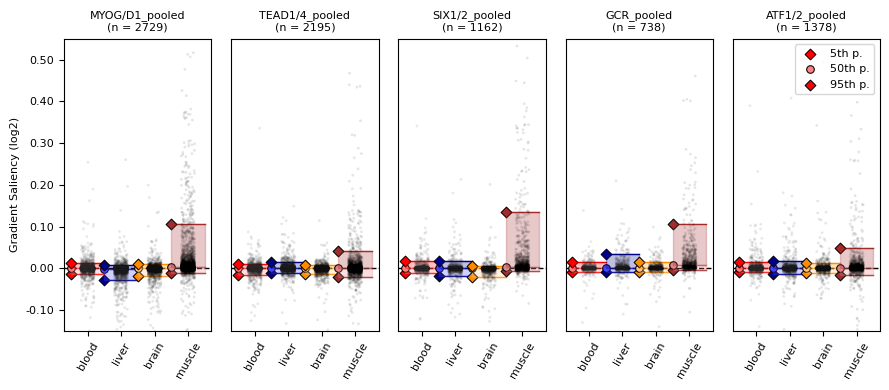

Motif = 'ERR1/2/3_pooled'
 - n = 463
 - Wilcoxon p ('muscle' vs 'blood') = 5.86e-09 (s = 5.82)
 - Wilcoxon p ('muscle' vs 'liver') = 2.20e-05 (s = 4.24)
 - Wilcoxon p ('muscle' vs 'brain') = 2.44e-09 (s = 5.97)
Motif = 'NF2L2_pooled'
 - n = 5352
 - Wilcoxon p ('muscle' vs 'blood') = 5.46e-10 (s = -6.21)
 - Wilcoxon p ('muscle' vs 'liver') = 8.52e-01 (s = -0.19)
 - Wilcoxon p ('muscle' vs 'brain') = 4.97e-03 (s = 2.81)
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2
Motif = '(Empty)_pooled'
 - n = 2


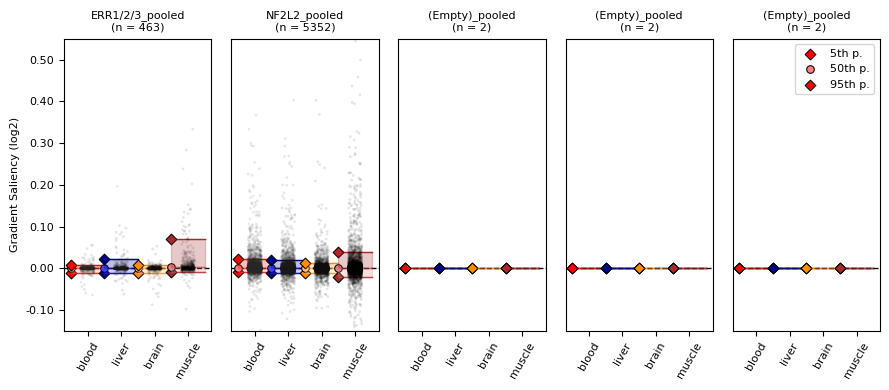

In [18]:
#Interpret muscle-specific genes

plot_modisco_interpretation(
    tissue_i=3,
    tissue_colors=['red', 'darkblue', 'darkorange', 'brown'],
    save_figs=False,
    save_prefix='attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_pos_neg_pooled_',
    
    y_min_fixed=-0.15, y_max_fixed=0.55,
    
    col_width=1.8,
    
    qtls=[0.05, 0.50, 0.95],
    shades=[1.0, 0.5, 1.0],
    markers=['D', 'o', 'D'],
)


In [13]:
#Compute tissue-pooled score distributions

n_tissues = len(tissue_names)
n_motifs = 10

pwm_configs_pooled = [[]]
pwms_pooled = [[]]
pwm_scores_pooled = [[]]
seqlet_dfs_pooled = [[]]

#Loop over PWMs
for pwm_i in range(n_tissues * n_motifs) :
    
    print("Pooling across tissues for motif = '" + pwm_configs[pwm_i // n_motifs][pwm_i][0] + "'")
    
    pwm_configs_pooled[0].append(pwm_configs[pwm_i // n_motifs][pwm_i])
    pwms_pooled[0].append(pwms[pwm_i // n_motifs][pwm_i])
    
    pwm_score_pooled = pwm_scores[0][pwm_i]
    seqlet_df_pooled = seqlet_dfs[0][pwm_i]
    
    #Loop over tissues and accumuluate scores
    for tissue_i in range(1, n_tissues) :
        pwm_score_pooled = np.concatenate([pwm_score_pooled, pwm_scores[tissue_i][pwm_i]], axis=0)
        seqlet_df_pooled = pd.concat([seqlet_df_pooled, seqlet_dfs[tissue_i][pwm_i]]).copy().reset_index(drop=True)
    
    pwm_scores_pooled[0].append(pwm_score_pooled)
    seqlet_dfs_pooled[0].append(seqlet_df_pooled)

pwm_configs = pwm_configs_pooled
pwms = pwms_pooled
pwm_scores = pwm_scores_pooled
seqlet_dfs = seqlet_dfs_pooled


Pooling across tissues for motif = 'SPI1/B_pooled'
Pooling across tissues for motif = 'CEBPA/B_pooled'
Pooling across tissues for motif = 'NFE2/JUN/D_pooled'
Pooling across tissues for motif = 'GATA1/2/4_pooled'
Pooling across tissues for motif = 'SOX2/3_pooled'
Pooling across tissues for motif = 'IRF1/2_pooled'
Pooling across tissues for motif = 'RUNX3_pooled'
Pooling across tissues for motif = 'IRF8_pooled'
Pooling across tissues for motif = '(Empty)_pooled'
Pooling across tissues for motif = '(Empty)_pooled'
Pooling across tissues for motif = 'HNF4G_pooled'
Pooling across tissues for motif = 'FOXA1/C1/A3/J3_pooled'
Pooling across tissues for motif = 'SOX4/5_pooled'
Pooling across tissues for motif = 'HNF6_pooled'
Pooling across tissues for motif = 'HNF1A_pooled'
Pooling across tissues for motif = 'NFIA/C_pooled'
Pooling across tissues for motif = '(Empty)_pooled'
Pooling across tissues for motif = '(Empty)_pooled'
Pooling across tissues for motif = '(Empty)_pooled'
Pooling across ti

[Salient Motifs for Tissue = 'blood']

-- Motif PWMs --
SPI1/B_pooled


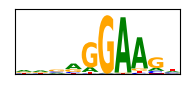

CEBPA/B_pooled


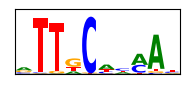

NFE2/JUN/D_pooled


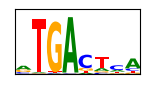

GATA1/2/4_pooled


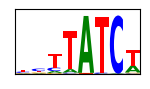

SOX2/3_pooled


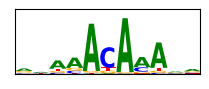

IRF1/2_pooled


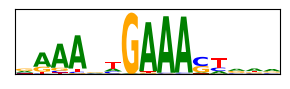

RUNX3_pooled


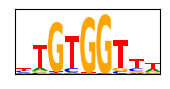

IRF8_pooled


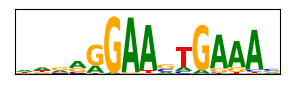

(Empty)_pooled


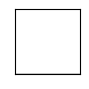

(Empty)_pooled


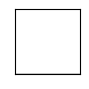

HNF4G_pooled


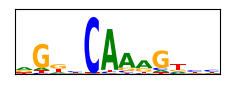

FOXA1/C1/A3/J3_pooled


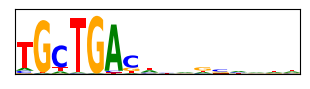

SOX4/5_pooled


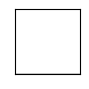

HNF6_pooled


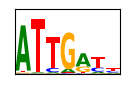

HNF1A_pooled


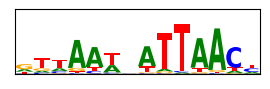

NFIA/C_pooled


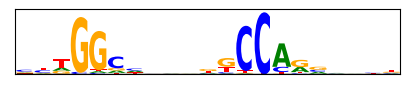

(Empty)_pooled


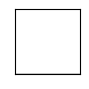

(Empty)_pooled


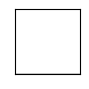

(Empty)_pooled


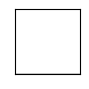

(Empty)_pooled


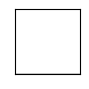

ZEB1_pooled


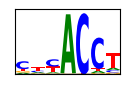

NDF2_pooled


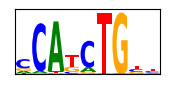

SOX9_pooled


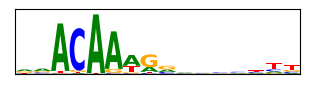

MYCN_pooled


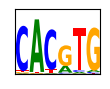

MEF2D_pooled


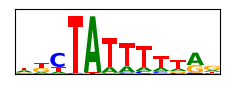

REST_pooled


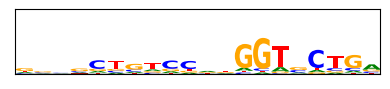

NFYA/B_pooled


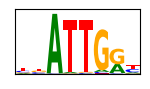

RFX5_pooled


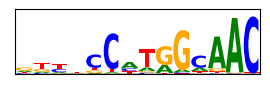

SP2_pooled


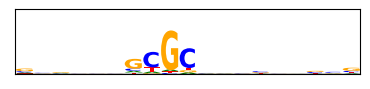

CTCF_pooled


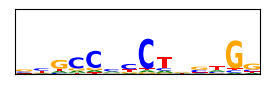

MYOG/D1_pooled


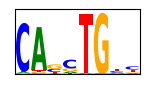

TEAD1/4_pooled


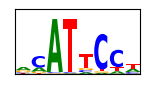

SIX1/2_pooled


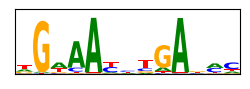

GCR_pooled


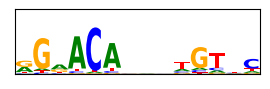

ATF1/2_pooled


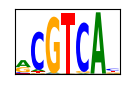

ERR1/2/3_pooled


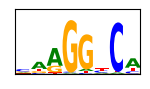

NF2L2_pooled


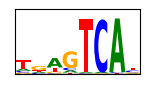

(Empty)_pooled


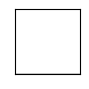

(Empty)_pooled


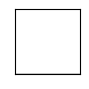

(Empty)_pooled


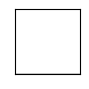

-- Motif Score Distributions --
Motif = 'SPI1/B_pooled'
 - n = 19891
 - Wilcoxon p ('blood' vs 'liver') = 0.00e+00 (s = 37.91)
 - Wilcoxon p ('blood' vs 'brain') = 0.00e+00 (s = 39.75)
 - Wilcoxon p ('blood' vs 'muscle') = 5.70e-305 (s = 37.33)
Motif = 'CEBPA/B_pooled'
 - n = 16559
 - Wilcoxon p ('blood' vs 'liver') = 7.54e-02 (s = 1.78)
 - Wilcoxon p ('blood' vs 'brain') = 1.54e-287 (s = 36.24)
 - Wilcoxon p ('blood' vs 'muscle') = 1.18e-186 (s = 29.14)
Motif = 'NFE2/JUN/D_pooled'
 - n = 16353
 - Wilcoxon p ('blood' vs 'liver') = 6.88e-153 (s = 26.34)
 - Wilcoxon p ('blood' vs 'brain') = 2.07e-94 (s = 20.61)
 - Wilcoxon p ('blood' vs 'muscle') = 4.15e-64 (s = 16.9)
Motif = 'GATA1/2/4_pooled'
 - n = 10172
 - Wilcoxon p ('blood' vs 'liver') = 7.22e-05 (s = 3.97)
 - Wilcoxon p ('blood' vs 'brain') = 2.39e-83 (s = 19.34)
 - Wilcoxon p ('blood' vs 'muscle') = 8.61e-97 (s = 20.88)
Motif = 'SOX2/3_pooled'
 - n = 1686
 - Wilcoxon p ('blood' vs 'liver') = 7.70e-01 (s = 0.29)
 - Wilcoxon p ('bl

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


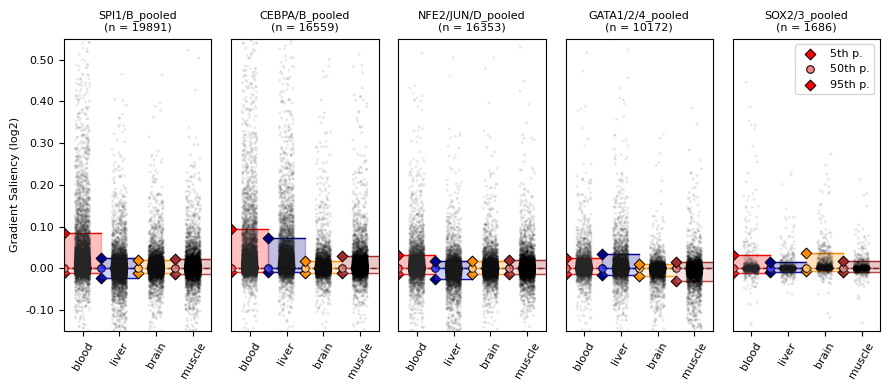

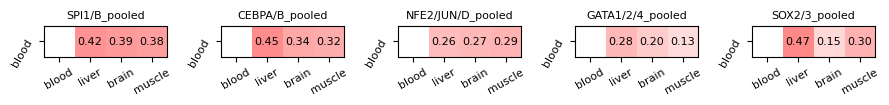

Motif = 'IRF1/2_pooled'
 - n = 2156
 - Wilcoxon p ('blood' vs 'liver') = 2.36e-70 (s = 17.73)
 - Wilcoxon p ('blood' vs 'brain') = 2.51e-73 (s = 18.11)
 - Wilcoxon p ('blood' vs 'muscle') = 2.27e-38 (s = 12.95)
Motif = 'RUNX3_pooled'
 - n = 2308
 - Wilcoxon p ('blood' vs 'liver') = 5.44e-63 (s = 16.75)
 - Wilcoxon p ('blood' vs 'brain') = 2.98e-24 (s = 10.16)
 - Wilcoxon p ('blood' vs 'muscle') = 3.89e-17 (s = 8.42)
Motif = 'IRF8_pooled'
 - n = 1042
 - Wilcoxon p ('blood' vs 'liver') = 2.05e-36 (s = 12.6)
 - Wilcoxon p ('blood' vs 'brain') = 1.06e-35 (s = 12.47)
 - Wilcoxon p ('blood' vs 'muscle') = 1.18e-28 (s = 11.11)
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


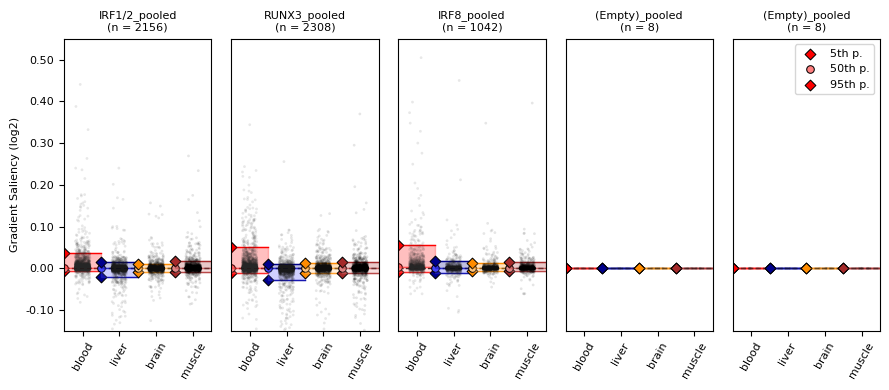

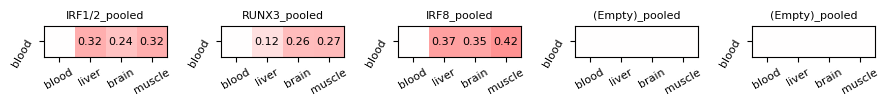

Motif = 'HNF4G_pooled'
 - n = 10920
 - Wilcoxon p ('liver' vs 'blood') = 0.00e+00 (s = 39.75)
 - Wilcoxon p ('liver' vs 'brain') = 0.00e+00 (s = 40.93)
 - Wilcoxon p ('liver' vs 'muscle') = 1.39e-281 (s = 35.86)
Motif = 'FOXA1/C1/A3/J3_pooled'
 - n = 8969
 - Wilcoxon p ('liver' vs 'blood') = 3.03e-181 (s = 28.71)
 - Wilcoxon p ('liver' vs 'brain') = 2.99e-222 (s = 31.82)
 - Wilcoxon p ('liver' vs 'muscle') = 9.68e-71 (s = 17.78)
Motif = 'SOX4/5_pooled'
 - n = 467
 - Wilcoxon p ('liver' vs 'blood') = 1.86e-46 (s = -14.31)
 - Wilcoxon p ('liver' vs 'brain') = 1.42e-90 (s = -20.18)
 - Wilcoxon p ('liver' vs 'muscle') = 4.82e-62 (s = -16.62)
Motif = 'HNF6_pooled'
 - n = 2570
 - Wilcoxon p ('liver' vs 'blood') = 2.16e-44 (s = 13.98)
 - Wilcoxon p ('liver' vs 'brain') = 5.72e-108 (s = 22.07)
 - Wilcoxon p ('liver' vs 'muscle') = 5.32e-137 (s = 24.91)
Motif = 'HNF1A_pooled'
 - n = 2112
 - Wilcoxon p ('liver' vs 'blood') = 1.02e-68 (s = 17.52)
 - Wilcoxon p ('liver' vs 'brain') = 3.33e-73 (s =

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


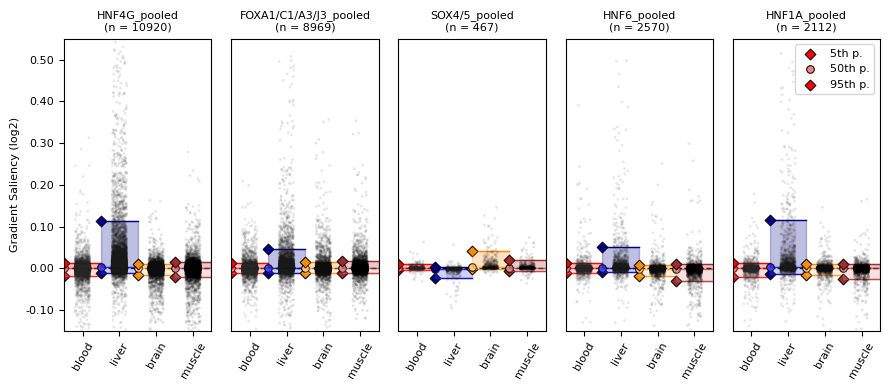

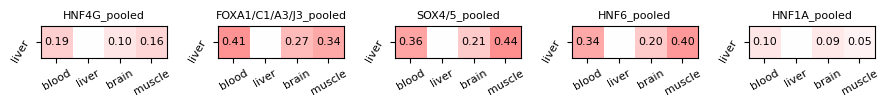

Motif = 'NFIA/C_pooled'
 - n = 4553
 - Wilcoxon p ('liver' vs 'blood') = 1.03e-01 (s = -1.63)
 - Wilcoxon p ('liver' vs 'brain') = 1.42e-33 (s = -12.08)
 - Wilcoxon p ('liver' vs 'muscle') = 4.96e-19 (s = -8.91)
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


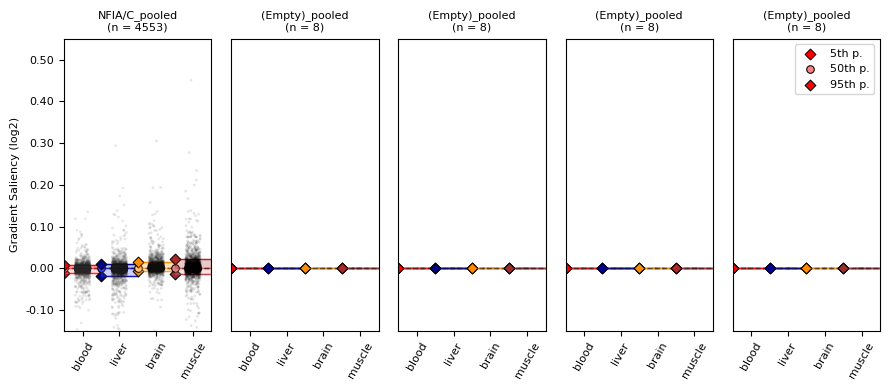

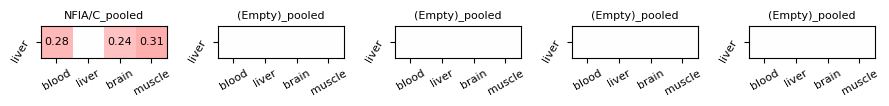

Motif = 'ZEB1_pooled'
 - n = 32500
 - Wilcoxon p ('brain' vs 'blood') = 1.60e-22 (s = -9.76)
 - Wilcoxon p ('brain' vs 'liver') = 5.80e-114 (s = -22.69)
 - Wilcoxon p ('brain' vs 'muscle') = 2.49e-06 (s = -4.71)
Motif = 'NDF2_pooled'
 - n = 1519
 - Wilcoxon p ('brain' vs 'blood') = 1.59e-177 (s = 28.41)
 - Wilcoxon p ('brain' vs 'liver') = 1.16e-94 (s = 20.64)
 - Wilcoxon p ('brain' vs 'muscle') = 3.23e-16 (s = 8.16)
Motif = 'SOX9_pooled'
 - n = 1599
 - Wilcoxon p ('brain' vs 'blood') = 2.30e-73 (s = 18.12)
 - Wilcoxon p ('brain' vs 'liver') = 2.62e-58 (s = 16.1)
 - Wilcoxon p ('brain' vs 'muscle') = 8.62e-88 (s = 19.86)
Motif = 'MYCN_pooled'
 - n = 285
 - Wilcoxon p ('brain' vs 'blood') = 1.36e-18 (s = 8.8)
 - Wilcoxon p ('brain' vs 'liver') = 4.27e-22 (s = 9.66)
 - Wilcoxon p ('brain' vs 'muscle') = 2.66e-20 (s = 9.23)
Motif = 'MEF2D_pooled'
 - n = 2869
 - Wilcoxon p ('brain' vs 'blood') = 1.27e-10 (s = 6.43)
 - Wilcoxon p ('brain' vs 'liver') = 1.56e-50 (s = 14.95)
 - Wilcoxon p ('b

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


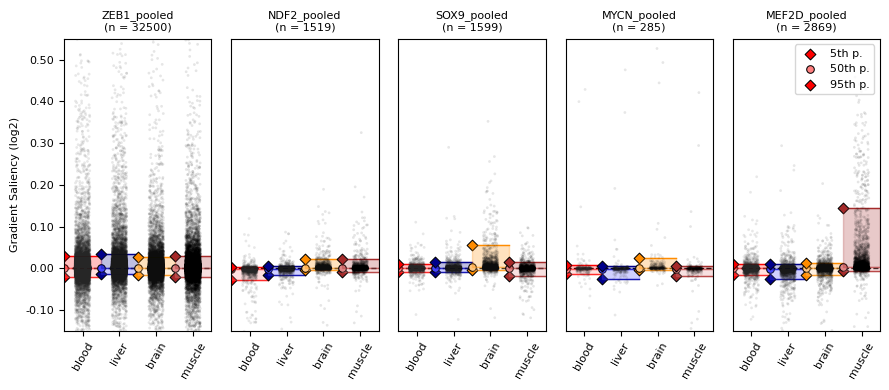

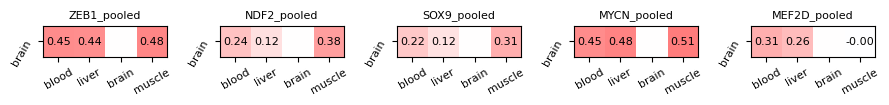

Motif = 'REST_pooled'
 - n = 840
 - Wilcoxon p ('brain' vs 'blood') = 1.59e-76 (s = 18.51)
 - Wilcoxon p ('brain' vs 'liver') = 9.60e-75 (s = 18.29)
 - Wilcoxon p ('brain' vs 'muscle') = 2.25e-95 (s = 20.72)
Motif = 'NFYA/B_pooled'
 - n = 1109
 - Wilcoxon p ('brain' vs 'blood') = 1.49e-01 (s = 1.44)
 - Wilcoxon p ('brain' vs 'liver') = 1.17e-27 (s = 10.9)
 - Wilcoxon p ('brain' vs 'muscle') = 2.16e-01 (s = 1.24)
Motif = 'RFX5_pooled'
 - n = 1766
 - Wilcoxon p ('brain' vs 'blood') = 2.68e-161 (s = 27.06)
 - Wilcoxon p ('brain' vs 'liver') = 1.24e-216 (s = 31.42)
 - Wilcoxon p ('brain' vs 'muscle') = 6.69e-212 (s = 31.07)
Motif = 'SP2_pooled'
 - n = 2338
 - Wilcoxon p ('brain' vs 'blood') = 3.09e-14 (s = 7.59)
 - Wilcoxon p ('brain' vs 'liver') = 1.50e-46 (s = 14.33)
 - Wilcoxon p ('brain' vs 'muscle') = 2.51e-21 (s = 9.48)
Motif = 'CTCF_pooled'
 - n = 11241
 - Wilcoxon p ('brain' vs 'blood') = 1.08e-04 (s = 3.87)
 - Wilcoxon p ('brain' vs 'liver') = 9.23e-14 (s = 7.45)
 - Wilcoxon p ('b

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


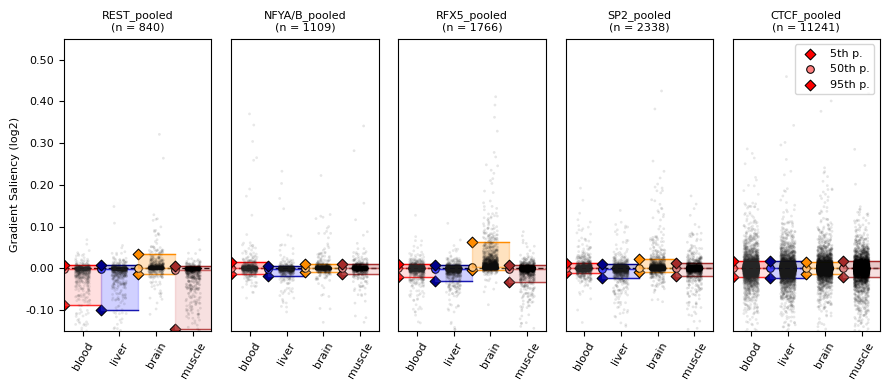

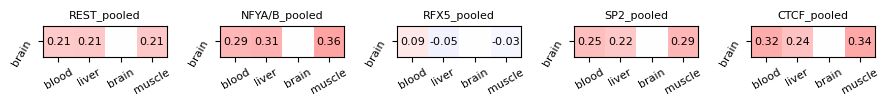

Motif = 'MYOG/D1_pooled'
 - n = 3840
 - Wilcoxon p ('muscle' vs 'blood') = 1.25e-114 (s = 22.76)
 - Wilcoxon p ('muscle' vs 'liver') = 0.00e+00 (s = 40.01)
 - Wilcoxon p ('muscle' vs 'brain') = 1.58e-133 (s = 24.59)
Motif = 'TEAD1/4_pooled'
 - n = 6419
 - Wilcoxon p ('muscle' vs 'blood') = 9.32e-59 (s = 16.16)
 - Wilcoxon p ('muscle' vs 'liver') = 1.79e-44 (s = 13.99)
 - Wilcoxon p ('muscle' vs 'brain') = 8.13e-139 (s = 25.08)
Motif = 'SIX1/2_pooled'
 - n = 1639
 - Wilcoxon p ('muscle' vs 'blood') = 1.04e-63 (s = 16.85)
 - Wilcoxon p ('muscle' vs 'liver') = 6.38e-70 (s = 17.68)
 - Wilcoxon p ('muscle' vs 'brain') = 2.61e-119 (s = 23.22)
Motif = 'GCR_pooled'
 - n = 1505
 - Wilcoxon p ('muscle' vs 'blood') = 1.69e-105 (s = 21.81)
 - Wilcoxon p ('muscle' vs 'liver') = 9.33e-48 (s = 14.52)
 - Wilcoxon p ('muscle' vs 'brain') = 6.64e-47 (s = 14.38)
Motif = 'ATF1/2_pooled'
 - n = 4436
 - Wilcoxon p ('muscle' vs 'blood') = 1.43e-46 (s = 14.33)
 - Wilcoxon p ('muscle' vs 'liver') = 5.67e-56 (s

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


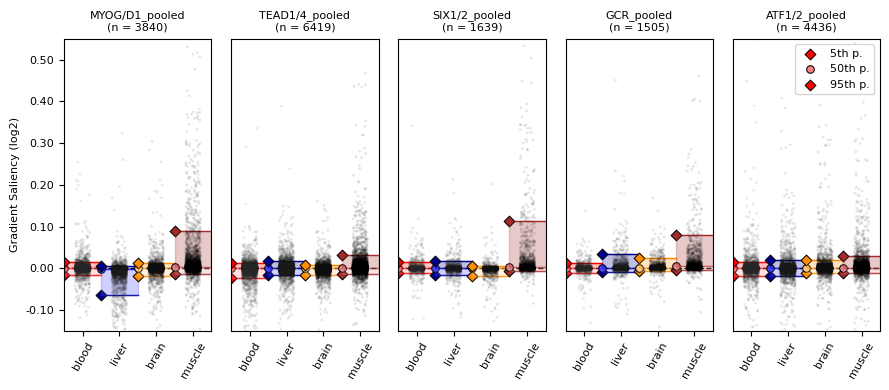

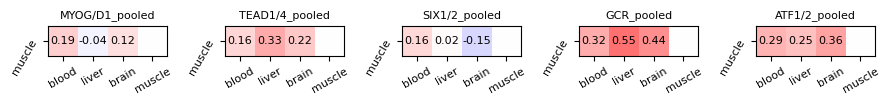

Motif = 'ERR1/2/3_pooled'
 - n = 1081
 - Wilcoxon p ('muscle' vs 'blood') = 1.01e-13 (s = 7.44)
 - Wilcoxon p ('muscle' vs 'liver') = 3.54e-02 (s = 2.1)
 - Wilcoxon p ('muscle' vs 'brain') = 4.86e-46 (s = 14.24)
Motif = 'NF2L2_pooled'
 - n = 6079
 - Wilcoxon p ('muscle' vs 'blood') = 2.96e-11 (s = -6.65)
 - Wilcoxon p ('muscle' vs 'liver') = 4.13e-03 (s = -2.87)
 - Wilcoxon p ('muscle' vs 'brain') = 2.09e-02 (s = 2.31)
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


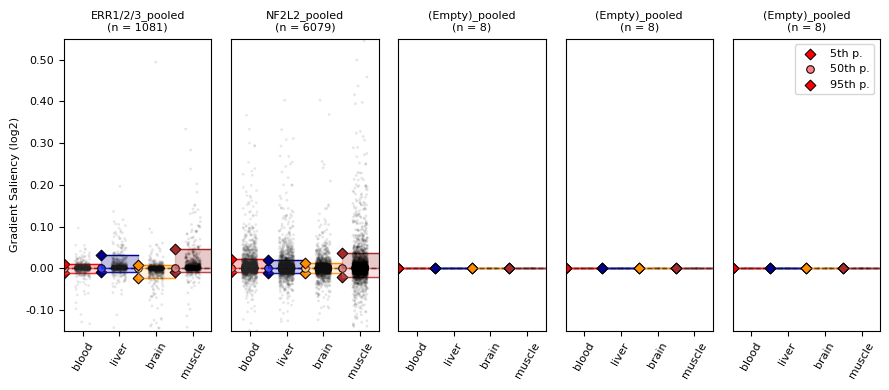

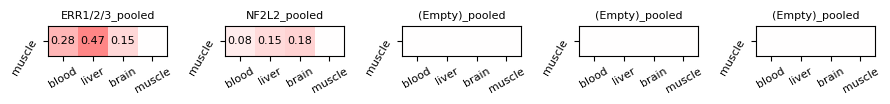

In [11]:
#Interpret pooled genes

plot_modisco_interpretation(
    tissue_i=0,
    tissue_colors=['red', 'darkblue', 'darkorange', 'brown'],
    save_figs=True,
    save_prefix='attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_tissue_pooled_',
    
    y_min_fixed=-0.15, y_max_fixed=0.55,
    
    col_width=1.8,
    
    plot_corrs=True,
    
    qtls=[0.05, 0.50, 0.95],
    shades=[1.0, 0.5, 1.0],
    markers=['D', 'o', 'D'],
)


[Salient Motifs for Tissue = 'blood']

-- Motif PWMs --
SPI1/B_pooled


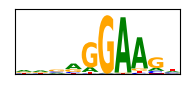

CEBPA/B_pooled


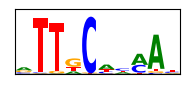

NFE2/JUN/D_pooled


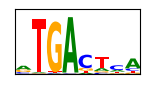

GATA1/2/4_pooled


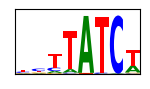

SOX2/3_pooled


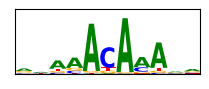

IRF1/2_pooled


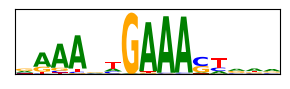

RUNX3_pooled


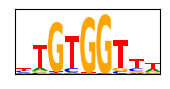

IRF8_pooled


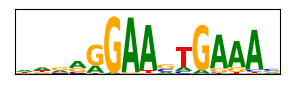

(Empty)_pooled


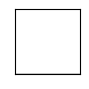

(Empty)_pooled


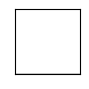

HNF4G_pooled


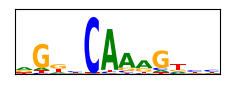

FOXA1/C1/A3/J3_pooled


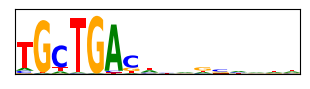

SOX4/5_pooled


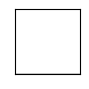

HNF6_pooled


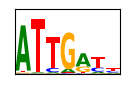

HNF1A_pooled


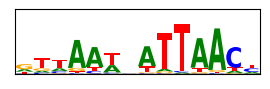

NFIA/C_pooled


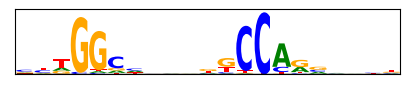

(Empty)_pooled


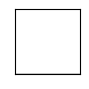

(Empty)_pooled


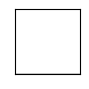

(Empty)_pooled


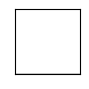

(Empty)_pooled


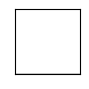

ZEB1_pooled


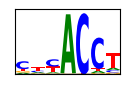

NDF2_pooled


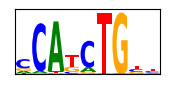

SOX9_pooled


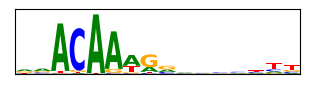

MYCN_pooled


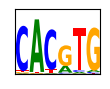

MEF2D_pooled


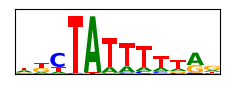

REST_pooled


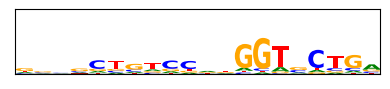

NFYA/B_pooled


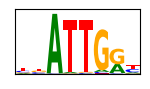

RFX5_pooled


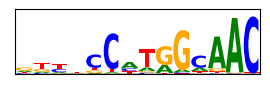

SP2_pooled


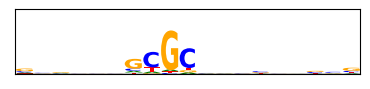

CTCF_pooled


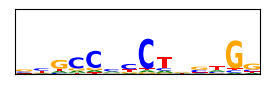

MYOG/D1_pooled


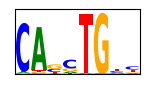

TEAD1/4_pooled


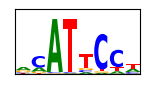

SIX1/2_pooled


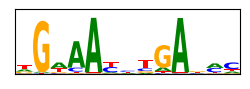

GCR_pooled


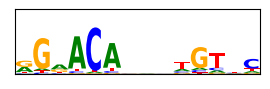

ATF1/2_pooled


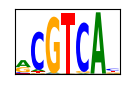

ERR1/2/3_pooled


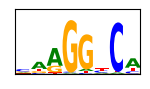

NF2L2_pooled


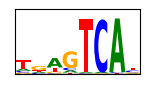

(Empty)_pooled


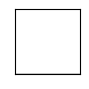

(Empty)_pooled


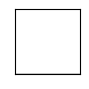

(Empty)_pooled


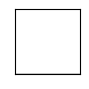

-- Motif Score Distributions --
Motif = 'SPI1/B_pooled'
 - n = 19891
 - Wilcoxon p ('blood' vs 'liver') = 0.00e+00 (s = 37.91)
 - Wilcoxon p ('blood' vs 'brain') = 0.00e+00 (s = 39.75)
 - Wilcoxon p ('blood' vs 'muscle') = 5.70e-305 (s = 37.33)
Motif = 'CEBPA/B_pooled'
 - n = 16559
 - Wilcoxon p ('blood' vs 'liver') = 7.54e-02 (s = 1.78)
 - Wilcoxon p ('blood' vs 'brain') = 1.54e-287 (s = 36.24)
 - Wilcoxon p ('blood' vs 'muscle') = 1.18e-186 (s = 29.14)
Motif = 'NFE2/JUN/D_pooled'
 - n = 16353
 - Wilcoxon p ('blood' vs 'liver') = 6.88e-153 (s = 26.34)
 - Wilcoxon p ('blood' vs 'brain') = 2.07e-94 (s = 20.61)
 - Wilcoxon p ('blood' vs 'muscle') = 4.15e-64 (s = 16.9)
Motif = 'GATA1/2/4_pooled'
 - n = 10172
 - Wilcoxon p ('blood' vs 'liver') = 7.22e-05 (s = 3.97)
 - Wilcoxon p ('blood' vs 'brain') = 2.39e-83 (s = 19.34)
 - Wilcoxon p ('blood' vs 'muscle') = 8.61e-97 (s = 20.88)
Motif = 'SOX2/3_pooled'
 - n = 1686
 - Wilcoxon p ('blood' vs 'liver') = 7.70e-01 (s = 0.29)
 - Wilcoxon p ('bl

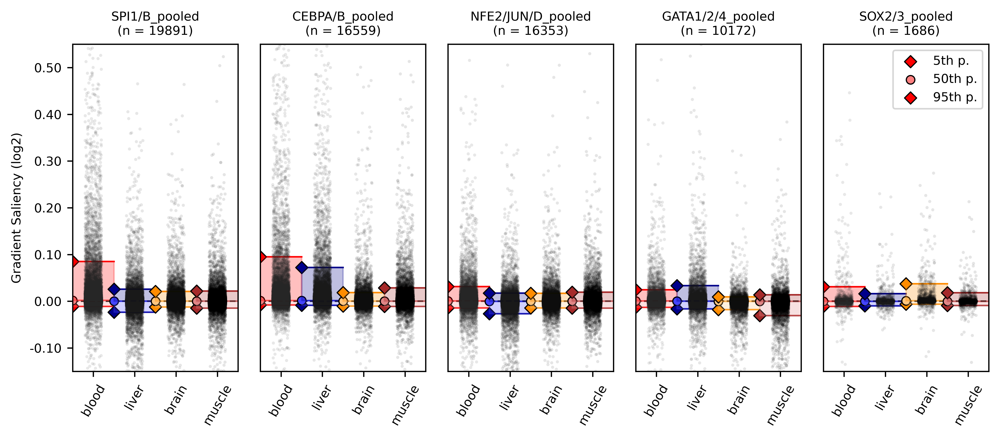

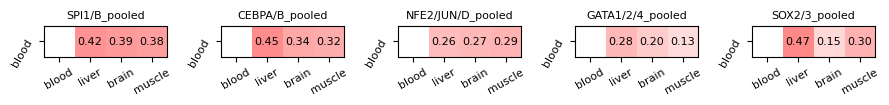

Motif = 'IRF1/2_pooled'
 - n = 2156
 - Wilcoxon p ('blood' vs 'liver') = 2.36e-70 (s = 17.73)
 - Wilcoxon p ('blood' vs 'brain') = 2.51e-73 (s = 18.11)
 - Wilcoxon p ('blood' vs 'muscle') = 2.27e-38 (s = 12.95)
Motif = 'RUNX3_pooled'
 - n = 2308
 - Wilcoxon p ('blood' vs 'liver') = 5.44e-63 (s = 16.75)
 - Wilcoxon p ('blood' vs 'brain') = 2.98e-24 (s = 10.16)
 - Wilcoxon p ('blood' vs 'muscle') = 3.89e-17 (s = 8.42)
Motif = 'IRF8_pooled'
 - n = 1042
 - Wilcoxon p ('blood' vs 'liver') = 2.05e-36 (s = 12.6)
 - Wilcoxon p ('blood' vs 'brain') = 1.06e-35 (s = 12.47)
 - Wilcoxon p ('blood' vs 'muscle') = 1.18e-28 (s = 11.11)
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8


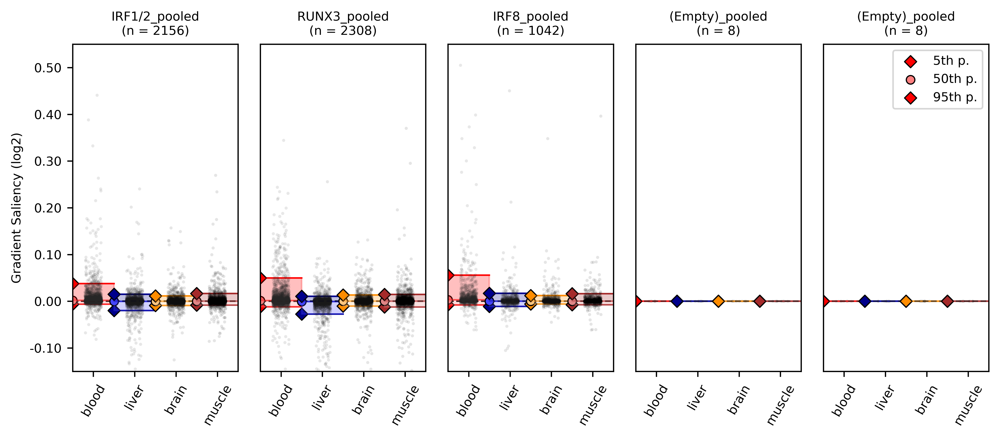

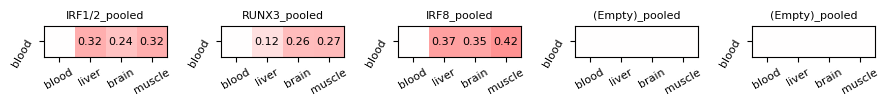

Motif = 'HNF4G_pooled'
 - n = 10920
 - Wilcoxon p ('liver' vs 'blood') = 0.00e+00 (s = 39.75)
 - Wilcoxon p ('liver' vs 'brain') = 0.00e+00 (s = 40.93)
 - Wilcoxon p ('liver' vs 'muscle') = 1.39e-281 (s = 35.86)
Motif = 'FOXA1/C1/A3/J3_pooled'
 - n = 8969
 - Wilcoxon p ('liver' vs 'blood') = 3.03e-181 (s = 28.71)
 - Wilcoxon p ('liver' vs 'brain') = 2.99e-222 (s = 31.82)
 - Wilcoxon p ('liver' vs 'muscle') = 9.68e-71 (s = 17.78)
Motif = 'SOX4/5_pooled'
 - n = 467
 - Wilcoxon p ('liver' vs 'blood') = 1.86e-46 (s = -14.31)
 - Wilcoxon p ('liver' vs 'brain') = 1.42e-90 (s = -20.18)
 - Wilcoxon p ('liver' vs 'muscle') = 4.82e-62 (s = -16.62)
Motif = 'HNF6_pooled'
 - n = 2570
 - Wilcoxon p ('liver' vs 'blood') = 2.16e-44 (s = 13.98)
 - Wilcoxon p ('liver' vs 'brain') = 5.72e-108 (s = 22.07)
 - Wilcoxon p ('liver' vs 'muscle') = 5.32e-137 (s = 24.91)
Motif = 'HNF1A_pooled'
 - n = 2112
 - Wilcoxon p ('liver' vs 'blood') = 1.02e-68 (s = 17.52)
 - Wilcoxon p ('liver' vs 'brain') = 3.33e-73 (s =

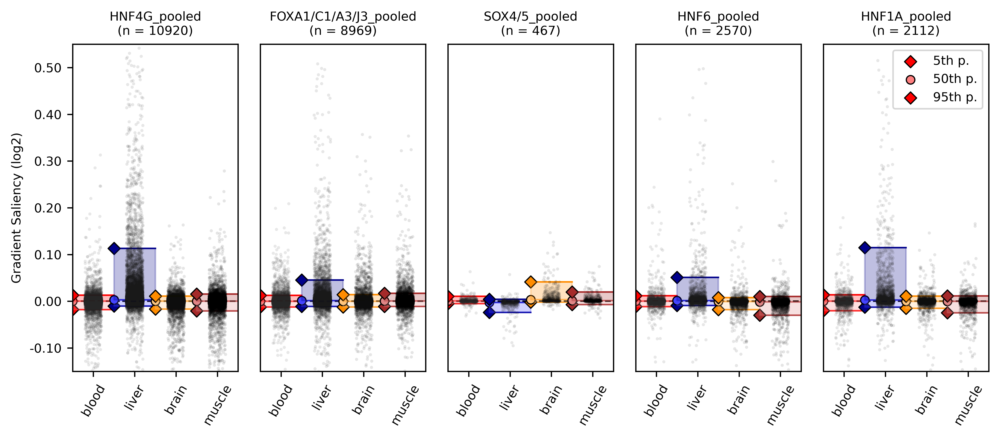

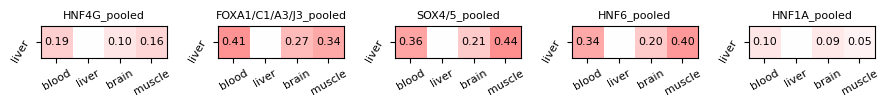

Motif = 'NFIA/C_pooled'
 - n = 4553
 - Wilcoxon p ('liver' vs 'blood') = 1.03e-01 (s = -1.63)
 - Wilcoxon p ('liver' vs 'brain') = 1.42e-33 (s = -12.08)
 - Wilcoxon p ('liver' vs 'muscle') = 4.96e-19 (s = -8.91)
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8


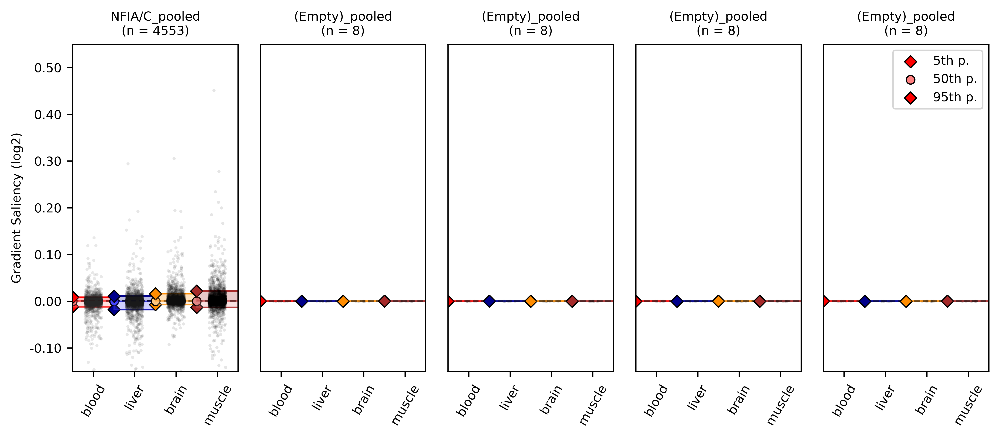

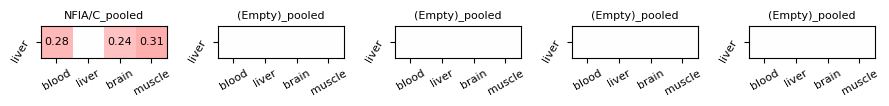

Motif = 'ZEB1_pooled'
 - n = 32500
 - Wilcoxon p ('brain' vs 'blood') = 1.60e-22 (s = -9.76)
 - Wilcoxon p ('brain' vs 'liver') = 5.80e-114 (s = -22.69)
 - Wilcoxon p ('brain' vs 'muscle') = 2.49e-06 (s = -4.71)
Motif = 'NDF2_pooled'
 - n = 1519
 - Wilcoxon p ('brain' vs 'blood') = 1.59e-177 (s = 28.41)
 - Wilcoxon p ('brain' vs 'liver') = 1.16e-94 (s = 20.64)
 - Wilcoxon p ('brain' vs 'muscle') = 3.23e-16 (s = 8.16)
Motif = 'SOX9_pooled'
 - n = 1599
 - Wilcoxon p ('brain' vs 'blood') = 2.30e-73 (s = 18.12)
 - Wilcoxon p ('brain' vs 'liver') = 2.62e-58 (s = 16.1)
 - Wilcoxon p ('brain' vs 'muscle') = 8.62e-88 (s = 19.86)
Motif = 'MYCN_pooled'
 - n = 285
 - Wilcoxon p ('brain' vs 'blood') = 1.36e-18 (s = 8.8)
 - Wilcoxon p ('brain' vs 'liver') = 4.27e-22 (s = 9.66)
 - Wilcoxon p ('brain' vs 'muscle') = 2.66e-20 (s = 9.23)
Motif = 'MEF2D_pooled'
 - n = 2869
 - Wilcoxon p ('brain' vs 'blood') = 1.27e-10 (s = 6.43)
 - Wilcoxon p ('brain' vs 'liver') = 1.56e-50 (s = 14.95)
 - Wilcoxon p ('b

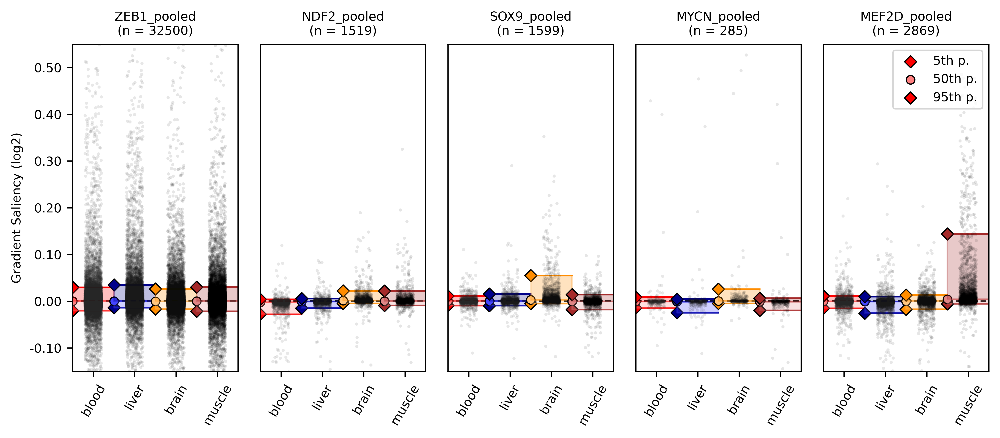

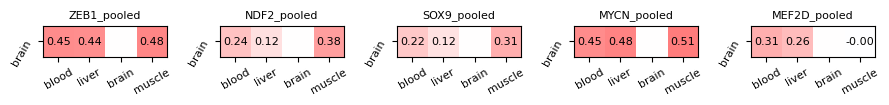

Motif = 'REST_pooled'
 - n = 840
 - Wilcoxon p ('brain' vs 'blood') = 1.59e-76 (s = 18.51)
 - Wilcoxon p ('brain' vs 'liver') = 9.60e-75 (s = 18.29)
 - Wilcoxon p ('brain' vs 'muscle') = 2.25e-95 (s = 20.72)
Motif = 'NFYA/B_pooled'
 - n = 1109
 - Wilcoxon p ('brain' vs 'blood') = 1.49e-01 (s = 1.44)
 - Wilcoxon p ('brain' vs 'liver') = 1.17e-27 (s = 10.9)
 - Wilcoxon p ('brain' vs 'muscle') = 2.16e-01 (s = 1.24)
Motif = 'RFX5_pooled'
 - n = 1766
 - Wilcoxon p ('brain' vs 'blood') = 2.68e-161 (s = 27.06)
 - Wilcoxon p ('brain' vs 'liver') = 1.24e-216 (s = 31.42)
 - Wilcoxon p ('brain' vs 'muscle') = 6.69e-212 (s = 31.07)
Motif = 'SP2_pooled'
 - n = 2338
 - Wilcoxon p ('brain' vs 'blood') = 3.09e-14 (s = 7.59)
 - Wilcoxon p ('brain' vs 'liver') = 1.50e-46 (s = 14.33)
 - Wilcoxon p ('brain' vs 'muscle') = 2.51e-21 (s = 9.48)
Motif = 'CTCF_pooled'
 - n = 11241
 - Wilcoxon p ('brain' vs 'blood') = 1.08e-04 (s = 3.87)
 - Wilcoxon p ('brain' vs 'liver') = 9.23e-14 (s = 7.45)
 - Wilcoxon p ('b

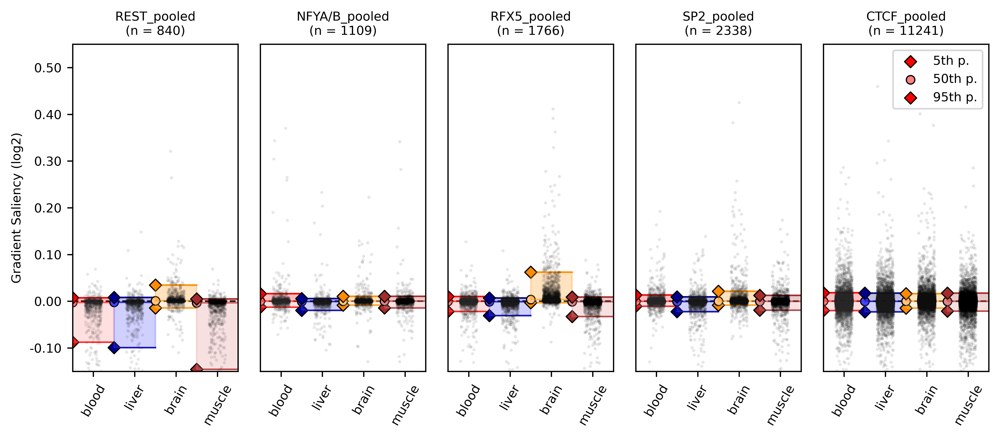

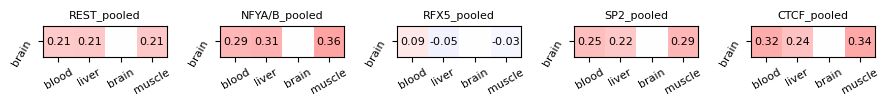

Motif = 'MYOG/D1_pooled'
 - n = 3840
 - Wilcoxon p ('muscle' vs 'blood') = 1.25e-114 (s = 22.76)
 - Wilcoxon p ('muscle' vs 'liver') = 0.00e+00 (s = 40.01)
 - Wilcoxon p ('muscle' vs 'brain') = 1.58e-133 (s = 24.59)
Motif = 'TEAD1/4_pooled'
 - n = 6419
 - Wilcoxon p ('muscle' vs 'blood') = 9.32e-59 (s = 16.16)
 - Wilcoxon p ('muscle' vs 'liver') = 1.79e-44 (s = 13.99)
 - Wilcoxon p ('muscle' vs 'brain') = 8.13e-139 (s = 25.08)
Motif = 'SIX1/2_pooled'
 - n = 1639
 - Wilcoxon p ('muscle' vs 'blood') = 1.04e-63 (s = 16.85)
 - Wilcoxon p ('muscle' vs 'liver') = 6.38e-70 (s = 17.68)
 - Wilcoxon p ('muscle' vs 'brain') = 2.61e-119 (s = 23.22)
Motif = 'GCR_pooled'
 - n = 1505
 - Wilcoxon p ('muscle' vs 'blood') = 1.69e-105 (s = 21.81)
 - Wilcoxon p ('muscle' vs 'liver') = 9.33e-48 (s = 14.52)
 - Wilcoxon p ('muscle' vs 'brain') = 6.64e-47 (s = 14.38)
Motif = 'ATF1/2_pooled'
 - n = 4436
 - Wilcoxon p ('muscle' vs 'blood') = 1.43e-46 (s = 14.33)
 - Wilcoxon p ('muscle' vs 'liver') = 5.67e-56 (s

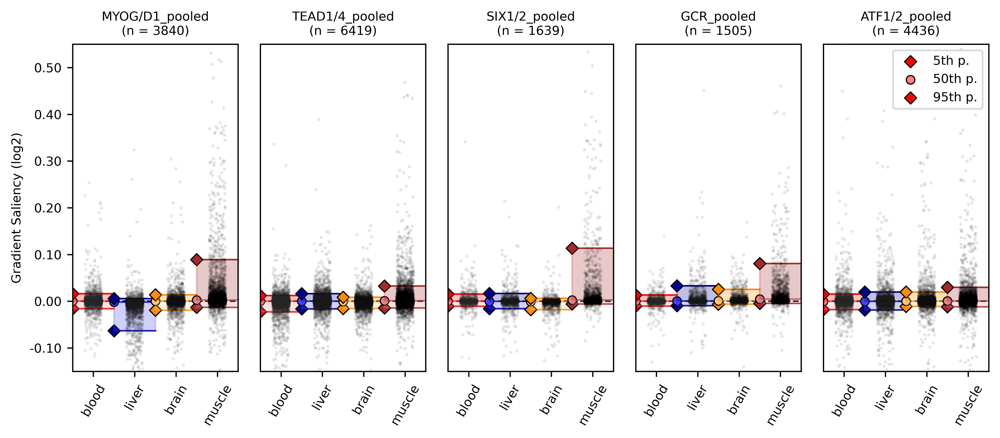

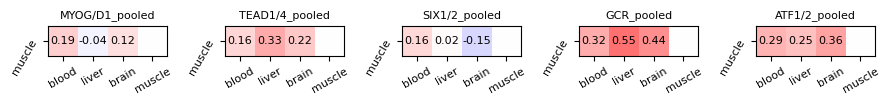

Motif = 'ERR1/2/3_pooled'
 - n = 1081
 - Wilcoxon p ('muscle' vs 'blood') = 1.01e-13 (s = 7.44)
 - Wilcoxon p ('muscle' vs 'liver') = 3.54e-02 (s = 2.1)
 - Wilcoxon p ('muscle' vs 'brain') = 4.86e-46 (s = 14.24)
Motif = 'NF2L2_pooled'
 - n = 6079
 - Wilcoxon p ('muscle' vs 'blood') = 2.96e-11 (s = -6.65)
 - Wilcoxon p ('muscle' vs 'liver') = 4.13e-03 (s = -2.87)
 - Wilcoxon p ('muscle' vs 'brain') = 2.09e-02 (s = 2.31)
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8
Motif = '(Empty)_pooled'
 - n = 8


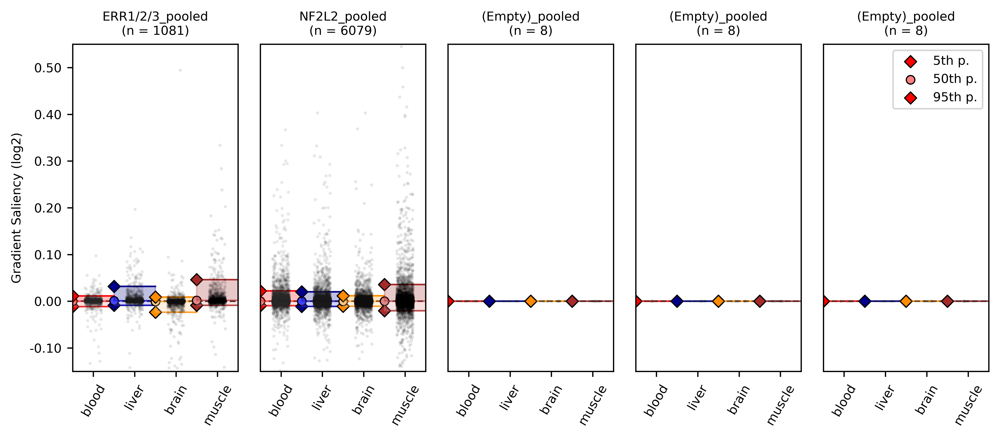

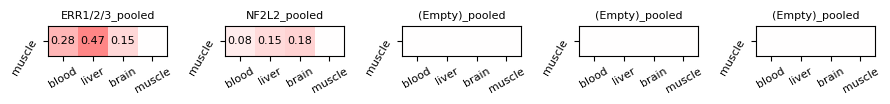

In [18]:
#Interpret pooled genes (rasterize scatter dots)

plot_modisco_interpretation(
    tissue_i=0,
    
    rasterize_dpi=600,
    
    tissue_colors=['red', 'darkblue', 'darkorange', 'brown'],
    save_figs=True,
    save_prefix='attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_tissue_pooled_',
    
    y_min_fixed=-0.15, y_max_fixed=0.55,
    
    col_width=1.8,
    
    plot_corrs=True,
    
    qtls=[0.05, 0.50, 0.95],
    shades=[1.0, 0.5, 1.0],
    markers=['D', 'o', 'D'],
)


Motif = 'CEBPA/B_pooled'
 - Gradient spearman r = 0.45
 - Residual expr spearman r = 0.308
 - n = 16559


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


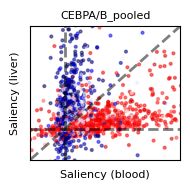

In [20]:
#Make scatter plots comparing seqlet scores across tissues for specific TFs

save_figs = True
save_prefix = 'attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_pooled_'

pwm_index = [1]

tissue_1_ix = 0
tissue_2_ix = 1

grad_min = -0.15
grad_max = 0.50

min_tpm = 0.

#Loop over pwms
for pwm_i in pwm_index :

    #Get gradient scores
    scores_1 = pwm_scores[0][pwm_i][:, tissue_1_ix]
    scores_2 = pwm_scores[0][pwm_i][:, tissue_2_ix]

    #Get list of genes for seqlets
    genes = seqlet_dfs[0][pwm_i]['gene'].apply(lambda x: x.split(".")[0]).values.tolist()

    #Find log tpm values for each seqlet's gene
    tpm_1 = []
    tpm_2 = []
    keep_index = []
    for gene_i, gene in enumerate(genes) :
        if gene in tpm_dict_all :
            row_curr = tpm_df_all.iloc[tpm_dict_all[gene]]

            if row_curr[tissues[tissue_1_ix]] > min_tpm or row_curr[tissues[tissue_2_ix]] > min_tpm :
                tpm_1.append(row_curr[tissues[tissue_1_ix] + '_log2'])
                tpm_2.append(row_curr[tissues[tissue_2_ix] + '_log2'])
                keep_index.append(gene_i)
            else :
                tpm_1.append(0.)
                tpm_2.append(0.)
        else :
            tpm_1.append(0.)
            tpm_2.append(0.)

    #Get tpm vectors
    tpm_1 = np.array(tpm_1, dtype='float32')
    tpm_2 = np.array(tpm_2, dtype='float32')

    #Filter data and shuffle seqlets
    keep_index = np.array(keep_index, dtype='int32')
    np.random.shuffle(keep_index)

    #Apply filter
    scores_1 = scores_1[keep_index]
    scores_2 = scores_2[keep_index]
    tpm_1 = tpm_1[keep_index]
    tpm_2 = tpm_2[keep_index]

    n = scores_1.shape[0]

    #Calculate correlations
    r_val, _ = spearmanr(scores_1, scores_2)
    r_val_e, _ = spearmanr(scores_1 - scores_2, tpm_1 - tpm_2)

    vmax_abs = np.quantile(np.abs(np.abs(tpm_1-tpm_2)), q=0.98)

    #Print metrics
    print("Motif = '" + pwm_configs[0][pwm_i][0] + "'")
    print(" - Gradient spearman r = " + str(round(r_val, 3)))
    print(" - Residual expr spearman r = " + str(round(r_val_e, 3)))
    print(" - n = " + str(n))

    #Generate colored scatter plot
    f = plt.figure(figsize=(2, 2))

    plt.scatter(scores_1, scores_2, c=tpm_1-tpm_2, cmap='seismic', vmin=-vmax_abs, vmax=vmax_abs, s=4, alpha=0.5)

    plt.axhline(y=0., linewidth=2, linestyle='--', color='black', alpha=0.5)
    plt.axvline(x=0., linewidth=2, linestyle='--', color='black', alpha=0.5)
    plt.plot([grad_min, grad_max], [grad_min, grad_max], linewidth=2, linestyle='--', color='black', alpha=0.5)
    
    plt.xticks([], [])
    plt.yticks([], [])

    plt.xlabel("Saliency (" + tissue_names[tissue_1_ix] + ")", fontsize=8)
    plt.ylabel("Saliency (" + tissue_names[tissue_2_ix] + ")", fontsize=8)

    plt.title(pwm_configs[0][pwm_i][0], fontsize=8)

    plt.xlim(grad_min, grad_max)
    plt.ylim(grad_min, grad_max)

    plt.tight_layout()
    
    if save_figs :
        plt.savefig(save_prefix + "_differential_scatter_pwm_" + str(pwm_i) + ".png", dpi=600, transparent=False)
        plt.savefig(save_prefix + "_differential_scatter_pwm_" + str(pwm_i) + ".eps")

    plt.show()


Motif = 'CEBPA/B_pooled'
 - Gradient spearman r = 0.45
 - Residual expr spearman r = 0.308
 - n = 16559


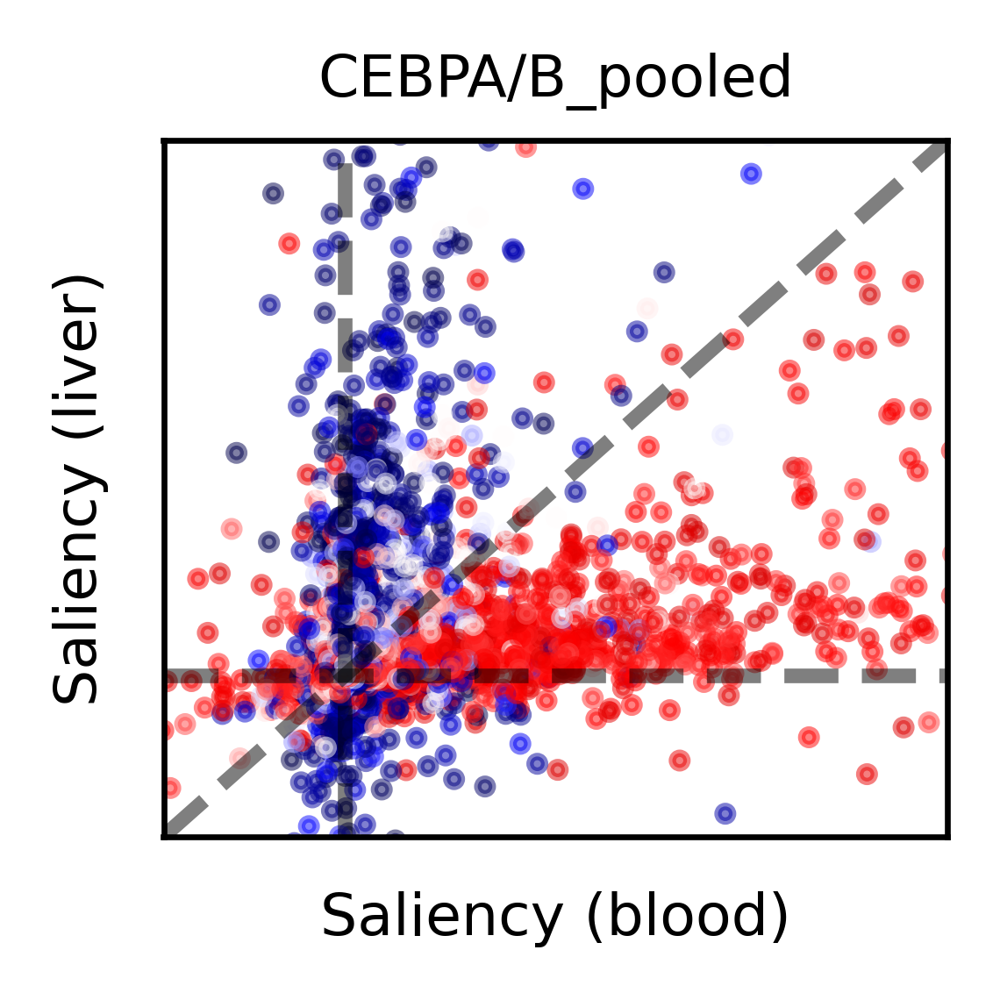

In [21]:
#Make scatter plots comparing seqlet scores across tissues for specific TFs (rasterize scatter dots)

save_figs = True
save_prefix = 'attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_pooled_'

pwm_index = [1]

tissue_1_ix = 0
tissue_2_ix = 1

grad_min = -0.15
grad_max = 0.50

min_tpm = 0.

#Loop over pwms
for pwm_i in pwm_index :

    #Get gradient scores
    scores_1 = pwm_scores[0][pwm_i][:, tissue_1_ix]
    scores_2 = pwm_scores[0][pwm_i][:, tissue_2_ix]

    #Get list of genes for seqlets
    genes = seqlet_dfs[0][pwm_i]['gene'].apply(lambda x: x.split(".")[0]).values.tolist()

    #Find log tpm values for each seqlet's gene
    tpm_1 = []
    tpm_2 = []
    keep_index = []
    for gene_i, gene in enumerate(genes) :
        if gene in tpm_dict_all :
            row_curr = tpm_df_all.iloc[tpm_dict_all[gene]]

            if row_curr[tissues[tissue_1_ix]] > min_tpm or row_curr[tissues[tissue_2_ix]] > min_tpm :
                tpm_1.append(row_curr[tissues[tissue_1_ix] + '_log2'])
                tpm_2.append(row_curr[tissues[tissue_2_ix] + '_log2'])
                keep_index.append(gene_i)
            else :
                tpm_1.append(0.)
                tpm_2.append(0.)
        else :
            tpm_1.append(0.)
            tpm_2.append(0.)

    #Get tpm vectors
    tpm_1 = np.array(tpm_1, dtype='float32')
    tpm_2 = np.array(tpm_2, dtype='float32')

    #Filter data and shuffle seqlets
    keep_index = np.array(keep_index, dtype='int32')
    np.random.shuffle(keep_index)

    #Apply filter
    scores_1 = scores_1[keep_index]
    scores_2 = scores_2[keep_index]
    tpm_1 = tpm_1[keep_index]
    tpm_2 = tpm_2[keep_index]

    n = scores_1.shape[0]

    #Calculate correlations
    r_val, _ = spearmanr(scores_1, scores_2)
    r_val_e, _ = spearmanr(scores_1 - scores_2, tpm_1 - tpm_2)

    vmax_abs = np.quantile(np.abs(np.abs(tpm_1-tpm_2)), q=0.98)

    #Print metrics
    print("Motif = '" + pwm_configs[0][pwm_i][0] + "'")
    print(" - Gradient spearman r = " + str(round(r_val, 3)))
    print(" - Residual expr spearman r = " + str(round(r_val_e, 3)))
    print(" - n = " + str(n))

    #Generate colored scatter plot
    f = plt.figure(figsize=(2, 2), dpi=600)

    plt.scatter(scores_1, scores_2, c=tpm_1-tpm_2, cmap='seismic', vmin=-vmax_abs, vmax=vmax_abs, s=4, alpha=0.5, rasterized=True)

    plt.axhline(y=0., linewidth=2, linestyle='--', color='black', alpha=0.5)
    plt.axvline(x=0., linewidth=2, linestyle='--', color='black', alpha=0.5)
    plt.plot([grad_min, grad_max], [grad_min, grad_max], linewidth=2, linestyle='--', color='black', alpha=0.5)
    
    plt.xticks([], [])
    plt.yticks([], [])

    plt.xlabel("Saliency (" + tissue_names[tissue_1_ix] + ")", fontsize=8)
    plt.ylabel("Saliency (" + tissue_names[tissue_2_ix] + ")", fontsize=8)

    plt.title(pwm_configs[0][pwm_i][0], fontsize=8)

    plt.xlim(grad_min, grad_max)
    plt.ylim(grad_min, grad_max)

    plt.tight_layout()
    
    if save_figs :
        plt.savefig(save_prefix + "_differential_scatter_pwm_" + str(pwm_i) + "_rasterized.pdf")

    plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


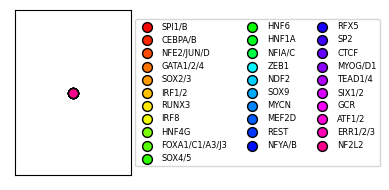

In [14]:
#Get color map

def get_cmap(n, name='hsv'):
    return plt.cm.get_cmap(name, n)

save_figs = True
save_prefix = 'attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_pos_neg_pooled_paralog_tsv_subfam_'

#Get global motif-to-color mapping
n_all = len(pwm_scores[0])
cmap = get_cmap(n_all)

#Motif names
pwm_names = np.array([
    pwm_configs[0][pwm_i][0] for pwm_i in range(len(pwm_scores[0]))
], dtype=object)

#Make dummy plot to get legend
f = plt.figure(figsize=(4, 2))

for motif_i in range(len(pwm_scores[0])) :
    if pwm_names[motif_i][:-7] != '(Empty)' :
        plt.scatter([0.], [0.], color=cmap(motif_i), label=pwm_names[motif_i][:-7], s=50, linewidth=1, edgecolor='black')

plt.xticks([], [])
plt.yticks([], [])

plt.legend(loc='center left', fontsize=6, bbox_to_anchor=(1, 0.5), ncol=3)

plt.tight_layout()

if save_figs :
    plt.savefig(save_prefix + "_motif_colors_alt.png", dpi=300, transparent=False)
    plt.savefig(save_prefix + "_motif_colors_alt.eps")

plt.show()


[aggr_str = '_qtl_0_8']
tissue_1 = 'blood'
tissue_2 = 'liver'
n = 25
r = 0.63
p = 0.0006689800511443635


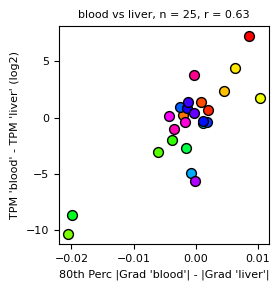

tissue_1 = 'blood'
tissue_2 = 'brain'
n = 26
r = 0.66
p = 0.00026816260242694623


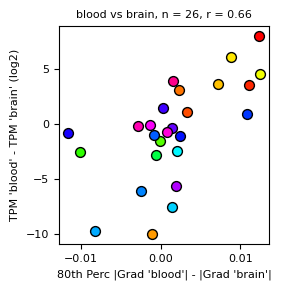

tissue_1 = 'blood'
tissue_2 = 'muscle'
n = 24
r = 0.66
p = 0.0005049286602973923


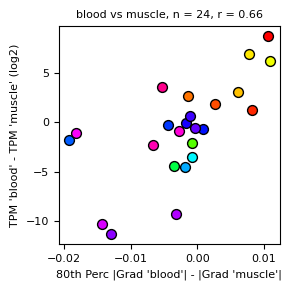

tissue_1 = 'liver'
tissue_2 = 'brain'
n = 28
r = 0.81
p = 1.2891041306036962e-07


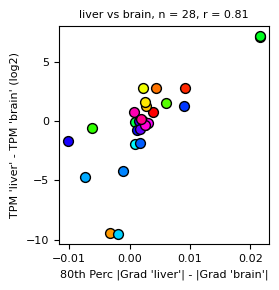

tissue_1 = 'liver'
tissue_2 = 'muscle'
n = 27
r = 0.81
p = 2.53312788417444e-07


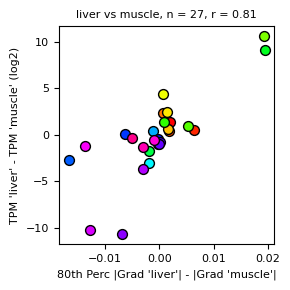

tissue_1 = 'brain'
tissue_2 = 'muscle'
n = 26
r = 0.77
p = 4.1802705025448924e-06


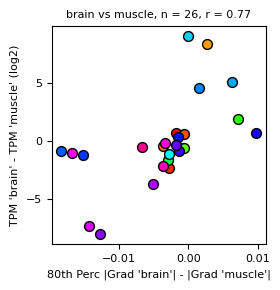

[aggr_str = '_mean']
tissue_1 = 'blood'
tissue_2 = 'liver'
n = 25
r = 0.64
p = 0.0005936019831339175


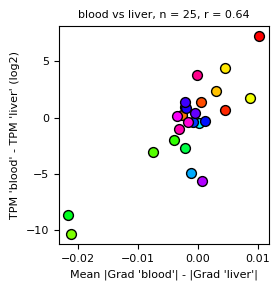

tissue_1 = 'blood'
tissue_2 = 'brain'
n = 26
r = 0.56
p = 0.003036590774460898


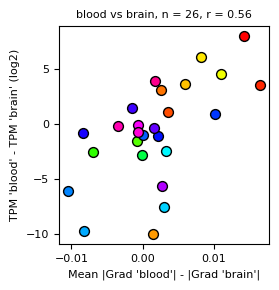

tissue_1 = 'blood'
tissue_2 = 'muscle'
n = 24
r = 0.64
p = 0.0006930942447544281


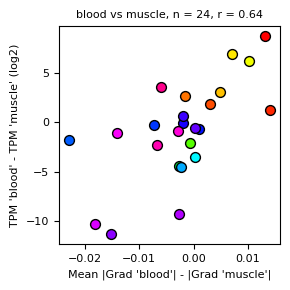

tissue_1 = 'liver'
tissue_2 = 'brain'
n = 28
r = 0.77
p = 1.7424628832859771e-06


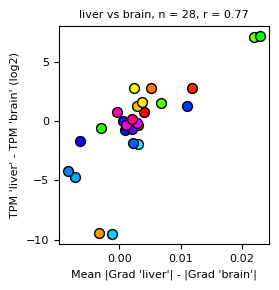

tissue_1 = 'liver'
tissue_2 = 'muscle'
n = 27
r = 0.78
p = 1.4058607527198292e-06


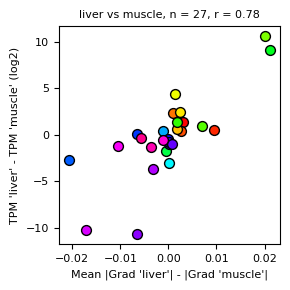

tissue_1 = 'brain'
tissue_2 = 'muscle'
n = 26
r = 0.79
p = 2.0181284899500746e-06


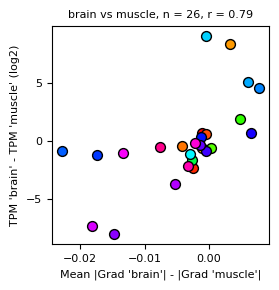

In [15]:
#Compare residual median tissue-specific gradient saliency scores across seqlets to residual GTEX TPM values in corresponding pairs of tissues

from scipy.stats import spearmanr

def _quantile_or_mean(x, q, use_quantile) :
    if use_quantile :
        return np.quantile(x, q=q)
    return np.mean(x)

#Quantile or mean scores
use_quantiles = [True, False]
qtls = [0.8, None]

min_tpm = 1.

save_figs = True
save_prefix = 'attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_pos_neg_pooled_paralog_tsv_subfam_'

tissue_pairs = [
    [0, 1],
    [0, 2],
    [0, 3],
    [1, 2],
    [1, 3],
    [2, 3],
]

#Loop over aggregation modes
for use_quantile, qtl in zip(use_quantiles, qtls) :
    
    aggr_str = '_mean' if not use_quantile else '_qtl_' + str(qtl).replace(".", "_")
    
    print("[aggr_str = '" + aggr_str + "']")

    #Loop over pairs of tissues
    for [tissue_i, tissue_j] in tissue_pairs :

        tissue_1 = tissue_names[tissue_i]
        tissue_2 = tissue_names[tissue_j]

        print("tissue_1 = '" + tissue_1 + "'")
        print("tissue_2 = '" + tissue_2 + "'")

        #Gradient saliencies
        scores_1 = np.array([
            _quantile_or_mean(np.abs(pwm_scores[0][pwm_i][:, tissue_i]), q=qtl, use_quantile=use_quantile) for pwm_i in range(len(pwm_scores[0]))
        ])
        scores_2 = np.array([
            _quantile_or_mean(np.abs(pwm_scores[0][pwm_i][:, tissue_j]), q=qtl, use_quantile=use_quantile) for pwm_i in range(len(pwm_scores[0]))
        ])

        #GTEX TPMs
        tpms_1 = np.log2(np.array([
            pwm_tpms[0][pwm_i][tissue_i] for pwm_i in range(len(pwm_tpms[0]))
        ]))
        tpms_2 = np.log2(np.array([
            pwm_tpms[0][pwm_i][tissue_j] for pwm_i in range(len(pwm_tpms[0]))
        ]))

        tpms_raw_1 = np.array([
            pwm_tpms[0][pwm_i][tissue_i] for pwm_i in range(len(pwm_tpms[0]))
        ])
        tpms_raw_2 = np.array([
            pwm_tpms[0][pwm_i][tissue_j] for pwm_i in range(len(pwm_tpms[0]))
        ])

        tpms_raw_max = np.maximum(tpms_raw_1, tpms_raw_2)

        #Motif names
        pwm_names = np.array([
            pwm_configs[0][pwm_i][0] for pwm_i in range(len(pwm_scores[0]))
        ], dtype=object)

        #Filter out NaNs
        keep_index = np.nonzero((((scores_1 != 0.) & (scores_2 != 0.)) & ((~np.isnan(tpms_1)) & (~np.isnan(tpms_2)))) & (tpms_raw_max >= min_tpm))[0]

        scores_1 = scores_1[keep_index]
        scores_2 = scores_2[keep_index]
        tpms_1 = tpms_1[keep_index]
        tpms_2 = tpms_2[keep_index]
        pwm_names = pwm_names[keep_index]

        n = scores_1.shape[0]

        r_val, p_val = spearmanr((scores_1 - scores_2), (tpms_1 - tpms_2))

        print("n = " + str(n))
        print("r = " + str(round(r_val, 2)))
        print("p = " + str(p_val))

        f = plt.figure(figsize=(3, 3))

        for motif_i in range(scores_1.shape[0]) :
            plt.scatter([(scores_1 - scores_2)[motif_i]], [(tpms_1 - tpms_2)[motif_i]], color=cmap(keep_index[motif_i]), s=50, linewidth=1, edgecolor='black') #, label=pwm_names[motif_i][:-7]

        plt.xticks(fontsize=8)
        plt.yticks(fontsize=8)

        if use_quantile :
            plt.xlabel(str(int(100 * qtl)) + "th Perc |Grad '" + tissue_1 + "'| - |Grad '" + tissue_2 + "'|", fontsize=8)
        else :
            plt.xlabel("Mean |Grad '" + tissue_1 + "'| - |Grad '" + tissue_2 + "'|", fontsize=8)

        plt.ylabel("TPM '" + tissue_1 + "' - TPM '" + tissue_2 + "' (log2)", fontsize=8)

        plt.title(tissue_1 + " vs " + tissue_2 + ", n = " + str(n) + ", r = " + str(round(r_val, 2)), fontsize=8)

        #plt.legend(loc='center left', fontsize=6, bbox_to_anchor=(1, 0.5), ncol=2)

        plt.tight_layout()

        if save_figs :
            plt.savefig(save_prefix + "_grad_vs_tpm_tissue_i_" + str(tissue_i) + "_tissue_j_" + str(tissue_j) + "_residual_abs" + aggr_str + "_alt.png", dpi=300, transparent=False)
            plt.savefig(save_prefix + "_grad_vs_tpm_tissue_i_" + str(tissue_i) + "_tissue_j_" + str(tissue_j) + "_residual_abs" + aggr_str + "_alt.eps")

        plt.show()


[aggr_str = '_qtl_0_8']
tissue_1 = 'blood'
tissue_2 = 'liver'
n = 25
r = 0.72
p = 5.091437665523911e-05


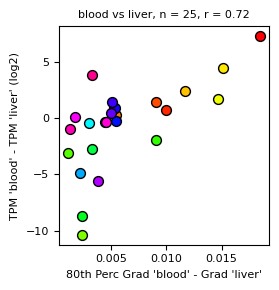

tissue_1 = 'blood'
tissue_2 = 'brain'
n = 26
r = 0.63
p = 0.0006360744047572746


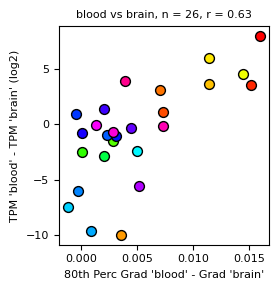

tissue_1 = 'blood'
tissue_2 = 'muscle'
n = 24
r = 0.79
p = 4.311986843446473e-06


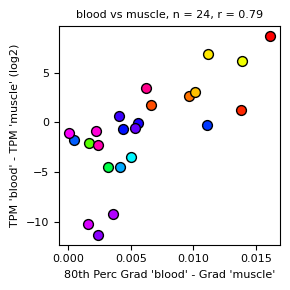

tissue_1 = 'liver'
tissue_2 = 'brain'
n = 28
r = 0.62
p = 0.00043796230041901184


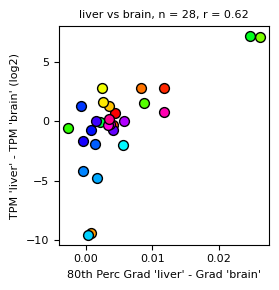

tissue_1 = 'liver'
tissue_2 = 'muscle'
n = 27
r = 0.38
p = 0.049152039190731085


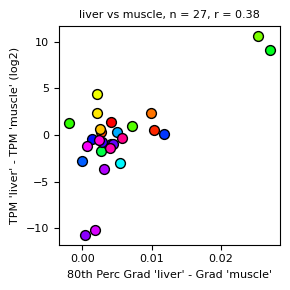

tissue_1 = 'brain'
tissue_2 = 'muscle'
n = 26
r = 0.58
p = 0.00204015545261251


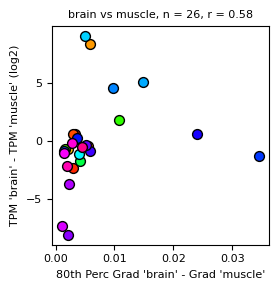

[aggr_str = '_mean']
tissue_1 = 'blood'
tissue_2 = 'liver'
n = 25
r = 0.76
p = 9.16560361677088e-06


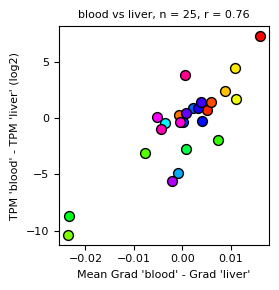

tissue_1 = 'blood'
tissue_2 = 'brain'
n = 26
r = 0.67
p = 0.00018611179897303935


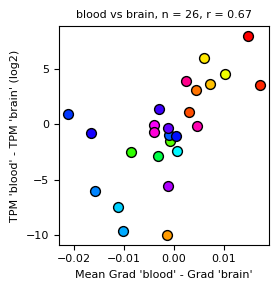

tissue_1 = 'blood'
tissue_2 = 'muscle'
n = 24
r = 0.77
p = 1.0622703168206119e-05


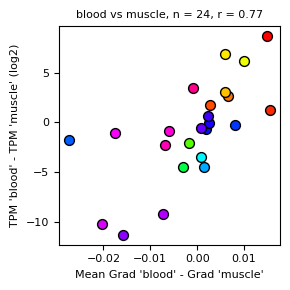

tissue_1 = 'liver'
tissue_2 = 'brain'
n = 28
r = 0.6
p = 0.0007298047381087927


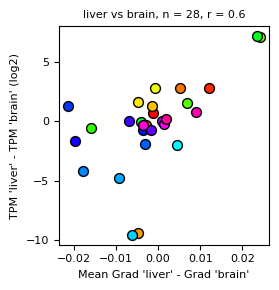

tissue_1 = 'liver'
tissue_2 = 'muscle'
n = 27
r = 0.56
p = 0.0023304732002394826


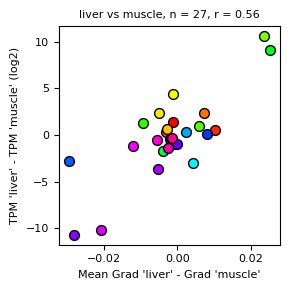

tissue_1 = 'brain'
tissue_2 = 'muscle'
n = 26
r = 0.63
p = 0.0006248575076233777


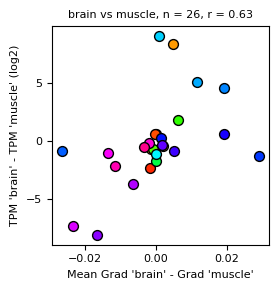

In [16]:
#Compare median residual tissue-specific gradient saliency scores across seqlets to residual GTEX TPM values in corresponding pairs of tissues

from scipy.stats import spearmanr

def _quantile_or_mean(x, q, use_quantile) :
    if use_quantile :
        return np.quantile(x, q=q)
    return np.mean(x)

#Quantile or mean scores
use_quantiles = [True, False]
qtls = [0.8, None]

min_tpm = 1.

save_figs = True
save_prefix = 'attribution_figs/modisco_gtex_diff_40k_gaussian_4_tissues_4_folds_diff_auto_pos_neg_pooled_paralog_tsv_subfam_'

tissue_pairs = [
    [0, 1],
    [0, 2],
    [0, 3],
    [1, 2],
    [1, 3],
    [2, 3],
]

#Loop over aggregation modes
for use_quantile, qtl in zip(use_quantiles, qtls) :
    
    aggr_str = '_mean' if not use_quantile else '_qtl_' + str(qtl).replace(".", "_")
    
    print("[aggr_str = '" + aggr_str + "']")

    #Loop over pairs of tissues
    for [tissue_i, tissue_j] in tissue_pairs :

        tissue_1 = tissue_names[tissue_i]
        tissue_2 = tissue_names[tissue_j]

        print("tissue_1 = '" + tissue_1 + "'")
        print("tissue_2 = '" + tissue_2 + "'")

        #Gradient saliencies
        scores = np.array([
            _quantile_or_mean(
                pwm_scores[0][pwm_i][:, tissue_i] - pwm_scores[0][pwm_i][:, tissue_j]
            , q=qtl, use_quantile=use_quantile
            ) for pwm_i in range(len(pwm_scores[0]))
        ])

        #GTEX TPMs
        tpms = np.array([
            np.log2(pwm_tpms[0][pwm_i][tissue_i]) - np.log2(pwm_tpms[0][pwm_i][tissue_j]) for pwm_i in range(len(pwm_tpms[0]))
        ])

        tpms_raw_1 = np.array([
            pwm_tpms[0][pwm_i][tissue_i] for pwm_i in range(len(pwm_tpms[0]))
        ])
        tpms_raw_2 = np.array([
            pwm_tpms[0][pwm_i][tissue_j] for pwm_i in range(len(pwm_tpms[0]))
        ])

        tpms_raw_max = np.maximum(tpms_raw_1, tpms_raw_2)

        #Motif names
        pwm_names = np.array([
            pwm_configs[0][pwm_i][0] for pwm_i in range(len(pwm_scores[0]))
        ], dtype=object)

        #Filter out NaNs
        keep_index = np.nonzero(((scores != 0.) & (~np.isnan(tpms))) & (tpms_raw_max >= min_tpm))[0]

        scores = scores[keep_index]
        tpms = tpms[keep_index]
        pwm_names = pwm_names[keep_index]

        n = scores.shape[0]

        r_val, p_val = spearmanr(scores, tpms)

        print("n = " + str(n))
        print("r = " + str(round(r_val, 2)))
        print("p = " + str(p_val))

        f = plt.figure(figsize=(3, 3))

        for motif_i in range(scores.shape[0]) :
            plt.scatter([scores[motif_i]], [tpms[motif_i]], color=cmap(keep_index[motif_i]), s=50, linewidth=1, edgecolor='black') #, label=pwm_names[motif_i][:-7]

        plt.xticks(fontsize=8)
        plt.yticks(fontsize=8)

        if use_quantile :
            plt.xlabel(str(int(100 * qtl)) + "th Perc Grad '" + tissue_1 + "' - Grad '" + tissue_2 + "'", fontsize=8)
        else :
            plt.xlabel("Mean Grad '" + tissue_1 + "' - Grad '" + tissue_2 + "'", fontsize=8)

        plt.ylabel("TPM '" + tissue_1 + "' - TPM '" + tissue_2 + "' (log2)", fontsize=8)

        plt.title(tissue_1 + " vs " + tissue_2 + ", n = " + str(n) + ", r = " + str(round(r_val, 2)), fontsize=8)

        #plt.legend(loc='center left', fontsize=6, bbox_to_anchor=(1, 0.5), ncol=2)

        plt.tight_layout()

        if save_figs :
            plt.savefig(save_prefix + "_grad_vs_tpm_tissue_i_" + str(tissue_i) + "_tissue_j_" + str(tissue_j) + "_residual_diff" + aggr_str + "_alt.png", dpi=300, transparent=False)
            plt.savefig(save_prefix + "_grad_vs_tpm_tissue_i_" + str(tissue_i) + "_tissue_j_" + str(tissue_j) + "_residual_diff" + aggr_str + "_alt.eps")

        plt.show()


Loading tomtom .tsv for tissue = 'blood'

HNF4G
['metacluster_0_pattern_6', 'metacluster_0_pattern_14', 'metacluster_0_pattern_15', 'metacluster_0_pattern_21', 'metacluster_0_pattern_49']

Loading modisco results for tissue = 'blood'

- metacluster_0_pattern_6 -


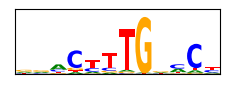

- metacluster_0_pattern_14 -


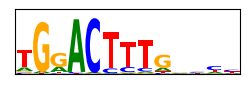

- metacluster_0_pattern_15 -


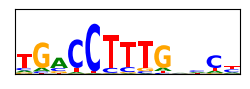

- metacluster_0_pattern_21 -


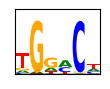

- metacluster_0_pattern_49 -


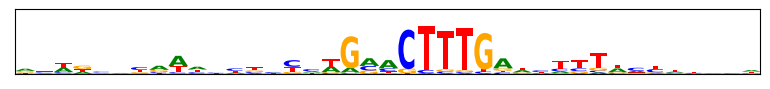

In [27]:
#Find and plot all metacluster pwms for a specific motif

save_figs = True

ic_t = 0.1
gc_content = 0.41

e_thresh = 0.1

tissue_name = 'liver'
modisco_file = 'gtex_log2fc_liver_40k_diff_4_folds/tfm.h5'
tsv_file = 'gtex_log2fc_liver_40k_diff_4_folds/tomtom_gtex_log2fc_liver_40k_diff_4_folds.tsv'

modisco_sign = 1
metacluster_index = 0

modisco_motif = 'HNF4G'

#Parse .tsv files and map motifs to modisco clusters
pwm_configs = []

#Load .tsv files
print("Loading tomtom .tsv for tissue = '" + tissue + "'")
print("")

tsv_df = pd.read_csv(tsv_file, sep='\t')

#Filter on maximum allowed E-value
tsv_df = tsv_df.loc[tsv_df['E-value'] <= e_thresh].copy().reset_index(drop=True)
    
tsv_df['metacluster'] = tsv_df['Query_ID'].apply(lambda x: x.split("etacluster_")[1].split("_pattern")[0]).astype(int)
tsv_df['pattern'] = tsv_df['Query_ID'].apply(lambda x: x.split("pattern_")[1]).astype(int)

#Get positive and negative motif hits
tsv_df_pos = tsv_df.loc[tsv_df['Query_ID'].str.contains(('metacluster_0' if modisco_sign == 1 else 'metacluster_1'))].copy().reset_index(drop=True)
tsv_df_neg = tsv_df.loc[tsv_df['Query_ID'].str.contains(('metacluster_1' if modisco_sign == 1 else 'metacluster_0'))].copy().reset_index(drop=True)

#Select position or negative hits
tsv_df = tsv_df_pos
if (modisco_sign == 1 and metacluster_index == 1) or (modisco_sign == -1 and metacluster_index == 0) :
    tsv_df = tsv_df_neg

#Get subset of hits
modisco_clusters = tsv_df.loc[tsv_df_pos['Target_ID'].str.contains(modisco_motif)]['Query_ID'].values.tolist()

print(modisco_motif)
print(str(modisco_clusters))
print("")

#Function to clip PWMs by IC
def ic_clip(pwm, threshold, background=[0.25]*4):
    
    pc = 0.001
    odds_ratio = ((pwm+pc)/(1+4*pc)) / (background[None,:])
    ic = (np.log((pwm+pc)/(1+4*pc)) / np.log(2))*pwm
    ic -= (np.log(background)*background/np.log(2))[None,:]
    ic_total = np.sum(ic,axis=1)[:,None]

    #No bp pass threshold
    if ~np.any(ic_total.flatten()>threshold):
        return None, 0, pwm.shape[0]
    else:
        left = np.where(ic_total>threshold)[0][0]
        right = np.where(ic_total>threshold)[0][-1]
        return pwm[left:(right+1)], left, right+1

#Plot modisco PWMs for motif hit
print("Loading modisco results for tissue = '" + tissue + "'")
print("")

#Load h5 file
with h5py.File(modisco_file, 'r') as tfm_h5 :
    for pwm_i, cluster in enumerate(modisco_clusters) :
        
        metacluster_ix = int(cluster.split("etacluster_")[1].split("_pattern")[0])
        pattern_ix = int(cluster.split("pattern_")[1])
                
        pwm_unclipped = tfm_h5["metacluster_idx_to_submetacluster_results"]['metacluster_' + str(metacluster_ix)]['seqlets_to_patterns_result']['patterns']['pattern_' + str(pattern_ix)]['sequence']['fwd'][()]
        if subcluster is not None :
            pwm_unclipped = np.zeros(pwm_unclipped.shape)

            total_n_seqlets = 0
            for subclust_i, subclust in enumerate(subcluster) :
                n_seqlets = tfm_h5["metacluster_idx_to_submetacluster_results"]['metacluster_' + str(metacluster_ix)]['seqlets_to_patterns_result']['patterns']['pattern_' + str(pattern_ix)]['subcluster_to_subpattern'][subclust]['seqlets_and_alnmts']['seqlets'][()].shape[0]
                pwm_unclipped += n_seqlets * tfm_h5["metacluster_idx_to_submetacluster_results"]['metacluster_' + str(metacluster_ix)]['seqlets_to_patterns_result']['patterns']['pattern_' + str(pattern_ix)]['subcluster_to_subpattern'][subclust]['sequence']['fwd'][()]
                total_n_seqlets += n_seqlets

            pwm_unclipped /= total_n_seqlets

        #Calculate AT/GC background frequencies
        at_pct = (1-gc_content)/2
        gc_pct = gc_content/2
        background = np.array([at_pct, gc_pct, gc_pct, at_pct])

        #Clip by IC
        pwm, _, _ = ic_clip(pwm_unclipped, ic_t, background)
        
        print("- " + cluster + " -")
        
        #Plot PWM
        plot_pwm(pwm, figsize=(0.2 * pwm.shape[0], 1), y_min=0., y_max=2., plot_y_ticks=False, save_figs=save_figs, fig_name="attribution_figs/" + modisco_motif.replace("/", "_") + "_" + cluster)


-- HOCOMOCO PWMs --
pwm_file = 'CEBPB_HUMAN.H11MO.0.A.pcm'
 - fwd -


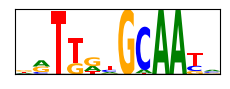

 - rev -


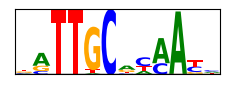

pwm_file = 'CEBPE_HUMAN.H11MO.0.A.pcm'
 - fwd -


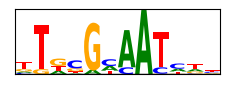

 - rev -


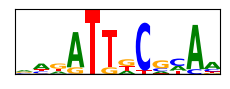

pwm_file = 'IRF1_HUMAN.H11MO.0.A.pcm'
 - fwd -


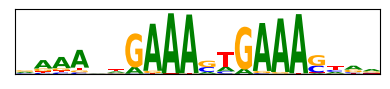

 - rev -


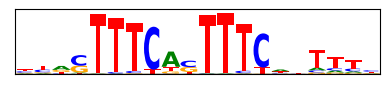

pwm_file = 'IRF2_HUMAN.H11MO.0.A.pcm'
 - fwd -


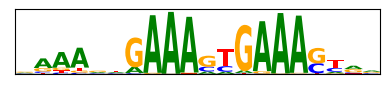

 - rev -


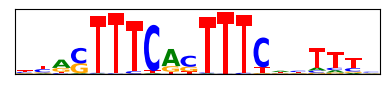

pwm_file = 'IRF8_HUMAN.H11MO.0.B.pcm'
 - fwd -


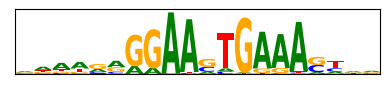

 - rev -


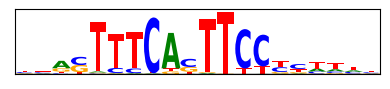

pwm_file = 'IRF4_HUMAN.H11MO.0.A.pcm'
 - fwd -


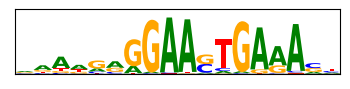

 - rev -


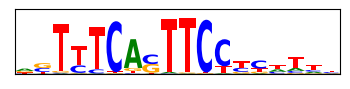

pwm_file = 'SPI1_HUMAN.H11MO.0.A.pcm'
 - fwd -


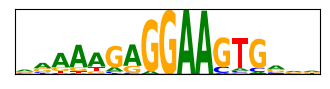

 - rev -


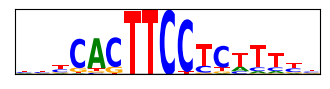

pwm_file = 'RUNX3_HUMAN.H11MO.0.A.pcm'
 - fwd -


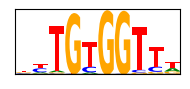

 - rev -


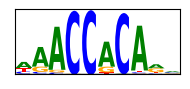

pwm_file = 'GATA1_HUMAN.H11MO.1.A.pcm'
 - fwd -


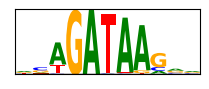

 - rev -


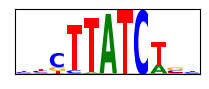

pwm_file = 'GATA2_HUMAN.H11MO.1.A.pcm'
 - fwd -


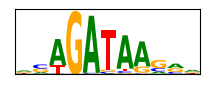

 - rev -


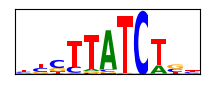

pwm_file = 'SOX9_HUMAN.H11MO.0.B.pcm'
 - fwd -


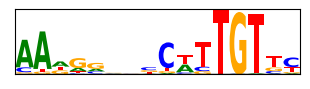

 - rev -


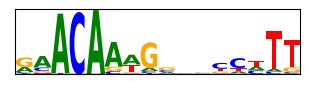

pwm_file = 'RFX5_HUMAN.H11MO.1.A.pcm'
 - fwd -


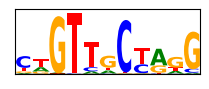

 - rev -


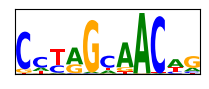

pwm_file = 'REST_HUMAN.H11MO.0.A.pcm'
 - fwd -


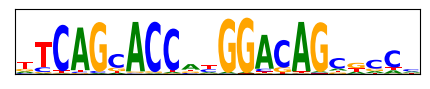

 - rev -


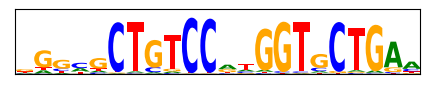

pwm_file = 'CEBPA_HUMAN.H11MO.0.A.pcm'
 - fwd -


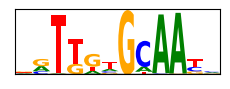

 - rev -


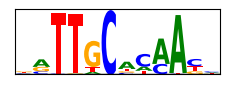

pwm_file = 'HNF4G_HUMAN.H11MO.0.B.pcm'
 - fwd -


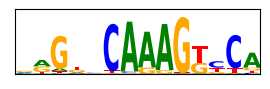

 - rev -


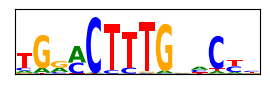

pwm_file = 'HNF6_HUMAN.H11MO.0.B.pcm'
 - fwd -


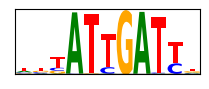

 - rev -


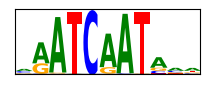

pwm_file = 'HNF1A_HUMAN.H11MO.0.C.pcm'
 - fwd -


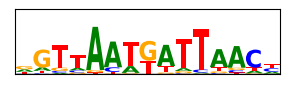

 - rev -


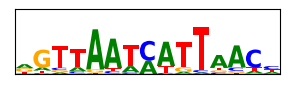

pwm_file = 'MEF2D_HUMAN.H11MO.0.A.pcm'
 - fwd -


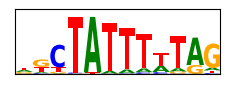

 - rev -


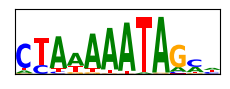

pwm_file = 'MYOD1_HUMAN.H11MO.1.A.pcm'
 - fwd -


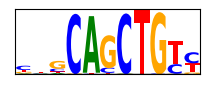

 - rev -


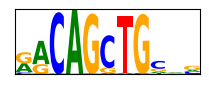

pwm_file = 'SIX1_HUMAN.H11MO.0.A.pcm'
 - fwd -


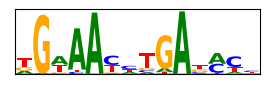

 - rev -


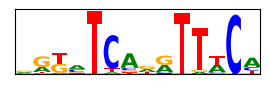

pwm_file = 'TWST1_HUMAN.H11MO.0.A.pcm'
 - fwd -


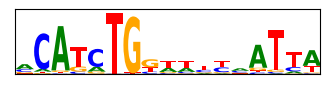

 - rev -


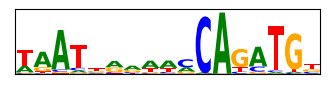

pwm_file = 'P53_HUMAN.H11MO.0.A.pcm'
 - fwd -


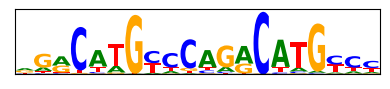

 - rev -


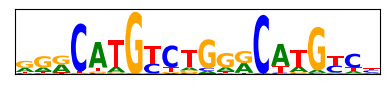

pwm_file = 'SRF_HUMAN.H11MO.0.A.pcm'
 - fwd -


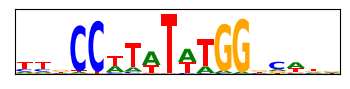

 - rev -


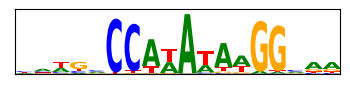

pwm_file = 'COT2_HUMAN.H11MO.0.A.pcm'
 - fwd -


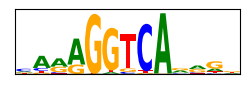

 - rev -


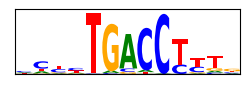

pwm_file = 'COT2_HUMAN.H11MO.1.A.pcm'
 - fwd -


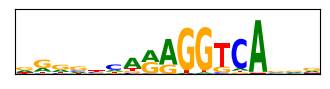

 - rev -


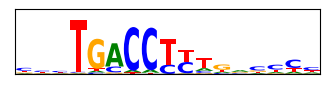

pwm_file = 'FOXO4_HUMAN.H11MO.0.C.pcm'
 - fwd -


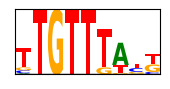

 - rev -


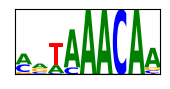

pwm_file = 'SP3_HUMAN.H11MO.0.B.pcm'
 - fwd -


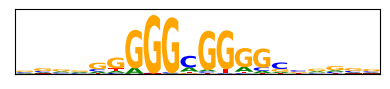

 - rev -


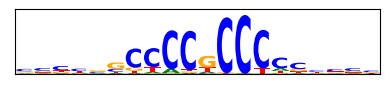

In [3]:
#Plot measured motif PWMs from HOCOMOCO v11

save_figs = True

pwm_files = [
    #Blood
    'CEBPB_HUMAN.H11MO.0.A.pcm',
    'CEBPE_HUMAN.H11MO.0.A.pcm',
    'IRF1_HUMAN.H11MO.0.A.pcm',
    'IRF2_HUMAN.H11MO.0.A.pcm',
    'IRF8_HUMAN.H11MO.0.B.pcm',
    'IRF4_HUMAN.H11MO.0.A.pcm',
    'SPI1_HUMAN.H11MO.0.A.pcm',
    'RUNX3_HUMAN.H11MO.0.A.pcm',
    'GATA1_HUMAN.H11MO.1.A.pcm',
    'GATA2_HUMAN.H11MO.1.A.pcm',
    
    #Brain
    'SOX9_HUMAN.H11MO.0.B.pcm',
    'RFX5_HUMAN.H11MO.1.A.pcm',
    'REST_HUMAN.H11MO.0.A.pcm',
    
    #Liver
    'CEBPA_HUMAN.H11MO.0.A.pcm',
    'HNF4G_HUMAN.H11MO.0.B.pcm',
    'HNF6_HUMAN.H11MO.0.B.pcm',
    'HNF1A_HUMAN.H11MO.0.C.pcm',
    
    #Muscle
    'MEF2D_HUMAN.H11MO.0.A.pcm',
    'MYOD1_HUMAN.H11MO.1.A.pcm',
    'SIX1_HUMAN.H11MO.0.A.pcm',
    
    #Esophagus
    'TWST1_HUMAN.H11MO.0.A.pcm',
    'P53_HUMAN.H11MO.0.A.pcm',
    'SRF_HUMAN.H11MO.0.A.pcm',
    'COT2_HUMAN.H11MO.0.A.pcm',
    'COT2_HUMAN.H11MO.1.A.pcm',
    
    #Extra
    'FOXO4_HUMAN.H11MO.0.C.pcm',
    'SP3_HUMAN.H11MO.0.B.pcm',
]

print("-- HOCOMOCO PWMs --")

#Plot PWMs
for pwm_i, pwm_file in enumerate(pwm_files) :
    
    print("pwm_file = '" + str(pwm_file) + "'")
    
    pwm = []
    with open(pwm_file, 'rt') as f :
        for line_i, line in enumerate(f.readlines()) :
            if line_i > 0 :
                pwm.append([
                    float(l_str) for l_str in line.split('\t')
                ])
    
    pwm = np.array(pwm, dtype='float32')
    pwm /= np.sum(pwm, axis=-1)[:, None]
    
    print(" - fwd -")
    plot_pwm(pwm, figsize=(0.2 * pwm.shape[0], 1), y_min=0., y_max=2., plot_y_ticks=False, save_figs=save_figs, fig_name="attribution_figs/" + pwm_file + "_pwm")
    
    print(" - rev -")
    plot_pwm(pwm[::-1, ::-1], figsize=(0.2 * pwm.shape[0], 1), y_min=0., y_max=2., plot_y_ticks=False, save_figs=save_figs, fig_name="attribution_figs/" + pwm_file + "_pwm_rev")
